# Passo 1: Pré processamento e EDA

## Importação de bibliotecas

In [86]:
# Bibliotecas para manipulação de dados e plots
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Bibliotecas para preprocessamento e métricas de avaliação de modelos
from sklearn.model_selection import cross_validate,train_test_split
from sklearn.feature_selection import mutual_info_classif
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score,roc_curve,roc_auc_score,classification_report,confusion_matrix,precision_recall_curve,PrecisionRecallDisplay
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer,StandardScaler
from sklearn.feature_selection import mutual_info_classif

# Bibliotecas com os modelos de classificação
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

#Biblioteca para otimização de hiperparâmetros
import optuna
from optuna.visualization import plot_contour
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice


# Configurações para padronização dos gráficos
# Para ver todos os parâmetros usar o comando plt.rcParams.keys()
sns.set(rc={
                    'axes.labelsize': 12.0,
                    'axes.titlecolor': 'black',
                    'axes.titleweight': 'bold',
                    'axes.labelweight': 'bold',
                    'axes.titlesize': 20.0,
                    'figure.figsize': [15,10],
                    'figure.titlesize': 'xx-large',
                    'figure.titleweight': 'bold',
                    })

## Analisando a consistência dos dados

In [87]:
#Lendo os datasets que serão trabalhados
#Data set de treino, validação e teste
df_inicial = pd.read_csv('COVID.csv')

#Data set de produção
df_prod_inicial = pd.read_csv('COVID_subm.csv')

In [88]:
#verificando se existe algum dado duplicado
df_inicial[df_inicial.duplicated()], df_prod_inicial[df_prod_inicial.duplicated()]

(Empty DataFrame
 Columns: [Unnamed: 0, sex, patient_type, intubed, pneumonia, age, pregnancy, diabetes, copd, asthma, inmsupr, hypertension, other_disease, cardiovascular, obesity, renal_chronic, tobacco, contact_other_covid, covid_res, icu]
 Index: [],
 Empty DataFrame
 Columns: [Unnamed: 0, sex, patient_type, intubed, pneumonia, age, pregnancy, diabetes, copd, asthma, inmsupr, hypertension, other_disease, cardiovascular, obesity, renal_chronic, tobacco, contact_other_covid, icu]
 Index: [])

Como não existem dados duplicados, são todos pacientes diferentes, já droparemos a coluna de ID do paciente

In [89]:
df_inicial = df_inicial.iloc[:,1:]
df_prod_inicial = df_prod_inicial.iloc[:,1:]

In [90]:
df_inicial.head().T #Dataset foi transposto somente para facilitar a visualização

,0,1,2,3,4
sex,0.0,0.0,1.0,0.0,1.0
patient_type,1.0,1.0,0.0,0.0,0.0
intubed,NaN,NaN,0.0,0.0,0.0
pneumonia,0.0,0.0,0.0,1.0,0.0
age,27.0,24.0,54.0,30.0,60.0
pregnancy,NaN,NaN,0.0,NaN,0.0
diabetes,0.0,0.0,0.0,0.0,1.0
copd,0.0,0.0,0.0,0.0,0.0
asthma,0.0,0.0,0.0,0.0,0.0
inmsupr,0.0,0.0,0.0,0.0,0.0


In [91]:
df_prod_inicial.head().T #Dataset foi transposto somente para facilitar a visualização

,0,1,2,3,4
sex,1.0,0.0,0.0,1.0,0.0
patient_type,1.0,1.0,1.0,1.0,0.0
intubed,NaN,NaN,NaN,NaN,0.0
pneumonia,0.0,0.0,0.0,0.0,0.0
age,35.0,26.0,57.0,40.0,55.0
pregnancy,0.0,NaN,NaN,0.0,NaN
diabetes,0.0,0.0,0.0,0.0,0.0
copd,0.0,0.0,0.0,0.0,0.0
asthma,0.0,0.0,0.0,0.0,0.0
inmsupr,0.0,0.0,0.0,0.0,0.0


In [92]:
# verificando o tipo de cada coluna e a presença/ausência de missings
df_inicial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499692 entries, 0 to 499691
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   sex                  499692 non-null  int64  
 1   patient_type         499692 non-null  int64  
 2   intubed              107424 non-null  float64
 3   pneumonia            499681 non-null  float64
 4   age                  499692 non-null  int64  
 5   pregnancy            245258 non-null  float64
 6   diabetes             498051 non-null  float64
 7   copd                 498246 non-null  float64
 8   asthma               498250 non-null  float64
 9   inmsupr              498030 non-null  float64
 10  hypertension         498203 non-null  float64
 11  other_disease        497499 non-null  float64
 12  cardiovascular       498183 non-null  float64
 13  obesity              498222 non-null  float64
 14  renal_chronic        498216 non-null  float64
 15  tobacco          

O dataset tem um volume expressivo de linhas e 19 colunas, sendo que algumas delas tem um elevado volume de missings. Todas as colunas são numéricas

In [93]:
df_prod_inicial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   sex                  1000 non-null   int64  
 1   patient_type         1000 non-null   int64  
 2   intubed              229 non-null    float64
 3   pneumonia            1000 non-null   float64
 4   age                  1000 non-null   int64  
 5   pregnancy            482 non-null    float64
 6   diabetes             996 non-null    float64
 7   copd                 997 non-null    float64
 8   asthma               996 non-null    float64
 9   inmsupr              997 non-null    float64
 10  hypertension         997 non-null    float64
 11  other_disease        997 non-null    float64
 12  cardiovascular       997 non-null    float64
 13  obesity              996 non-null    float64
 14  renal_chronic        997 non-null    float64
 15  tobacco              996 non-null    fl

O dataset de produção tem volume de dados bem menor e não tem a coluna que diz se a pessoa pegou covid ou não, como esperado. Em relação ao tipo de dados, todos são numéricos também e temos algumas colunas com % elevado de missings

In [94]:
# Para verificar o % de missings dos dois datasets e ordenar pelo volume de dados faltantes
display('#################### Missings de treino (%) ####################',
        df_inicial.isna().mean().sort_values(ascending=False),
        '#################### Missings de produção (%) ####################',
        df_prod_inicial.isna().mean().sort_values(ascending=False))

'#################### Missings de treino (%) ####################'

icu                    0.785022
intubed                0.785020
pregnancy              0.509182
contact_other_covid    0.307539
other_disease          0.004389
inmsupr                0.003326
diabetes               0.003284
tobacco                0.003160
cardiovascular         0.003020
hypertension           0.002980
renal_chronic          0.002954
obesity                0.002942
copd                   0.002894
asthma                 0.002886
pneumonia              0.000022
patient_type           0.000000
age                    0.000000
covid_res              0.000000
sex                    0.000000
dtype: float64

'#################### Missings de produção (%) ####################'

icu                    0.771
intubed                0.771
pregnancy              0.518
contact_other_covid    0.330
tobacco                0.004
diabetes               0.004
asthma                 0.004
obesity                0.004
other_disease          0.003
renal_chronic          0.003
cardiovascular         0.003
inmsupr                0.003
hypertension           0.003
copd                   0.003
patient_type           0.000
age                    0.000
pneumonia              0.000
sex                    0.000
dtype: float64

As colunas com dados missings no dataset são:
- icu
- intubed
- pregnancy
- contact_other_covid
- other_disease
- inmsupr
- diabetes
- tabacco
- cardiovascular
- hypertension
- renal_chronic
- obesity
- copd
- asthma
- pneumonia

E no dataset de produção temos:
- icu                    
- intubed                
- pregnancy              
- contact_other_covid    
- tobacco                
- diabetes               
- asthma                 
- obesity                
- other_disease          
- renal_chronic          
- cardiovascular         
- inmsupr                
- hypertension           
- copd

Iremos olhar para cada uma dessas colunas e implementar uma estratégia de tratamento de missings

As colunas icu (internação na uti) e intubed (paciente foi intubado ou não) tem grande relação com a coluna de dipensa/internção do paciente

In [95]:
df_inicial[['icu','intubed','patient_type']]

,icu,intubed,patient_type
0,NaN,NaN,1
1,NaN,NaN,1
2,0.0,0.0,0
3,0.0,0.0,0
4,0.0,0.0,0
...,...,...,...
499687,NaN,NaN,1
499688,0.0,1.0,0
499689,NaN,NaN,1
499690,NaN,NaN,1


In [96]:
df_prod_inicial[['icu','intubed','patient_type']]

,icu,intubed,patient_type
0,NaN,NaN,1
1,NaN,NaN,1
2,NaN,NaN,1
3,NaN,NaN,1
4,0.0,0.0,0
...,...,...,...
995,NaN,NaN,1
996,NaN,NaN,1
997,NaN,NaN,1
998,NaN,NaN,1


Parece que os pacientes com missing nas colunas icu e intubed tem as colunas patiente type preenchida

In [97]:

print('Missings ICU que foram dispensados (1) ou internados (0)')
#Dataset filtrado somente onde ICU é missing
df_experimental = df_inicial.loc[df_inicial['icu'].isnull(),['patient_type','covid_res']]
print(df_experimental['patient_type'].value_counts())

print('Missings intubed que foram dispensados (1) ou internados (0)')
#Dataset filtrado somente onde intubed é missing
df_experimental = df_inicial.loc[df_inicial['intubed'].isnull(),['patient_type','covid_res']]
print(df_experimental['patient_type'].value_counts())

Missings ICU que foram dispensados (1) ou internados (0)
1    392146
0       123
Name: patient_type, dtype: int64
Missings intubed que foram dispensados (1) ou internados (0)
1    392146
0       122
Name: patient_type, dtype: int64


É possível perceber que a maioria dos pacientes com ICU e intubed missing foram dispensados para casa, ou seja, não passaram pela ICU e não precisaram ser intubados, neles o preenchimento será feito com 0. No entanto alguns pacientes foram internados. 
Como o número de pacientes internados  e que são missing em ICU e em intubed é o mesmo, vamos considerar que esses pacientes foram internados na ICU e entubados, preenchendo esses casos com 1

Vamos agora olhar para a coluna pregnancy

In [98]:
# Mascaras para filtrar somente pelas colunas onde o sexo é homem e mulher
mask_male = df_inicial['sex']==0
mask_female = df_inicial['sex']==1

display(df_inicial.loc[mask_male,['pregnancy','sex']],
        df_inicial.loc[mask_female,['pregnancy','sex']])

,pregnancy,sex
0,NaN,0
1,NaN,0
3,NaN,0
5,NaN,0
6,NaN,0
...,...,...
499679,NaN,0
499681,NaN,0
499683,NaN,0
499687,NaN,0


,pregnancy,sex
2,0.0,1
4,0.0,1
7,0.0,1
8,0.0,1
9,0.0,1
...,...,...
499685,0.0,1
499686,0.0,1
499689,0.0,1
499690,0.0,1


In [99]:
# verificando a quantidade de dados missings de acordo com o sexo
display(
    df_inicial.loc[mask_male,['pregnancy','sex']].isna().mean(),
    df_inicial.loc[mask_female,['pregnancy','sex']].isna().mean()
)

pregnancy    1.0
sex          0.0
dtype: float64

pregnancy    0.005418
sex          0.000000
dtype: float64

Quando o sex é masculino, os missings são devidos aos homens não ficarem grávidos e dessa forma terão seus valores preenchidos com 0. Para as mulheres um volume bem pouco expressivo de missings ainda existe e vamos analisar se temos alguma coluna que tem alta correlação com a coluna de pregancy

<AxesSubplot:>

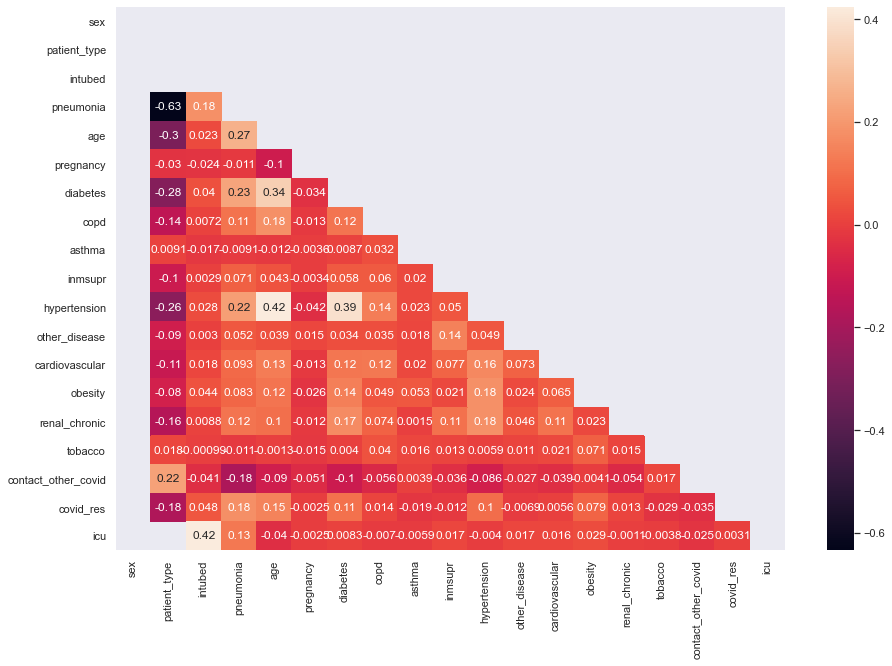

In [100]:

#criando a matriz de correlação para o dataset somente das pacientes mulheres
corr_matrix = df_inicial.loc[mask_female,:].corr()
#plotando o heatmap para facilitar a visulização. A mascara foi usada para cortar a matriz ao meio e deixar
#a visualização menos poluída
sns.heatmap(corr_matrix,annot=True,mask=np.triu(corr_matrix))

Nenhuma coluna apresenta alta correlação com a coluna pregnancy e como o volume de missings é pouco expressivo faremos o preenchimento com a moda.

A proxima coluna analisada será se o paciente teve contato com outros pacientes com covid

Um possível estratégia aqui seria olhar para a coluna do resultado do teste com covid e, caso o teste dê positivo, assumir que a pessoa teve contato com alguém com covid. No entanto essa abordagem teria alguns erros, sendo eles:
- target leak
- impossibilidade de realizar o mesmo preenchimento na base de produção
- assumir algo que pode não ser verdade já que a contaminação pode ter ocorrido sem contato com outra pessoa

Dessa forma, faremos o preenchimento com base na moda

O restante das colunas com missings faremos o preenchimento de forma semelhante, já que é um baixíssimo percentual de missings

Para deixar nosso código mais organizado, irei reunir em uma função todos os tratamentos de missings

In [101]:
def cleaning (df_inicial,df_prod_inicial):
    '''
    Função recebe o dataset inicial e o dataset inicial de produção. Realiza o tratamento dos dados missings
    e retorna os datasets tratados
    '''
    
    #Criando novos data set para que os antigos fiquem preservados
    df_tratado = df_inicial.copy()
    df_prod_tratado = df_prod_inicial.copy()

    # 1) Preenchimento de missings das colunas icu e intubed
    #Colunas icu e intubed com paciente dispensados recebem 0 e com pacientes internados recebem 1
    #Faremos isso para o dataset de produção e para o dataset de treino/validação/teste
    df_tratado.loc[((df_tratado['patient_type']==1) & (df_tratado['icu'].isnull())),'icu'] = 0
    df_tratado.loc[((df_tratado['patient_type']==1) & (df_tratado['intubed'].isnull())),'intubed'] = 0
    
    df_tratado.loc[((df_tratado['patient_type']==0) & (df_tratado['icu'].isnull())),'icu'] = 1
    df_tratado.loc[((df_tratado['patient_type']==0) & (df_tratado['intubed'].isnull())),'intubed'] = 1

    df_prod_tratado.loc[((df_prod_tratado['patient_type']==1) & (df_prod_tratado['icu'].isnull())),'icu'] = 0
    df_prod_tratado.loc[((df_prod_tratado['patient_type']==1) & (df_prod_tratado['intubed'].isnull())),'intubed'] = 0
    
    df_prod_tratado.loc[((df_prod_tratado['patient_type']==0) & (df_prod_tratado['icu'].isnull())),'icu'] = 1
    df_prod_tratado.loc[((df_prod_tratado['patient_type']==0) & (df_prod_tratado['intubed'].isnull())),'intubed'] = 1

    # 2) Preenchimento de missings da coluna pregnancy
    mask_male = df_inicial['sex']==0
    mask_female = df_inicial['sex']==1
    mode_female = df_inicial.loc[mask_female,'pregnancy'].mode()[0] #calculando a moda
    
    #Preenchimento das colunas de sexo masculino
    df_tratado.loc[((mask_male) & (df_tratado['pregnancy'].isnull())),'pregnancy'] = 0
    df_prod_tratado.loc[((mask_male) & (df_prod_tratado['pregnancy'].isnull())),['pregnancy']] = 0
    
    #Preenchimento das colunas de sexo femino
    #Os dados de produção serão preenchidos usando a moda dos dados que usaremos para treino para que nossos
    #modelos não tenham qualquer tipo de contato com dados de produção
    df_tratado.loc[((mask_female) & (df_tratado['pregnancy'].isnull())),'pregnancy'] = mode_female
    df_prod_tratado.loc[((mask_female) & (df_prod_tratado['pregnancy'].isnull())),'pregnancy'] = mode_female
    
    # 3) Preenchimento de missings das colunas restantes
    colunas_missing = ['contact_other_covid', 'other_disease', 'inmsupr', 'diabetes',
       'tobacco', 'cardiovascular', 'hypertension', 'renal_chronic', 'obesity',
       'copd', 'asthma', 'pneumonia']
    
    for coluna in colunas_missing:
        #Os dados de produção serão preenchidos usando a moda dos dados que usaremos para treino para que nossos
        #modelos não tenham qualquer tipo de contato com dados de produção
        mode = df_tratado[coluna].mode()[0]
        #Preenche os missings com a moda
        df_tratado.loc[df_tratado[coluna].isnull(),coluna] = mode
        #Preenche os missings com a moda
        df_prod_tratado.loc[df_prod_tratado[coluna].isnull(),coluna] = mode
        
    return df_tratado, df_prod_tratado

In [102]:
#Chamando a função e criando os datasets tratados
df_tratado, df_prod_tratado = cleaning(df_inicial,df_prod_inicial)

In [103]:
display(
        df_tratado.isna().sum(),
        df_prod_tratado.isna().sum()
        )

sex                    0
patient_type           0
intubed                0
pneumonia              0
age                    0
pregnancy              0
diabetes               0
copd                   0
asthma                 0
inmsupr                0
hypertension           0
other_disease          0
cardiovascular         0
obesity                0
renal_chronic          0
tobacco                0
contact_other_covid    0
covid_res              0
icu                    0
dtype: int64

sex                    0
patient_type           0
intubed                0
pneumonia              0
age                    0
pregnancy              0
diabetes               0
copd                   0
asthma                 0
inmsupr                0
hypertension           0
other_disease          0
cardiovascular         0
obesity                0
renal_chronic          0
tobacco                0
contact_other_covid    0
icu                    0
dtype: int64

Agora todos os dados missings foram tratados, vamos olhar para os outliers

In [104]:
#Para visualizarmos as principais métricas
df_tratado.describe().T

,count,mean,std,min,25%,50%,75%,max
sex,499692.0,0.493492,0.499958,0.0,0.0,0.0,1.0,1.0
patient_type,499692.0,0.784775,0.410978,0.0,1.0,1.0,1.0,1.0
intubed,499692.0,0.018461,0.134613,0.0,0.0,0.0,0.0,1.0
pneumonia,499692.0,0.157529,0.364299,0.0,0.0,0.0,0.0,1.0
age,499692.0,42.545942,16.640391,0.0,31.0,41.0,53.0,120.0
pregnancy,499692.0,0.007232,0.084736,0.0,0.0,0.0,0.0,1.0
diabetes,499692.0,0.124775,0.330464,0.0,0.0,0.0,0.0,1.0
copd,499692.0,0.016562,0.127624,0.0,0.0,0.0,0.0,1.0
asthma,499692.0,0.032448,0.177187,0.0,0.0,0.0,0.0,1.0
inmsupr,499692.0,0.016152,0.126060,0.0,0.0,0.0,0.0,1.0


Tirando a coluna idade, parece que todos os dados estão consistentes. Vamos analisar a coluna idade mais de perto

Na coluna idade temos várias idades com 0 anos, o que podem ser bebes mas vale a pena investigar. Também temos pessoas com mais de 100 anos, o que não é comum.

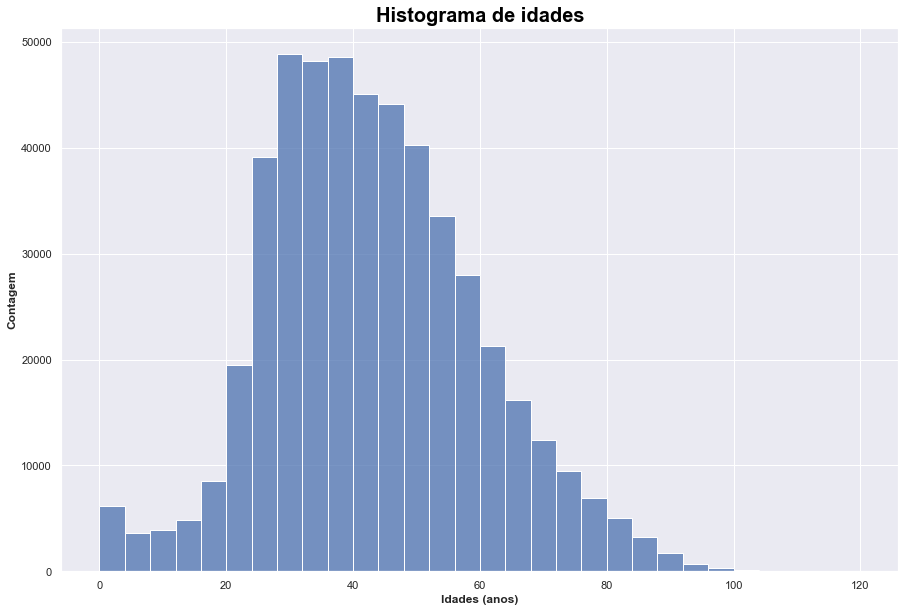

In [105]:
#Plotando o gráfico
graph = sns.histplot(data=df_tratado,x='age',bins=30);
#Formatando o gráfico
graph.set_title('Histograma de idades')
graph.set_xlabel('Idades (anos)')
graph.set_ylabel('Contagem');

A Maior parte das pessoas fazendo os testes se encontra entre 40 e 55 anos de idade. Muita gente fora do grupo de risco (acima de 60 anos)

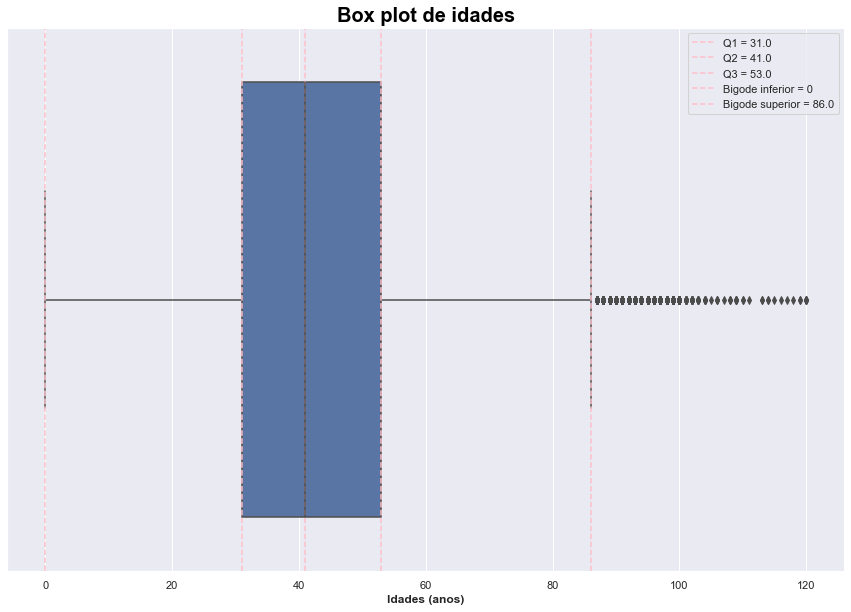

In [106]:
#Criando um boxplot com as idades
graph = sns.boxplot(data=df_tratado,x='age')
graph.set_title('Box plot de idades')
graph.set_xlabel('Idades (anos)')

#calculando cada quantil, as distâncias interquantis e os bigodes
q1 = np.quantile(a=df_tratado['age'],q = 0.25)
q2 = np.quantile(a=df_tratado['age'],q = 0.5)
q3 = np.quantile(a=df_tratado['age'],q = 0.75)
interquantile_dist = 1.5*(q3-q1)
bigode_superior = q3 + interquantile_dist
bigode_inferior = df_tratado['age'].min()

#plotando as linhas vertificais para mostrando onde cada distância se encontra
graph.axvline(x= q1,label=f'Q1 = {q1}',color='pink',ls='--')
graph.axvline(x= q2,label=f'Q2 = {q2}',color='pink',ls='--')
graph.axvline(x= q3,label=f'Q3 = {q3}',color='pink',ls='--')
graph.axvline(x= bigode_inferior,label=f'Bigode inferior = {bigode_inferior}',color='pink',ls='--')
graph.axvline(x= bigode_superior,label=f'Bigode superior = {bigode_superior}',color='pink',ls='--')

graph.legend();

Idades acima de 86 anos estão sendo consideradas outliers. Vamos analisar o volume de idades acima desse número

In [107]:
#Criando um filtro para idades acima de 86
filter = df_tratado['age']>86

#Calculando o volume de outliers (acima do bigode superior)
num_out = df_tratado.loc[filter,:].shape[0]
relevância = num_out/ df_tratado.shape[0]

print('vol de outliers idade: ',num_out)
print(f'relevância outliers idade: {relevância*100:.2f} %')

vol de outliers idade:  3588
relevância outliers idade: 0.72 %


Um volume bem pouco relevante. Por hora iremos mantê-los no nosso dataset. Agora iremos iniciar o processo de EDA

## EDA

Vamos começar analisando o balanceamento da nossa variável target

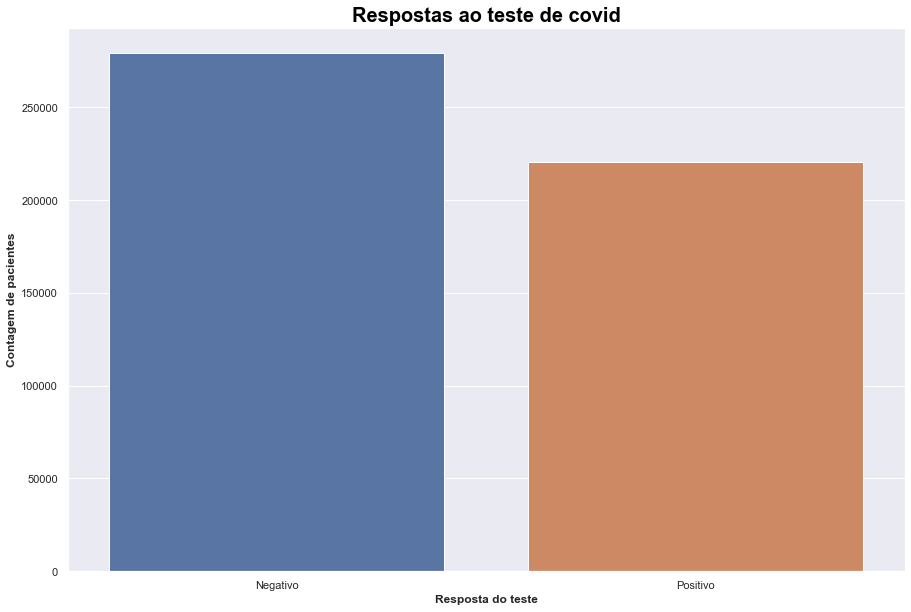

In [108]:
#Criando uma cópia da coluna target e atribuindo a variável y
y = df_tratado['covid_res'].copy()

#Criando um countplot
graph = sns.countplot(x=y)
graph.set_title('Respostas ao teste de covid')
graph.set_xlabel('Resposta do teste')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Negativo','Positivo']);

In [109]:
print("Percentual de cada resultado do teste: (0) - Negativo e (1) - Positivo")
df_tratado['covid_res'].value_counts(normalize=True)

Percentual de cada resultado do teste: (0) - Negativo e (1) - Positivo


0    0.558414
1    0.441586
Name: covid_res, dtype: float64

A amostra está balanceada

<AxesSubplot:>

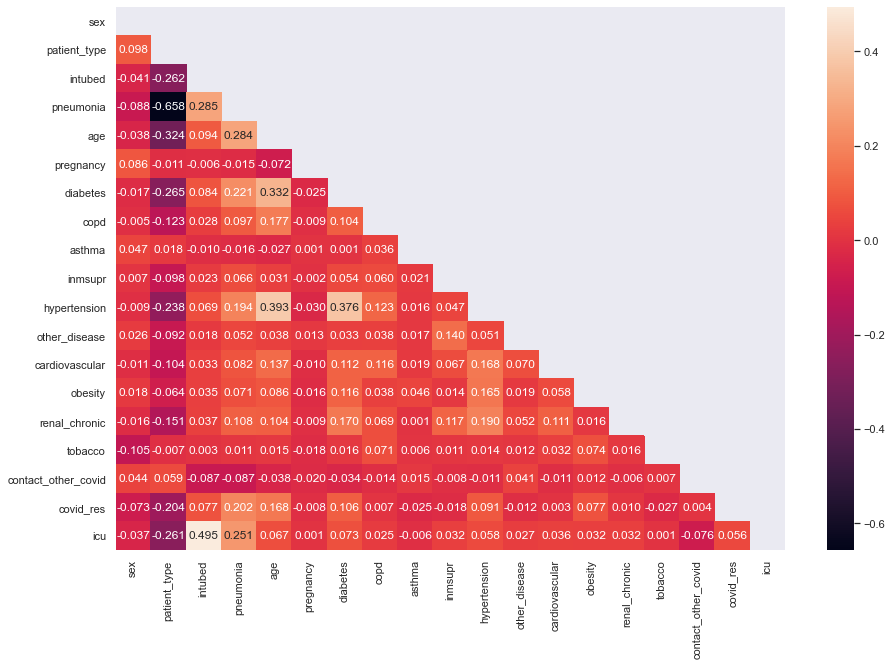

In [110]:
#varíavel que armazena a matriz de correlação
data = df_tratado.corr()
# a mascara foi usada para remover a parte de cima da matriz de correlação
mask = np.triu(data)
# o parâmetro fmt foi usado para deixar 3 casas decimais
sns.heatmap(data=data,annot=True,mask=mask,fmt='.3f')

Usamos o heatmap ao invés do pairplot, devido a maioria das variáveis serem binárias. Dessa forma, o pairplot não seria de muita utilidade. 

Vemos que: 
- A intubação tem uma correlação mediana com a internação na icu 
- A pneumonia tem uma correlação interessante com a intubação. O restante dos dados tem uma correlação bem fraca

Vamos olhar como está a proporção entre cada um dos valores das colunas

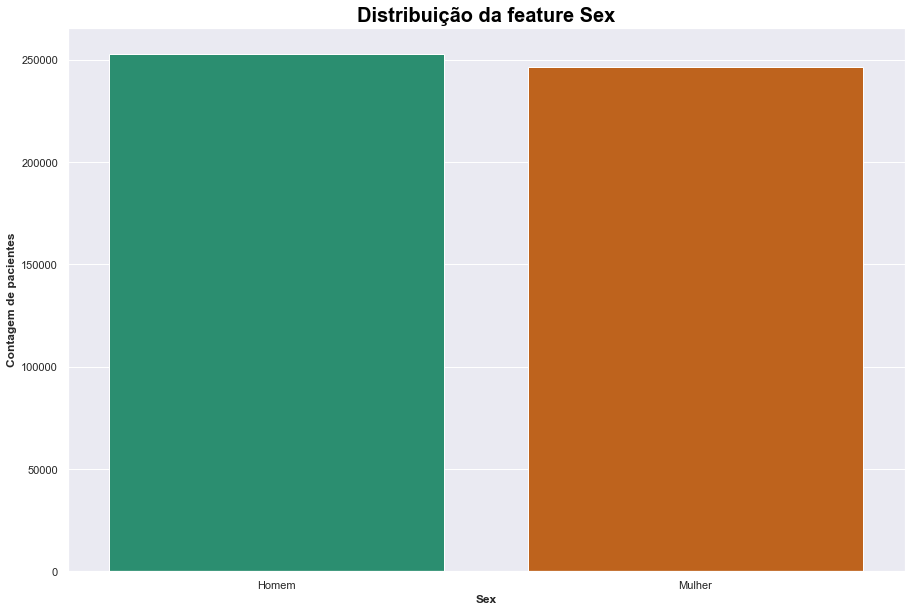

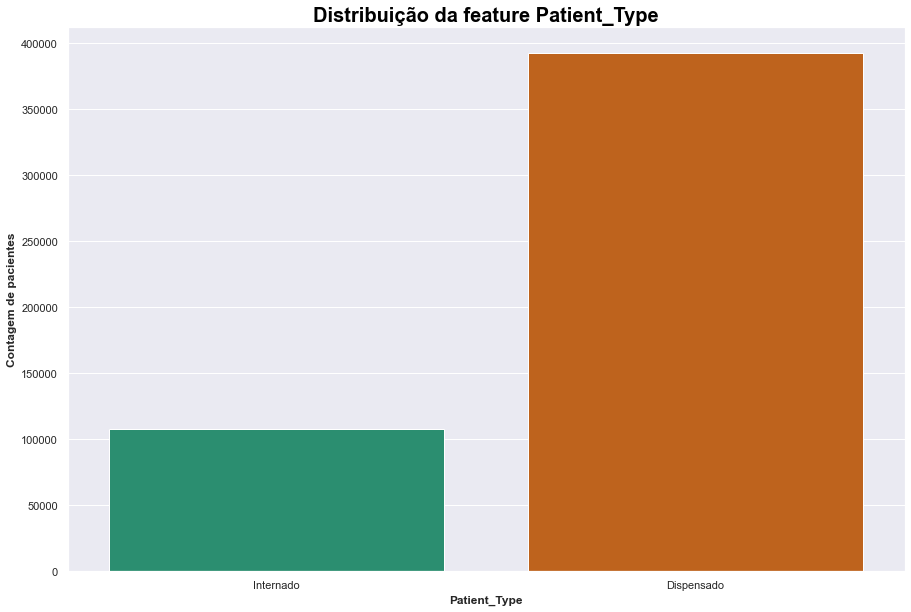

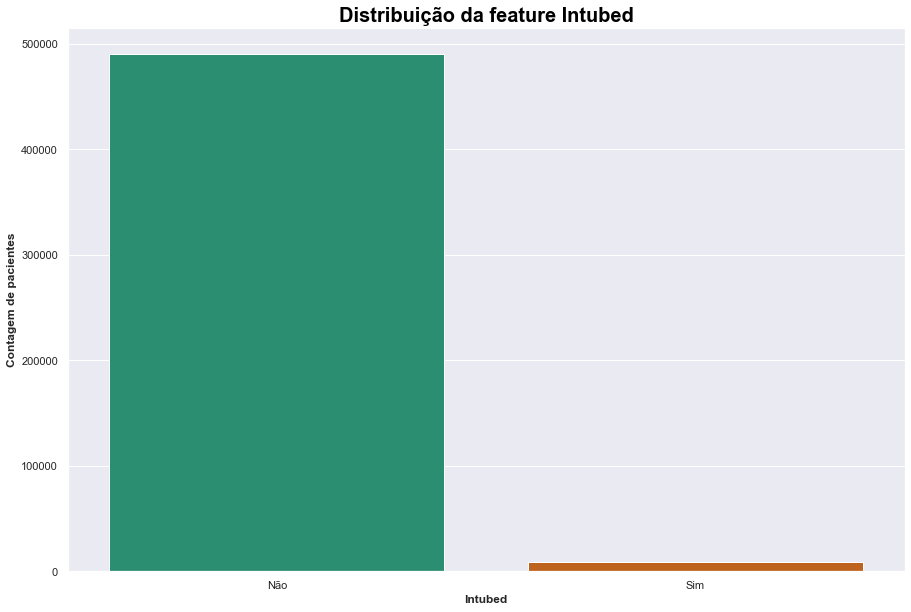

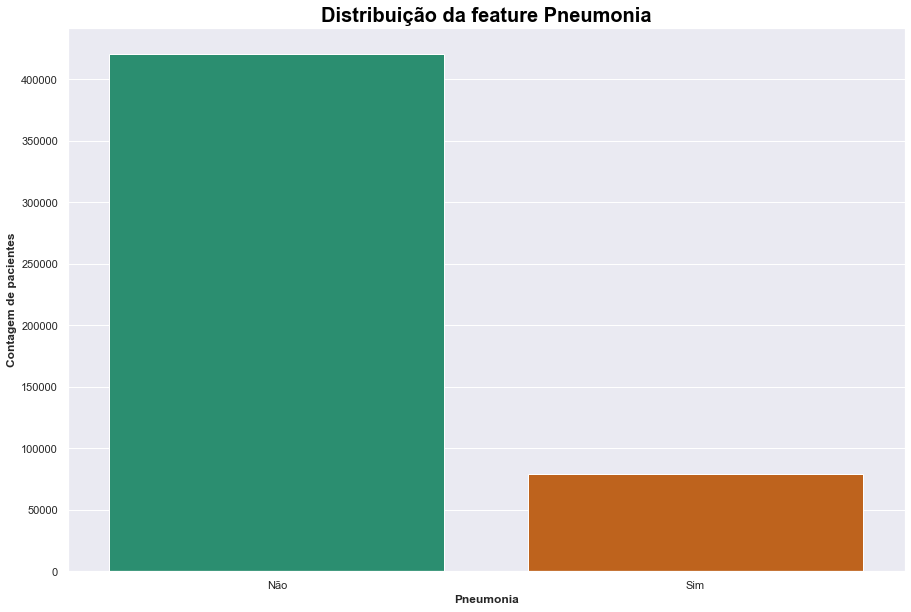

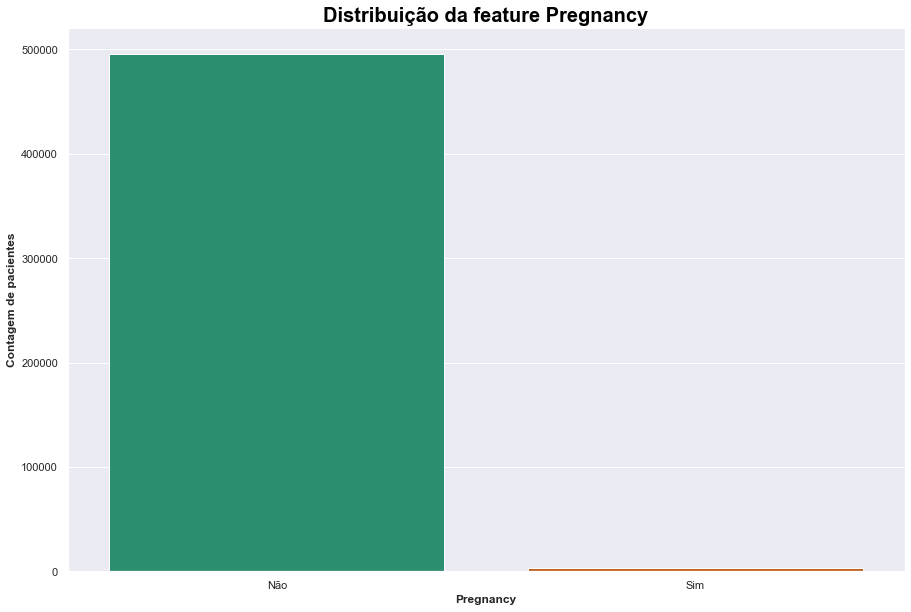

...

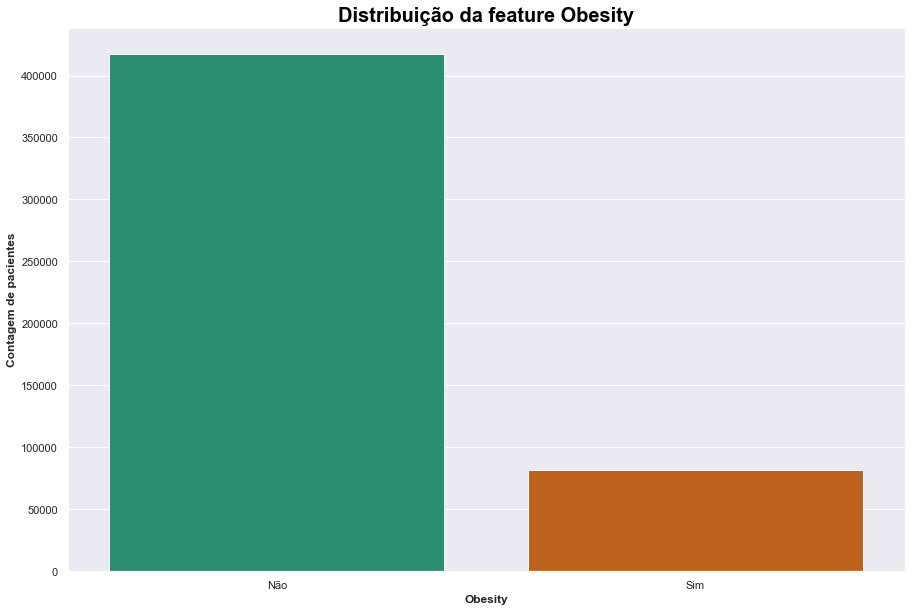

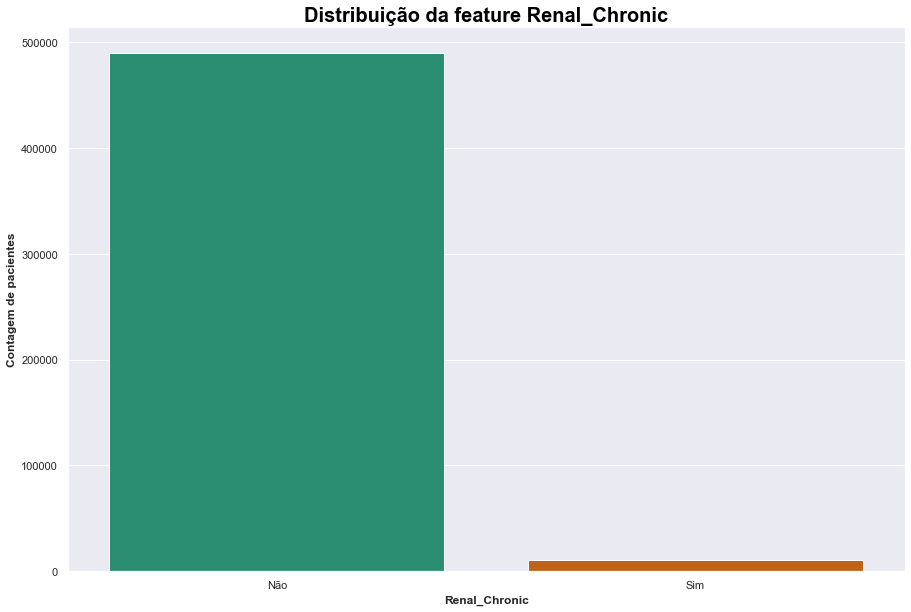

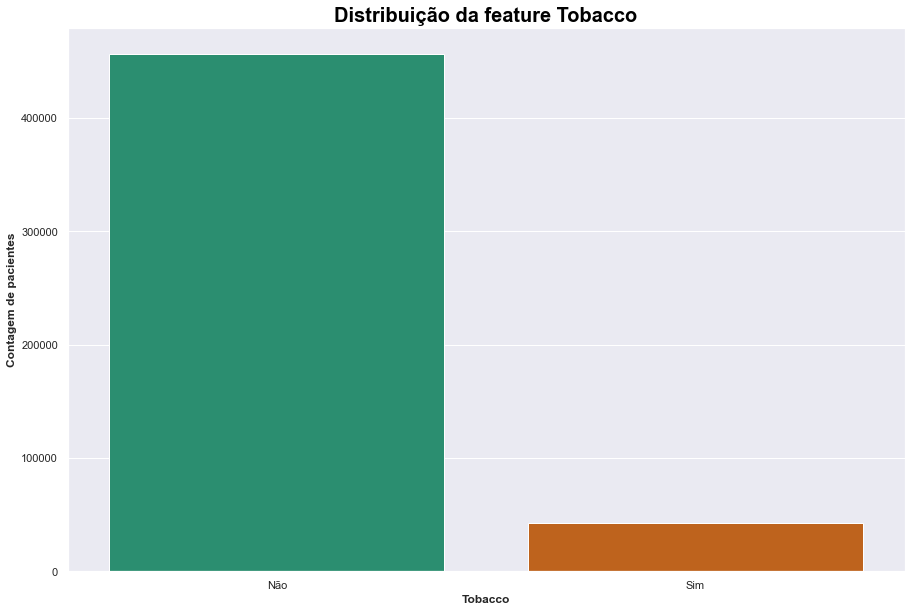

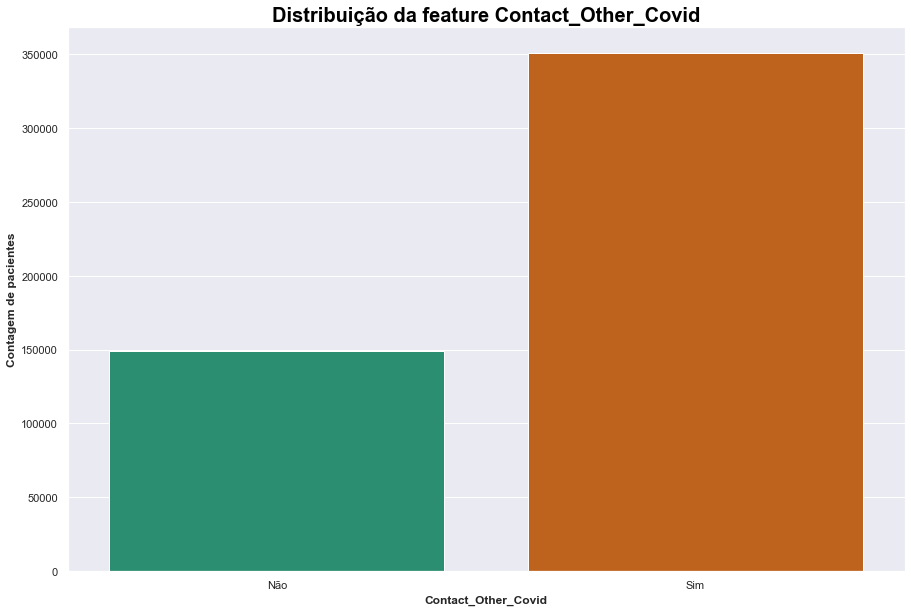

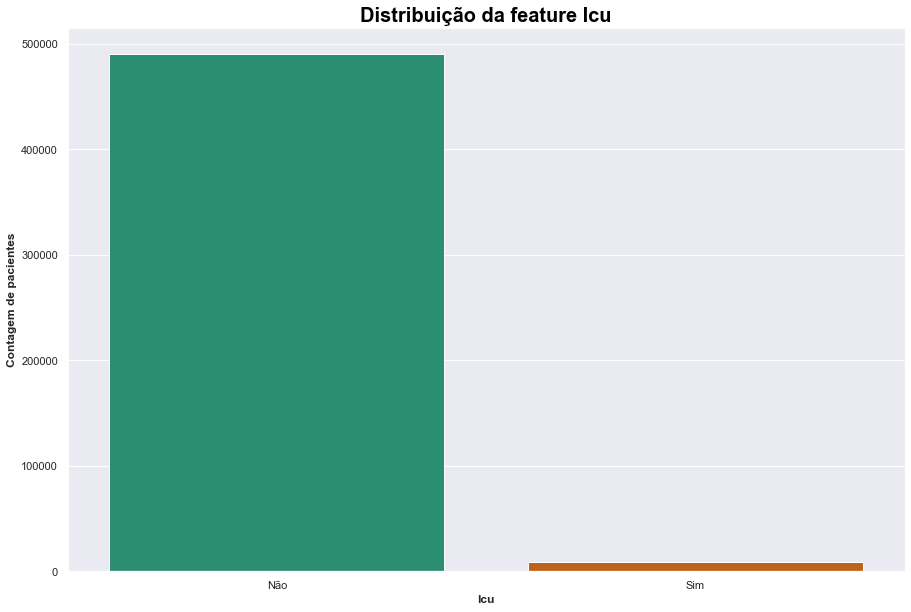

In [111]:
#Loop para passar por cada coluna binária que plotaremos countplot
for col in df_tratado.columns:
    #Como idade não é binária pularesm ela. E covid_res é o target e já plotamos acima
    if col == 'age' or col == 'covid_res':
        pass
    else:
        #Plot e formatação dos gráficos
        graph = sns.countplot(data=df_tratado,x=col,palette='Dark2')
        graph.set_title(f'Distribuição da feature {col.title()}')
        graph.set_xlabel(col.title())
        graph.set_ylabel('Contagem de pacientes')
        #Formatações para as colunas que 0 era diferente de não e 1 diferente de sim
        if col == "patient_type":
            graph.set_xticklabels(['Internado','Dispensado'])
        elif col == "sex":
            graph.set_xticklabels(['Homem','Mulher'])
        else:
            graph.set_xticklabels(['Não','Sim'])
    plt.show()



É perceptível que: 
- As colunas envolvendo comorbidades estão bastante desbalanceadas. 
- A maioria das pessoas que fez o teste foi dispensada e alega ter tido contato com outra pessoa com covid, provavelmente por esse motivo ela fez o teste. Aqui já percebemos um possível problema, algumas das features podem ser posteriores ao resultado do teste, como por exemplo, internação na UTI ou não. Por enquanto não daremos muito foco nesse possível problema e analisaremos os dados que temos. Se isso realmente for relevante, na etapa de modelagem isso ficará mais evidente de qualquer forma.

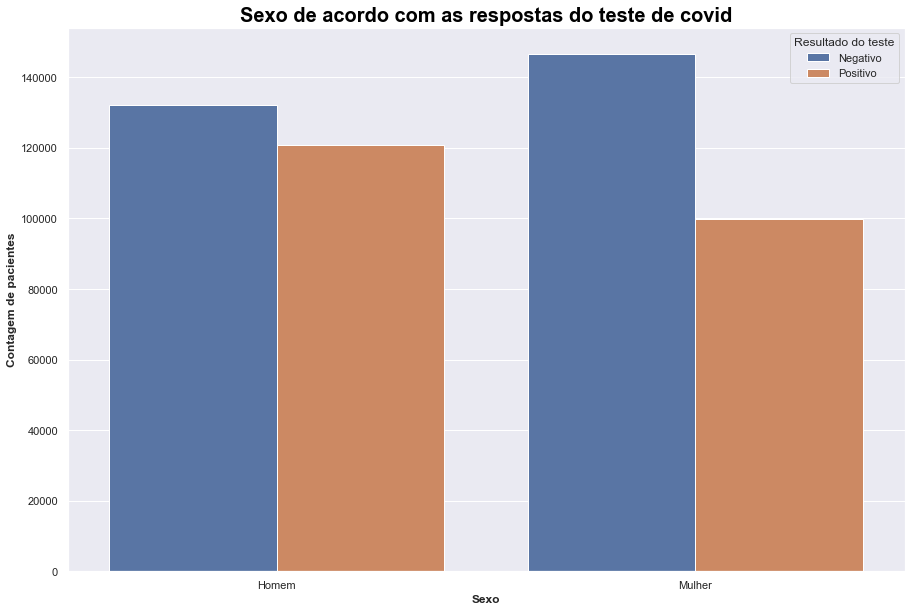

In [112]:
#Criando um countplot 
graph = sns.countplot(data=df_tratado,x='sex',hue='covid_res')
graph.set_title('Sexo de acordo com as respostas do teste de covid')
graph.set_xlabel('Sexo')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Homem','Mulher'])
graph.legend(title='Resultado do teste',labels=['Negativo','Positivo']);

#Todos os gráficos que tiverem o hue "Resultado do teste" serão nesse padrão de azul e laranja

A diferença entre os resultados dos testes dos homens é menor do que entre as mulheres. Considerando que o volume dos dois sexos está equilibrado, os homens parecem ter se contaminado mais 

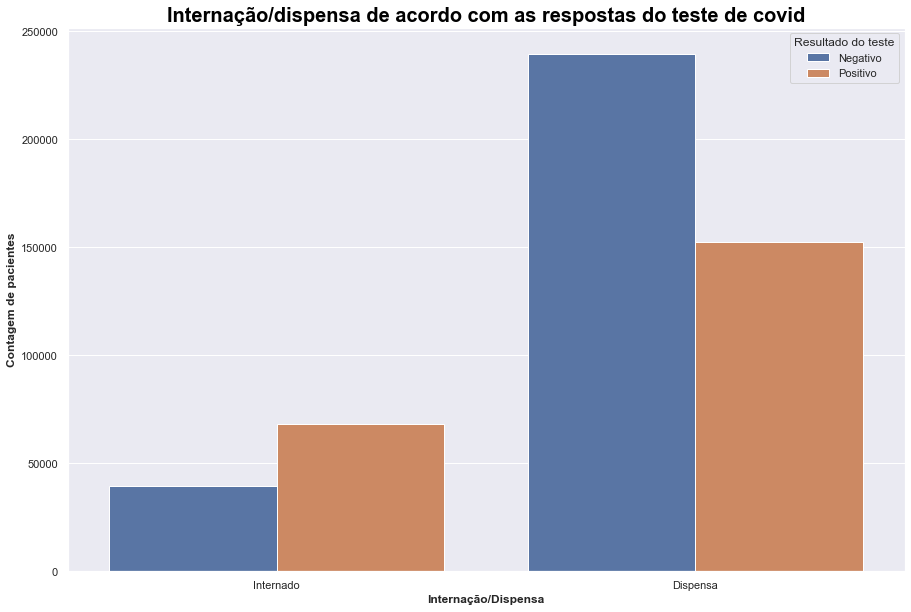

In [113]:
#Criando um countplot com o hue tipo de paciente
graph = sns.countplot(data=df_tratado,x='patient_type',hue='covid_res')
graph.set_title('Internação/dispensa de acordo com as respostas do teste de covid')
graph.set_xlabel('Internação/Dispensa')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Internado','Dispensa'])
graph.legend(title='Resultado do teste',labels=['Negativo','Positivo']);

A maior parte das dispensas é negativa, o que faz total sentido e as dispensas positivas provavelmente são de pessoas com idades menores, iremos explorar isso graficamente. O que não faz tanto sentido é o elevado volume de internações em que o teste deu negativo. Iremos explorar melhor essas internações negativas e entender o porque elas estão ocorrendo

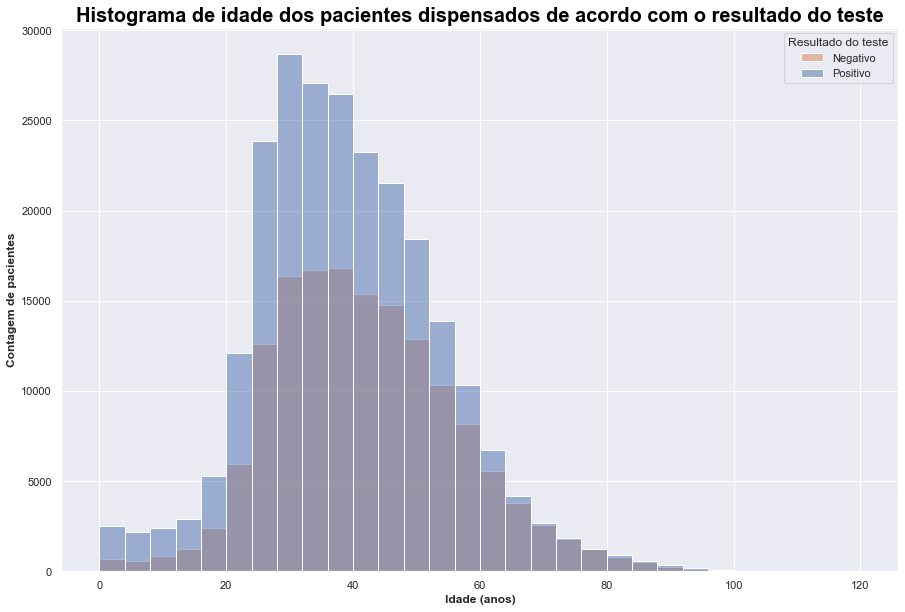

In [114]:
#Criando um filtro para pegarmos somente pacientes dispensados
filter = df_tratado['patient_type'] == 1

#Criando um histograma de idade dos pacientes dispensados
graph = sns.histplot(data=df_tratado.loc[filter,:],x='age',hue='covid_res',bins=30)
graph.set_title('Histograma de idade dos pacientes dispensados de acordo com o resultado do teste')
graph.set_xlabel('Idade (anos)')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Resultado do teste',labels=['Negativo','Positivo'])

Como havíamos suposto a maioria dos pacientes dispensados que deram positivo tem idades entre 25 e 50 anos, estando fora do grupo de risco (olhando somente para a idade). O número de possíveis comorbidades poderá ser usado futuramento como uma nova feature. As colunas que indicam algum tipo de comorbidade ou fator de risco são as seguintes:

- pneumonia
- diabetes
- asthma
- copd
- inmsupr
- hypertension
- ohter_disease
- cardiovascular
- renal_chronic
- tobacco

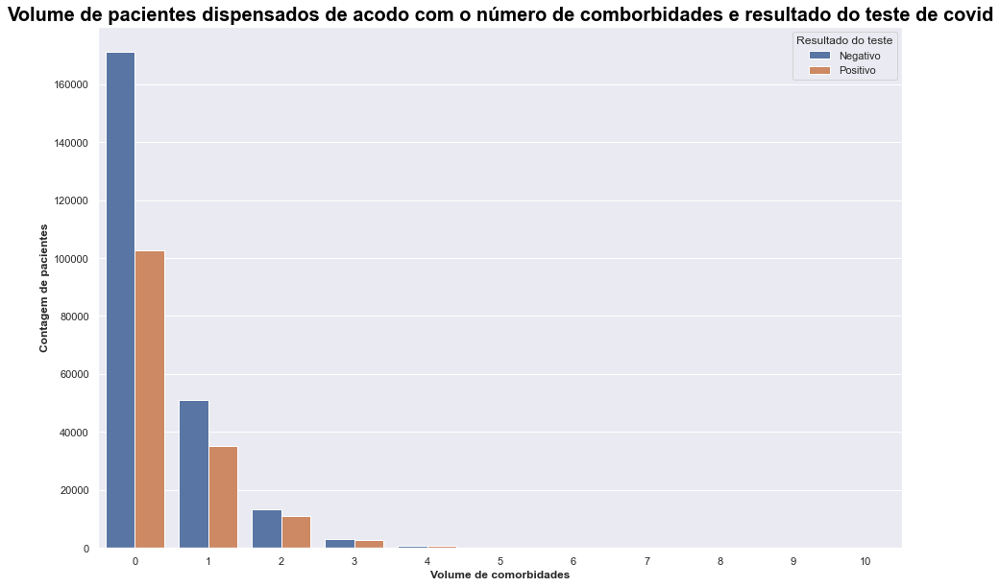

In [115]:
#Criando uma nova coluna para contar o número de comorbidades
df_tratado['comorbidades'] = df_tratado[['pneumonia',
                                         'diabetes',
                                         'asthma',
                                         'copd',
                                         'inmsupr',
                                         'hypertension',
                                         'other_disease',
                                         'cardiovascular',
                                         'renal_chronic',
                                         'tobacco']].gt(0).sum(axis=1)
#Criando um filtro para pegar somente os pacientes dispensados
filter = df_tratado['patient_type'] == 1

#Criando um count plot do número de comorbidades dos pacientes dispensados de acordo com o resultado do teste
graph = sns.countplot(data=df_tratado.loc[filter,:],x='comorbidades',hue='covid_res')
graph.set_title('Volume de pacientes dispensados de acodo com o número de comborbidades e resultado do teste de covid')
graph.set_xlabel('Volume de comorbidades')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Resultado do teste',labels=['Negativo','Positivo']);


Dessa forma conseguimos confirmar nossa primeita hipotese, de que as pessoas dispensadas que o teste deu positivo além de jovens, apresentavam nenhuma comorbidade na sua grande maioria, sendo consideradas pacientes com menos risco de falecimento e, dessa forma, não sendo necessária a internação

Vamos olhar agora para os pacientes que o exame deu negativo mas foram internados da mesma forma

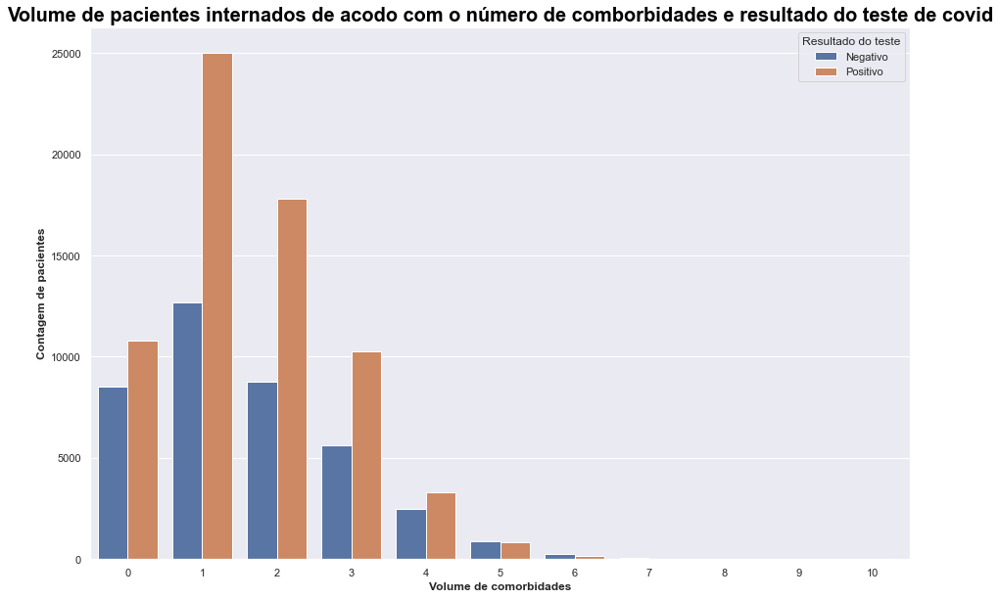

In [116]:
#Criando filtro para pacientes que foram internados
filter = df_tratado['patient_type'] == 0

#Criando um countplot do número de pacientes internados de acordo com as comorbidades e o resultado do teste
graph = sns.countplot(data=df_tratado.loc[filter,:],x='comorbidades',hue='covid_res')
graph.set_title('Volume de pacientes internados de acodo com o número de comborbidades e resultado do teste de covid')
graph.set_xlabel('Volume de comorbidades')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Resultado do teste',labels=['Negativo','Positivo']);

Apesar do testes terem dado negativo, um elevado volume de pacientes tinha 1 ou mais comorbidades. O teste negativo e a internação pode indicar que os testes foram feitos no momento errado, dando falso positivo. 
É interessante notar que um elevado volume de pacientes internados tem 0 comorbidades, podendo ser pacientes com idade avançada.Para sanar essa dúvida vamos olhar para o histograma de idade dos pacientes internados e com zero comorbidades

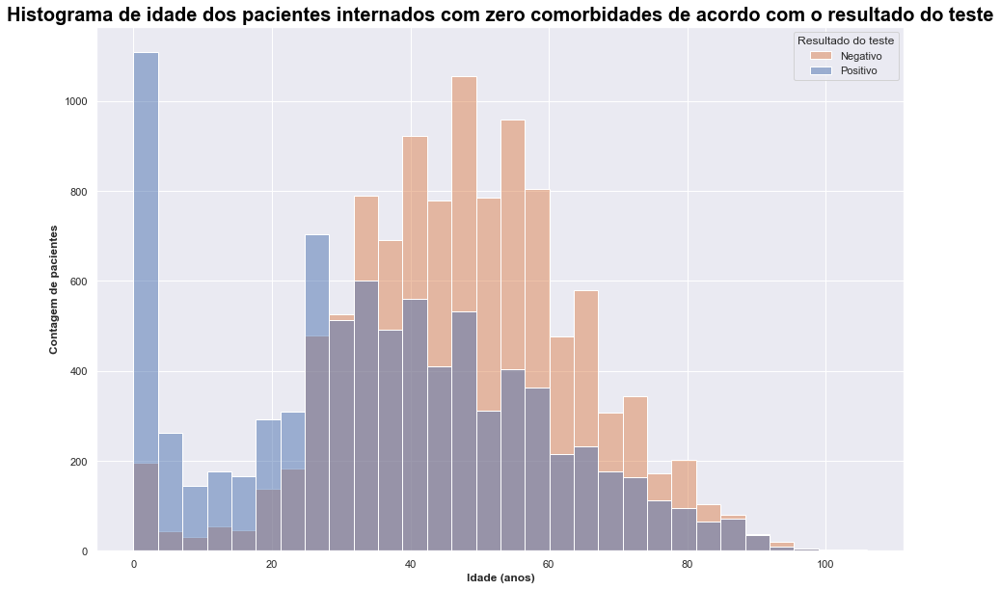

In [117]:
#Criando um filtro para pegarmos somente pacientes internados
filter = (df_tratado['patient_type'] == 0) & (df_tratado['comorbidades'] == 0)

#Criando um histograma de idade dos pacientes internados e com 0 comorbidades
graph = sns.histplot(data=df_tratado.loc[filter,:],x='age',hue='covid_res',bins=30)
graph.set_title('Histograma de idade dos pacientes internados com zero comorbidades de acordo com o resultado do teste')
graph.set_xlabel('Idade (anos)')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Resultado do teste',labels=['Negativo','Positivo']);

Pelo gráfico vemos que nossa hipótese da idade elevada dos pacientes com zero comorbidades e internados foi refutada. Acontece justamente o contrario, temos um elevado volume de pacientes jovens ou muito novos, provavelmente crianças pequenas ou bebês.

Vamos olhar dos pacientes internados, quantos foram para a uti

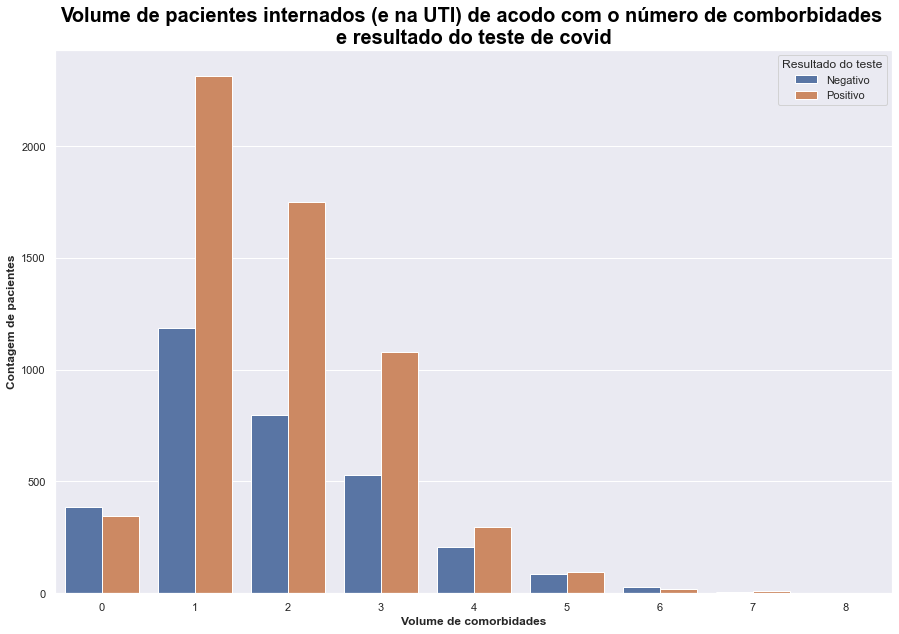

In [118]:
#Filtro para pegar pacientes internados e na uti
filter = (df_tratado['patient_type'] == 0) & (df_tratado['icu'] == 1)

#Plotando e formatando os gráficos
graph = sns.countplot(data=df_tratado.loc[filter,:],x='comorbidades',hue='covid_res')
graph.set_title('Volume de pacientes internados (e na UTI) de acodo com o número de comborbidades \ne resultado do teste de covid')
graph.set_xlabel('Volume de comorbidades')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Resultado do teste',labels=['Negativo','Positivo'],loc='upper right');

O volume de pacientes com 0 comorbidades reduziu drasticamente, de 10 mil para menos de 500. Indicando que somente pacientes com quadros mais graves são internados e vão para UTI e que esses quadros mais graves ocorrem pouco em pessoas com zero comorbidades. Vamos olhar agora os pacientes que são internados mas não vão para UTI.

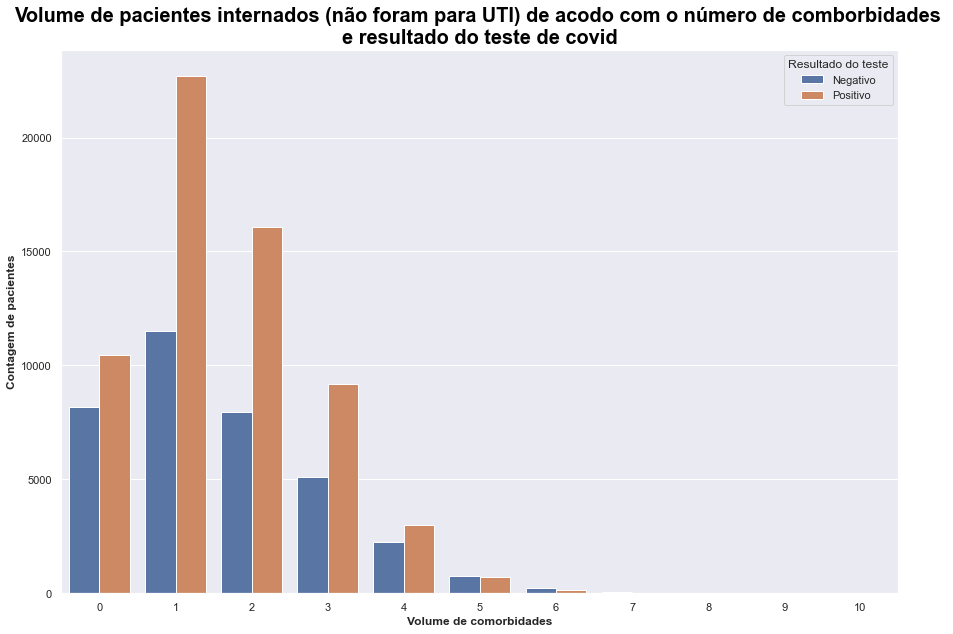

In [119]:
#Filtro para pegar pacientes internados e não foram para a  uti
filter = (df_tratado['patient_type'] == 0) & (df_tratado['icu'] == 0)

graph = sns.countplot(data=df_tratado.loc[filter,:],x='comorbidades',hue='covid_res')
graph.set_title('Volume de pacientes internados (não foram para UTI) de acodo com o número de comborbidades \ne resultado do teste de covid')
graph.set_xlabel('Volume de comorbidades')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Resultado do teste',labels=['Negativo','Positivo'],loc='upper right');

Dessa forma, constatamos que a maior parte dos pacientes internados tem comorbidades e desses apenas uma pequena parte vai para a UTI.

Vamos olhar agora como cada comorbidade se relacionada com as internações.

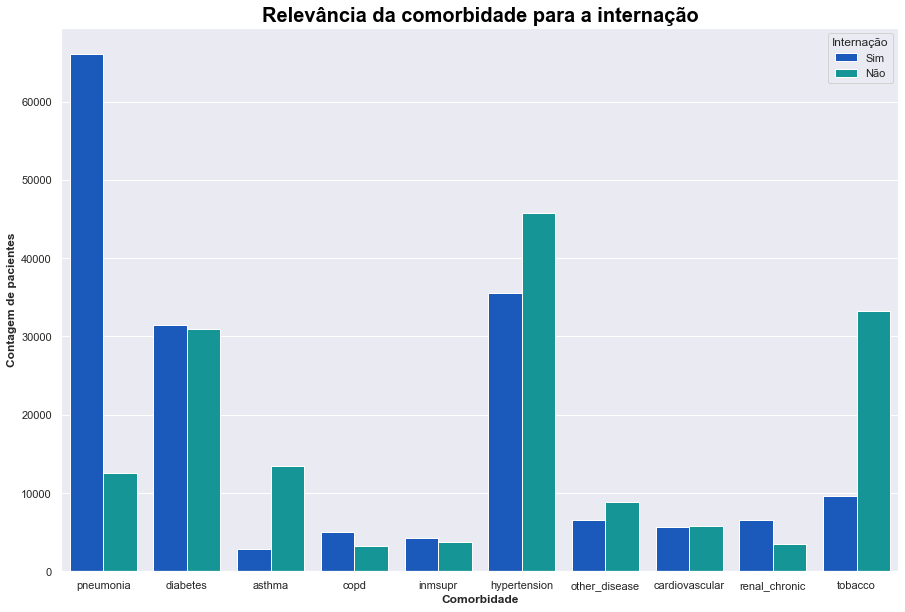

In [120]:
#Criando uma lista com as comorbidades para usar de colunas no melt que será feito abaixo
comorbidades = ['pneumonia',
                'diabetes',
                'asthma',
                'copd',
                'inmsupr',
                'hypertension',
                'other_disease',
                'cardiovascular',
                'renal_chronic',
                'tobacco']

#Fazendo um melt do dataframe criaremos um novo dataframe com as colunas 
# 1) resultado do teste, 
# 2,3,4,5,6) as colunas ['covid_res','patient_type','intubed','sex','icu'],
# 7) uma coluna com o nome da comorbidade
# 8) e uma terceia coluna com a ausência ou presença da comorbidade
df_comorbidades = pd.melt(
                            frame= df_tratado,
                            id_vars= ['covid_res','patient_type','intubed','sex','icu','pregnancy'],
                            value_vars=comorbidades,
                            var_name='comorbidades',
                            value_name='comorbidade_sim'
                        )
#Filtro para pegar somente as linhas que tem comorbidade
filter_comorbidade = df_comorbidades['comorbidade_sim'] == 1.0


graph = sns.countplot(data=df_comorbidades.loc[filter_comorbidade,:],x='comorbidades',hue='patient_type',palette='winter')
graph.set_title('Relevância da comorbidade para a internação')
graph.set_xlabel('Comorbidade')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Internação',labels=['Sim','Não'],loc='upper right');

#tudo que envolver internação usaemos esse padrão "winter"


Asma e tabaco apesar de, pelo senso comum, parecerem comorbidades que geram internação na verdade geram mais dispensas.
Pneumonia, hipertensão e diabetes geram um volume elevado de internações

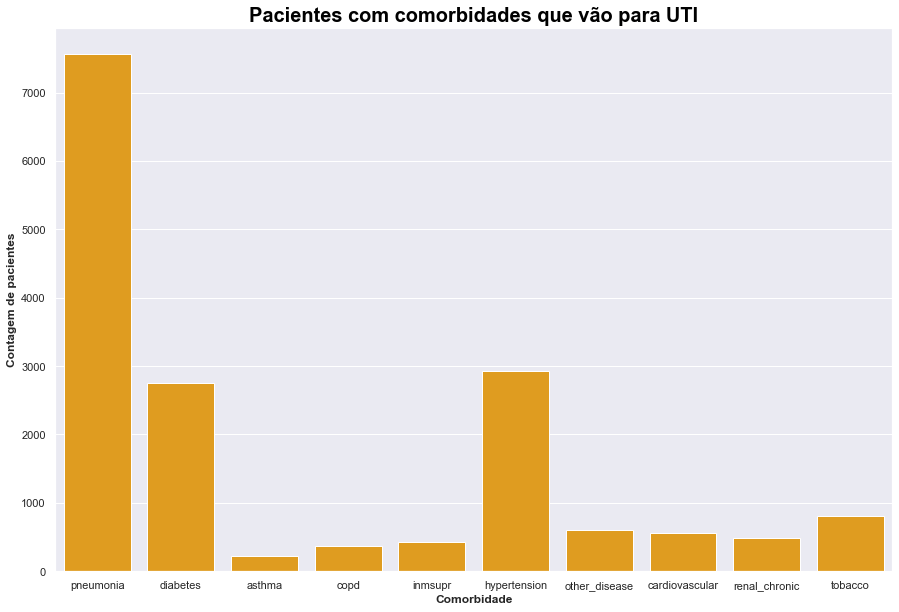

In [121]:
#Filtro para pacientes com comorbidade e que foram para a uti
filter_uti = (df_comorbidades['comorbidade_sim'] == 1.0) & (df_comorbidades['icu'] == 1.0) 


graph = sns.countplot(data=df_comorbidades.loc[filter_uti,:],x='comorbidades',color='Orange')
graph.set_title('Pacientes com comorbidades que vão para UTI')
graph.set_xlabel('Comorbidade')
graph.set_ylabel('Contagem de pacientes');

#tudo que envolver uti usaremos o padrão alaranjado

Por esse gráfico é possível perceber que as comorbidades que mais geram internações também são as que mais levem a casos de UTI. No entanto o volume de pacientes que vão para uti é 10% das internações

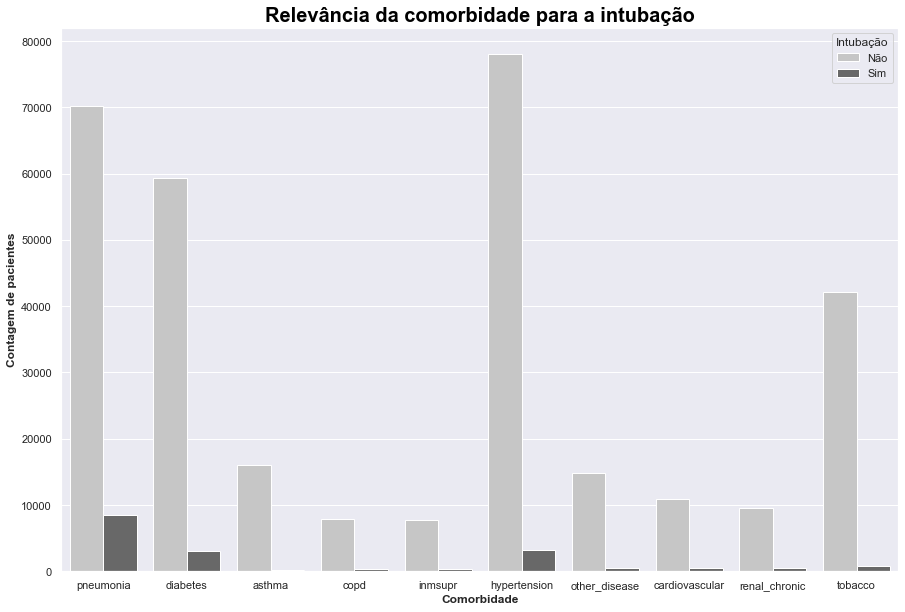

In [122]:
#Criando um gráfico para ver a relevância da comorbidade para a entubação
graph = sns.countplot(data=df_comorbidades.loc[filter_comorbidade,:],x='comorbidades',hue='intubed',palette='Greys')
graph.set_title('Relevância da comorbidade para a intubação')
graph.set_xlabel('Comorbidade')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Intubação',labels=['Não','Sim'],loc='upper right');

#tudo que envolver intubação usaremos o padrão cinza

O mesmo padrão da relevância para a internação na uti é seguido aqui. Além disso fica evidente que mesmo nas pessoas com comorbidade a intubação é um caso extremo. Isso só não é verdade em paciente com pneumonia, que as intubações ocorrem em mais de 10% dos casos

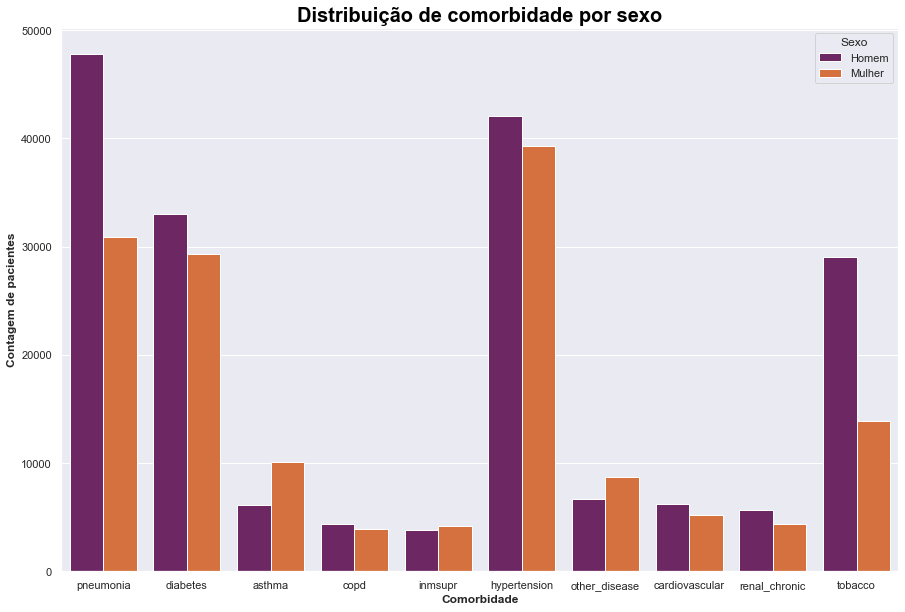

In [123]:
#Filtro de comorbidade
filter_comorbidade = df_comorbidades['comorbidade_sim'] == 1.0

#Plot dos gráficos
graph = sns.countplot(data=df_comorbidades.loc[filter_comorbidade,:],x='comorbidades',hue='sex',palette='inferno')
graph.set_title('Distribuição de comorbidade por sexo')
graph.set_xlabel('Comorbidade')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Sexo',labels=['Homem','Mulher'],loc='upper right');


#tudo que envolver sexo usaremos esse padrão "inferno"

Assumindo que o dataset represente a população, pneumonia e tabacado parecem ser comorbidades mais frequentes em homens. Além disso as comorbidades mais frequentes foram peneumonia, diabetes, hipertensão e tabaco. 

Considerando que grande parte da população fuma e/ou tem problemas de sobrepeso (que pode acasionar diabetes e hipertensão), essa distribuição está dentro do esperado. A peneumonia é um dos sintomas da covid, então também era esperado um elevado volume de pessoas com esse sintoma

Vamos olhar para a fatia dados dados que envolve a gravidez

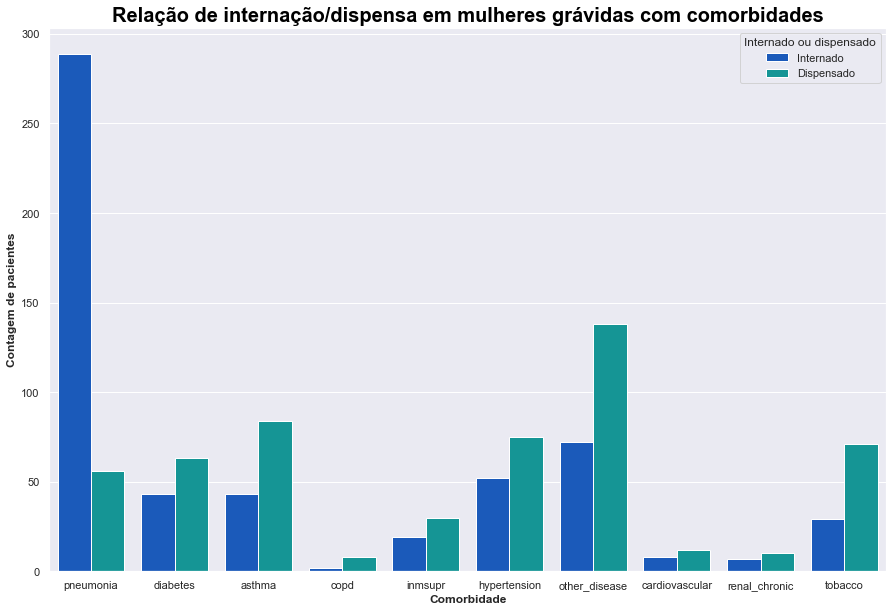

In [124]:
#Criando filtro para comorbidade e gravidez 
filter_gravida_comorbidade = (df_comorbidades['comorbidade_sim'] == 1.0) & (df_comorbidades['pregnancy'] == 1.0)

#Plot dos gráficos
graph = sns.countplot(data=df_comorbidades.loc[filter_gravida_comorbidade,:],x='comorbidades',hue='patient_type',palette='winter')
graph.set_title('Relação de internação/dispensa em mulheres grávidas com comorbidades')
graph.set_xlabel('Comorbidade')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Internado ou dispensado',labels=['Internado','Dispensado'],loc='upper right');

Aqui a hipertenção e a diabetes não são mais tão relevantes e a peneumonia se torna extremamente relevante. Entretanto o volume de pacientes mulheres grávidas com comorbidades é bem pequeno

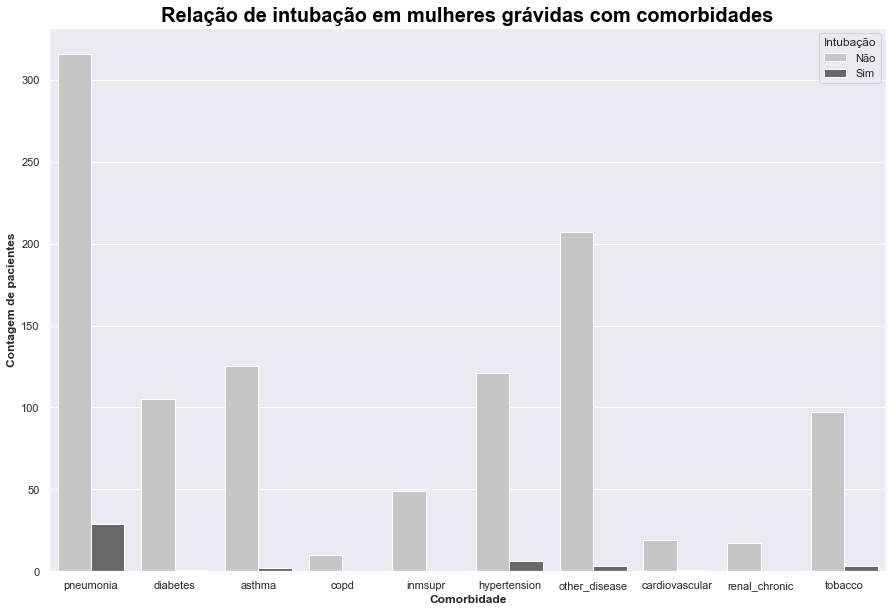

In [125]:
#Filtro para mulhers gráficas com comorbidade
filter_gravida_comorbidade = (df_comorbidades['comorbidade_sim'] == 1.0) & (df_comorbidades['pregnancy'] == 1.0)

#plot dos gráficos
graph = sns.countplot(data=df_comorbidades.loc[filter_gravida_comorbidade,:],x='comorbidades',hue='intubed',palette='Greys')
graph.set_title('Relação de intubação em mulheres grávidas com comorbidades')
graph.set_xlabel('Comorbidade')
graph.set_ylabel('Contagem de pacientes')
graph.legend(title='Intubação',labels=['Não','Sim'],loc='upper right');

Pouquissimas mulheres grávidas com comorbidades foram intubadas, reforçando que a intubação após a internação é um caso extremo

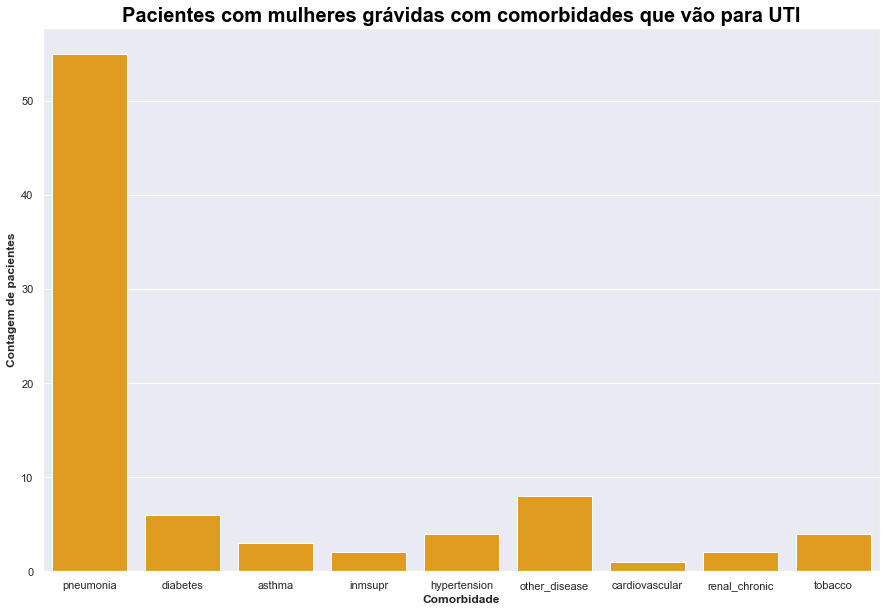

In [41]:
#Filtro para pacientes com comorbidade, grávidas e que foram para a UTI
filter_gravida_comorbidade_uti = (df_comorbidades['comorbidade_sim'] == 1.0) & (df_comorbidades['pregnancy'] == 1.0) & (df_comorbidades['icu'] == 1.0)

graph = sns.countplot(data=df_comorbidades.loc[filter_gravida_comorbidade_uti,:],x='comorbidades',color='Orange')
graph.set_title('Pacientes com mulheres grávidas com comorbidades que vão para UTI')
graph.set_xlabel('Comorbidade')
graph.set_ylabel('Contagem de pacientes');

Pneumonia segue sendo a comorbidade que mais gera internação na UTI

Vamos olhar para o grupo de mulheres grávidas em relação a teste positivo ou não, considerando internação, intubação e uti

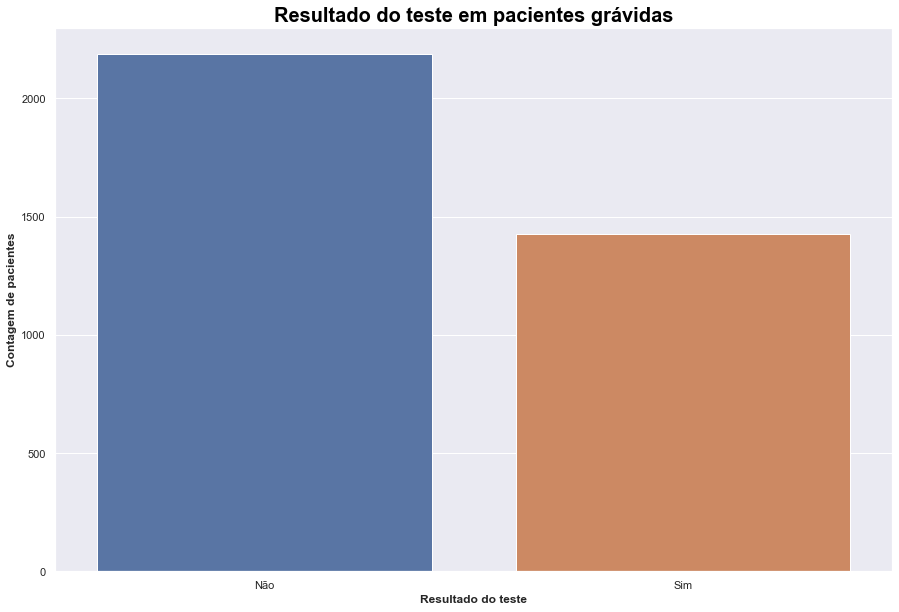

In [42]:
#Filtro para mulheres gravidas
filter = df_tratado['pregnancy'] == 1

#Plot dos gráficos
graph = sns.countplot(data=df_tratado.loc[filter,:],x='covid_res')
graph.set_title('Resultado do teste em pacientes grávidas')
graph.set_xlabel('Resultado do teste')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Não','Sim']);


A maioria das grávidas testa negativo e o volume de grávidas é bem pequeno considerando 500 mil pacientes

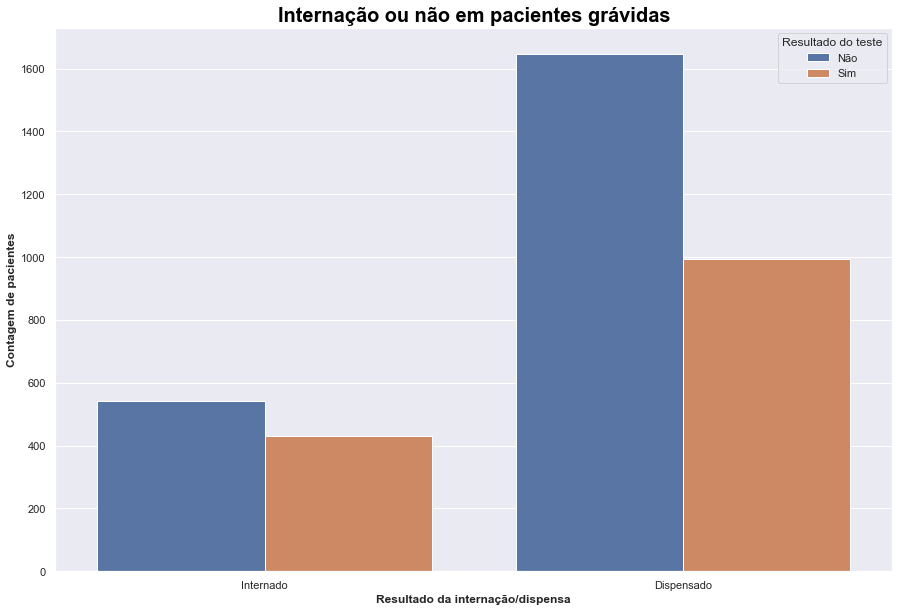

In [43]:
#Filtro de mulheres gráficas
filter = df_tratado['pregnancy'] == 1

#Plot dos gráficos
graph = sns.countplot(data=df_tratado.loc[filter,:],x='patient_type',hue='covid_res')
graph.set_title('Internação ou não em pacientes grávidas')
graph.set_xlabel('Resultado da internação/dispensa')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Internado','Dispensado'])
graph.legend(title='Resultado do teste',labels=['Não','Sim'],loc='upper right');

O volume de mulheres grávidas que foram dispensadas mesmo com teste positivo é expressivo (1000 mulheres). Fazendo uma rápida pesquisa, em pessoas grávidas a presença de pneumonia ou outras doenças constitui fator de risco. Dessa forma vamos analisar um gráfico desse tópico para entender se essas dispensas mesmo positivas eram acompanhadas da ausência dessas comorbidades

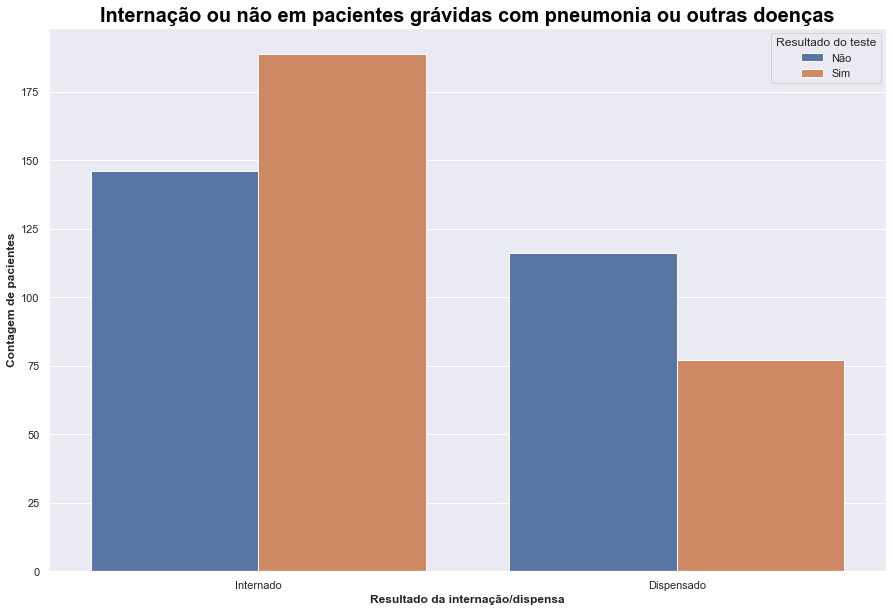

In [44]:
#Filtro para mulher grávidas e com pneumonia ou outra doença
filter = (df_tratado['pregnancy'] == 1) & ((df_tratado['pneumonia']== 1) | (df_tratado['other_disease']== 1))

#Plot dos gráficos
graph = sns.countplot(data=df_tratado.loc[filter,:],x='patient_type',hue='covid_res')
graph.set_title('Internação ou não em pacientes grávidas com pneumonia ou outras doenças')
graph.set_xlabel('Resultado da internação/dispensa')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Internado','Dispensado'])
graph.legend(title='Resultado do teste',labels=['Não','Sim'],loc='upper right');

Nossa teoria se confirmou, a maior parte das pacientes gravidas dispensadas e com resultado positivo não tinha pneumonia ou outras doenças (75 mulheres foram dispensadas com resultado positivo e com penuemonia e outras doenças). 

Essas pacientes que não terem sido internadas mesmo com o resultado positivo pode ser fruto de uma série de motivos como: superlotação do hospital, paciente não querer a internação, paciente não precisar de internação mesmo apresentado os fatores de risco, dentre outros.

Das pacientes grávidas vamos olhar também quantas delas vão para uti

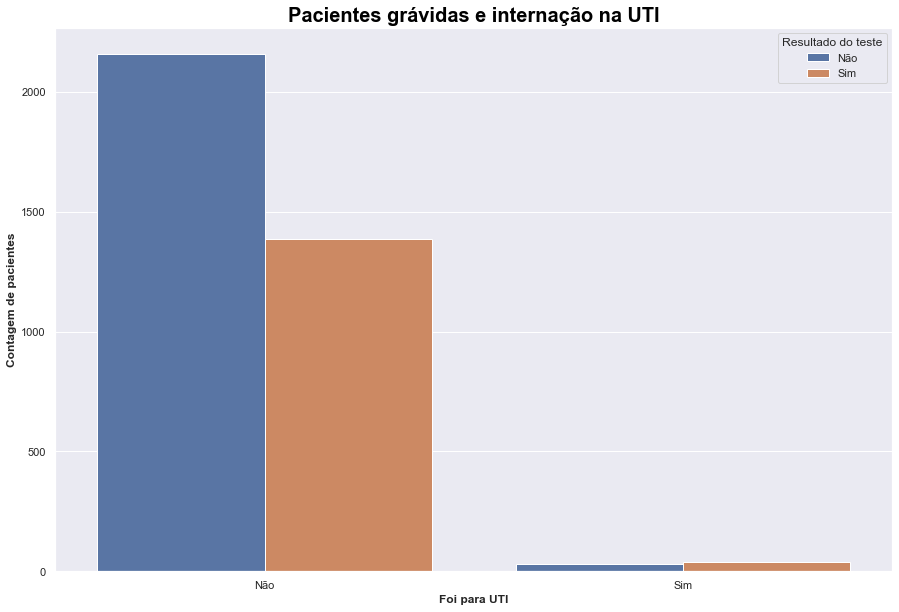

In [45]:
#Filtro de pacientes grávidas
filter = df_tratado['pregnancy'] == 1

#Plot do gráfico
graph = sns.countplot(data=df_tratado.loc[filter,:],x='icu',hue='covid_res')
graph.set_title('Pacientes grávidas e internação na UTI')
graph.set_xlabel('Foi para UTI')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Não','Sim'])
graph.legend(title='Resultado do teste',labels=['Não','Sim'],loc='upper right');

Novamente vemos que a internação na UTI é um caso extremo e o volume de pacientes grávidas internadas é baixo. Olhando para a intubação, esperamos encontrar o mesmo comportamento

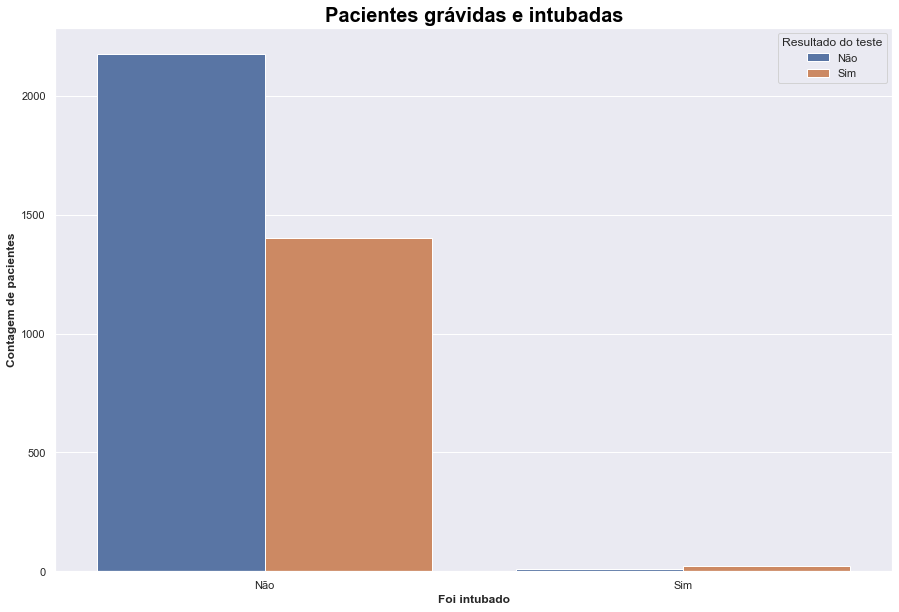

In [46]:
#Filtro de pacientes grávidas
filter = df_tratado['pregnancy'] == 1

#Plot do gráfico
graph = sns.countplot(data=df_tratado.loc[filter,:],x='intubed',hue='covid_res')
graph.set_title('Pacientes grávidas e intubadas')
graph.set_xlabel('Foi intubado')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Não','Sim'])
graph.legend(title='Resultado do teste',labels=['Não','Sim'],loc='upper right');

Vamos olhar o grafico da target com cada uma das features como hue

In [47]:
#Criando um dicionário para cada coluna ter sua cor quando for usar ela de hue
colors = {  'sex'           : 'inferno',
            'patient_type'  : 'winter',
            'intubed'       : 'Greys',
            'pneumonia'     : 'Accent',
            'age'           : 'Blues',
            'pregnancy'     : 'BrBG',
            'diabetes'      : 'BuGn',
            'copd'          : 'BuPu',
            'asthma'        : 'CMRmap',
            'inmsupr'       : 'Dark2',
            'hypertension'  : 'GnBu',
            'other_disease' : 'PRGn',
            'cardiovascular': 'Paired',
            'obesity'       : 'PiYG',
            'renal_chronic' : 'PuBu',
            'tobacco'       : 'PuBuGn',
            'contact_other_covid'  :'PuRd',
            'icu'           : 'Oranges',
        }

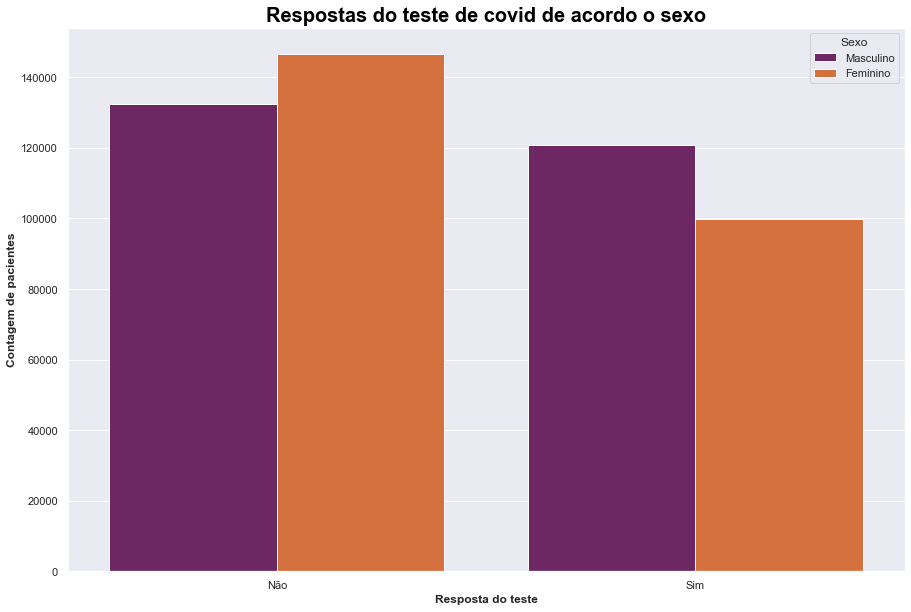

In [48]:
#Criando um countplot 
graph = sns.countplot(data=df_tratado,x='covid_res',hue='sex',palette=colors['sex'])
graph.set_title('Respostas do teste de covid de acordo o sexo')
graph.set_xlabel('Resposta do teste')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Não','Sim'])
graph.legend(title='Sexo',labels=['Masculino','Feminino']);

O volume de homens que testaram negativo é menor do que o de mulheres que testaram negativo. Quando o resultado é positivo esse quadro se inverte. Considerando que a proporção global de homens e mulheres está equilibrada isso pode indicar que os homens tomaram menos medidas de isolamento. Vamos analisar a variável contato com outras pessoas contaminadas e ver como essas duas variáveis estão relacionadas

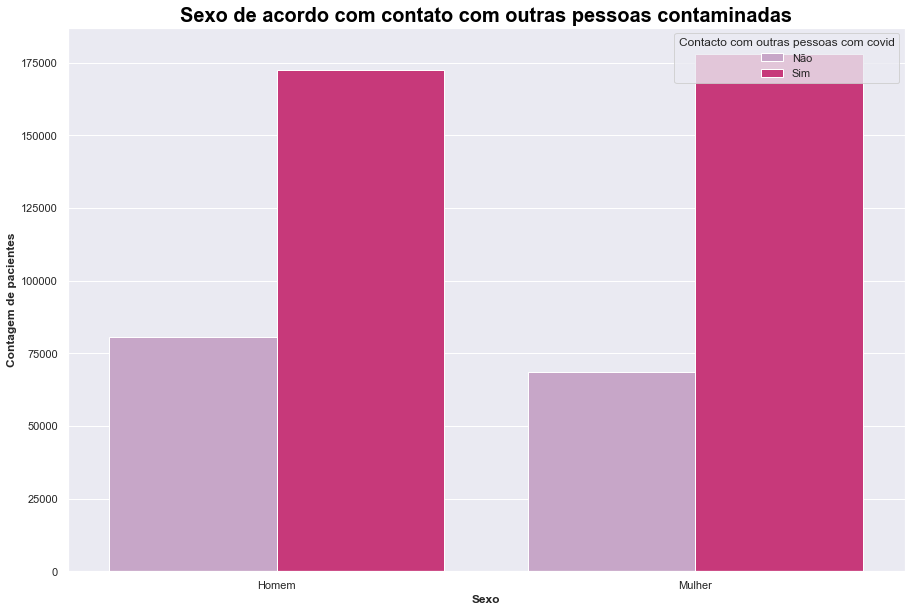

In [49]:
graph = sns.countplot(data=df_tratado,x='sex',hue='contact_other_covid',palette=colors['contact_other_covid'])
graph.set_title('Sexo de acordo com contato com outras pessoas contaminadas')
graph.set_xlabel('Sexo')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Homem','Mulher'])
graph.legend(title='Contacto com outras pessoas com covid',labels=['Não','Sim'],loc='best');

Essa possível hipotese se mostrou falsa já que tanto homens como mulheres declararam em proporções próximas que tiverem contato com outras pessoas contaminadas. O fato de menos homens terem dado negativo em relação a mulheres pode ter diversas causas que só com os dados que temos, não conseguiremos explicar

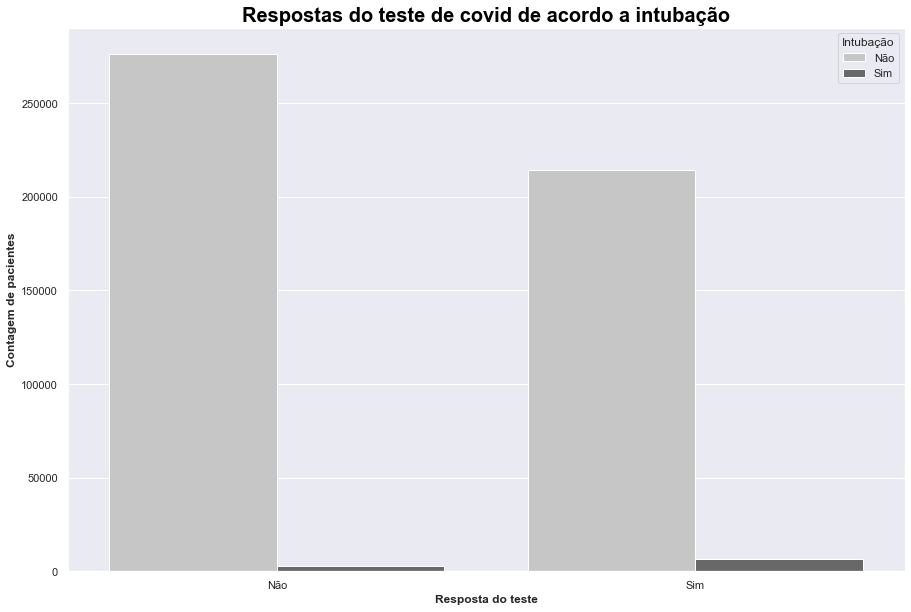

In [50]:
#Criando um countplot 
graph = sns.countplot(data=df_tratado,x='covid_res',hue='intubed',palette=colors['intubed'])
graph.set_title('Respostas do teste de covid de acordo a intubação')
graph.set_xlabel('Resposta do teste')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Não','Sim'])
graph.legend(title='Intubação',labels=['Não','Sim']);

O gráfico só confirma que intubação realmente é um caso extremo e a grande maioria das pessoas que testaram positivo não estavam em condições extremas que exigissem internação

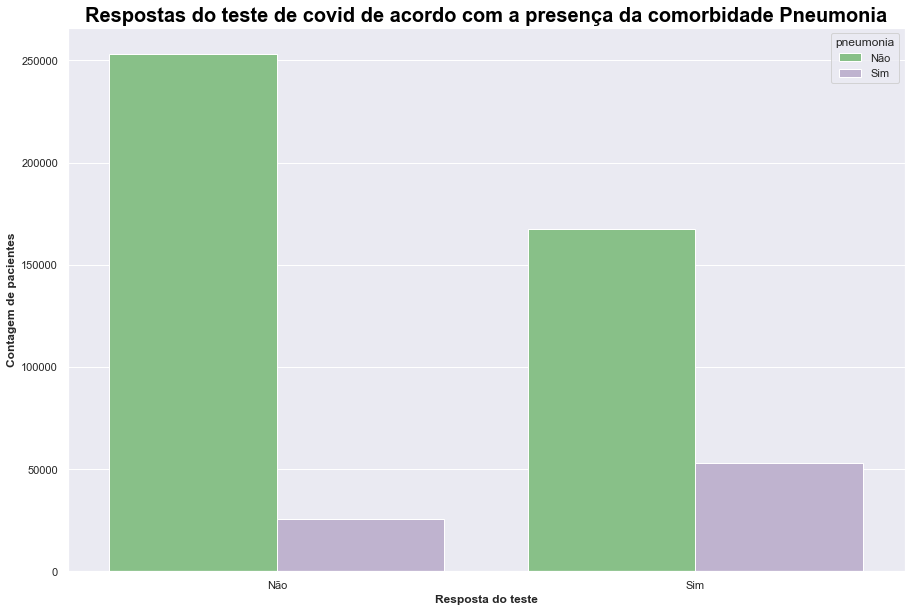

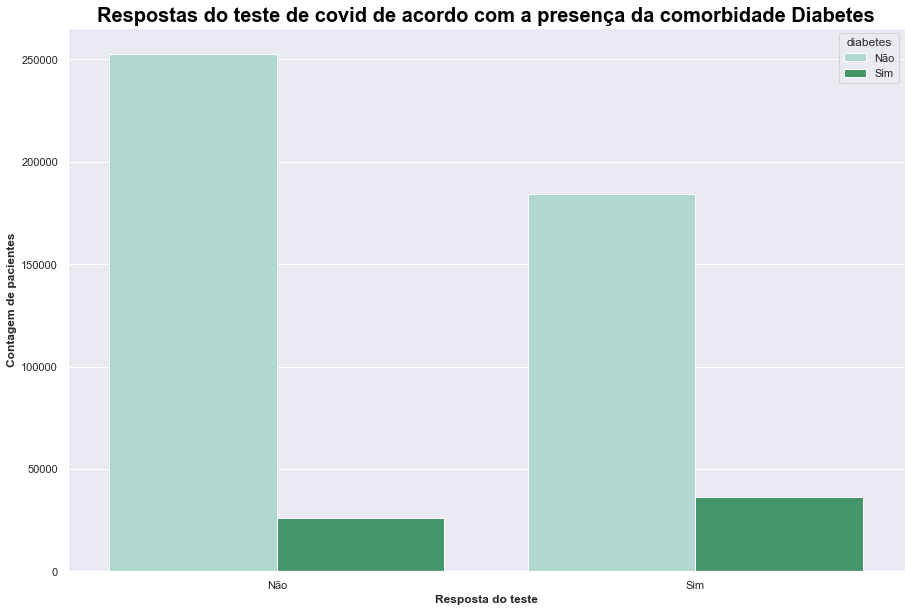

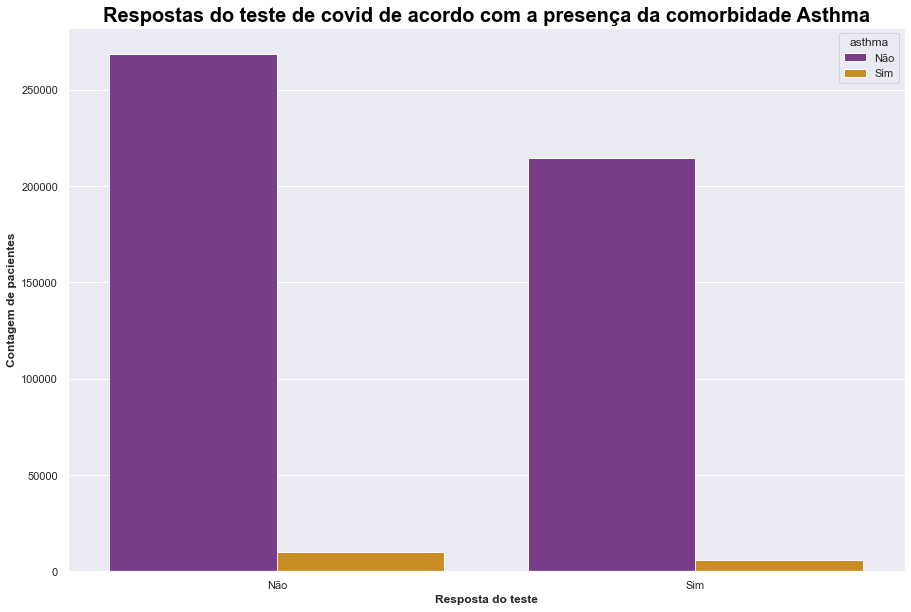

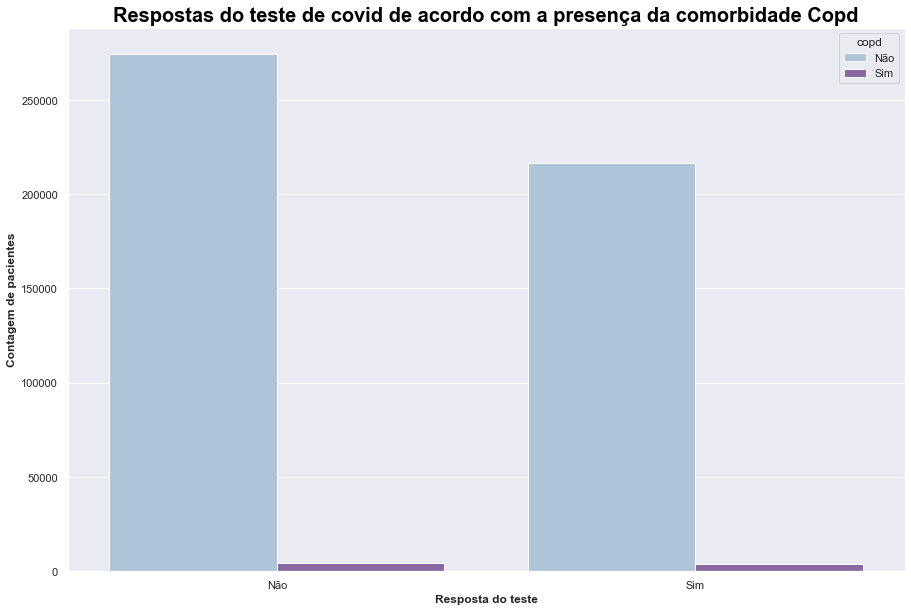

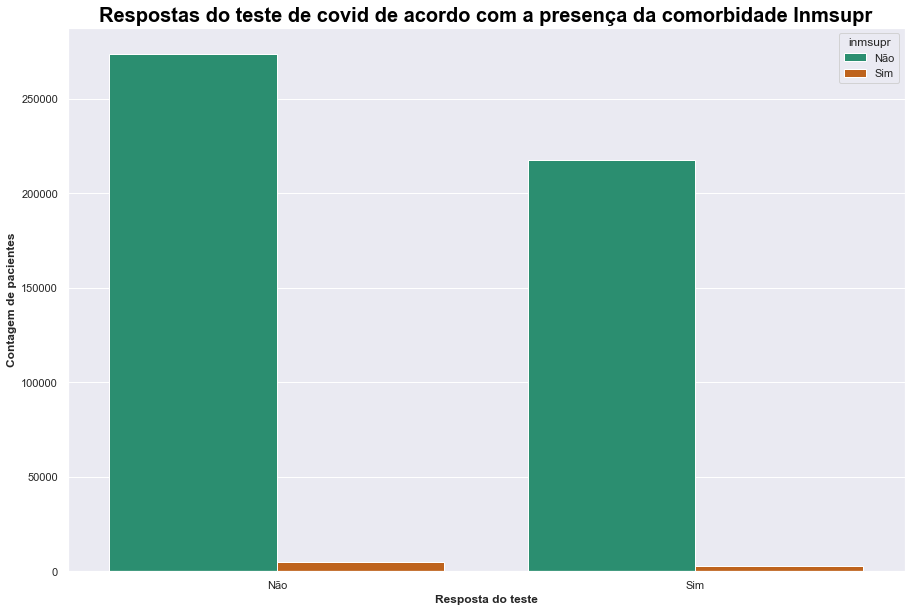

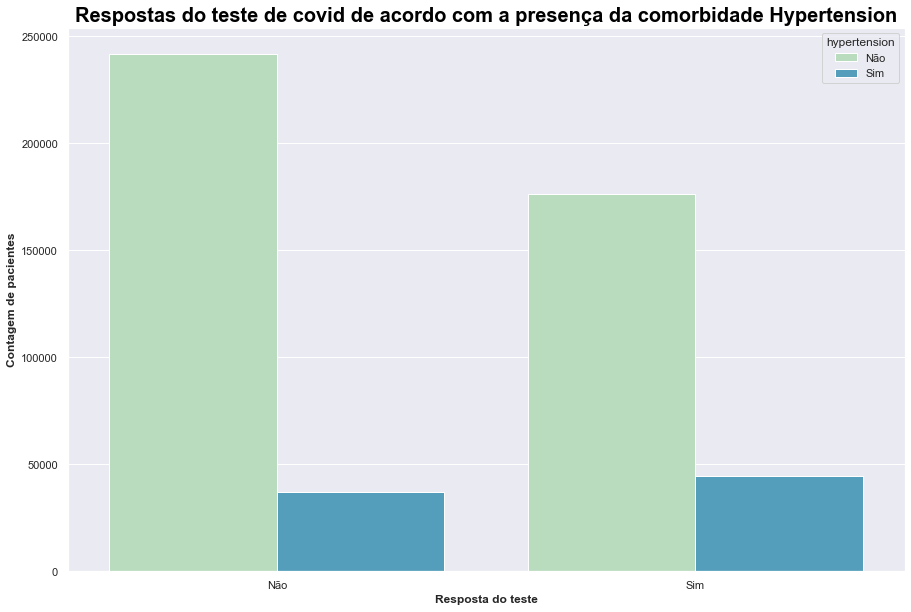

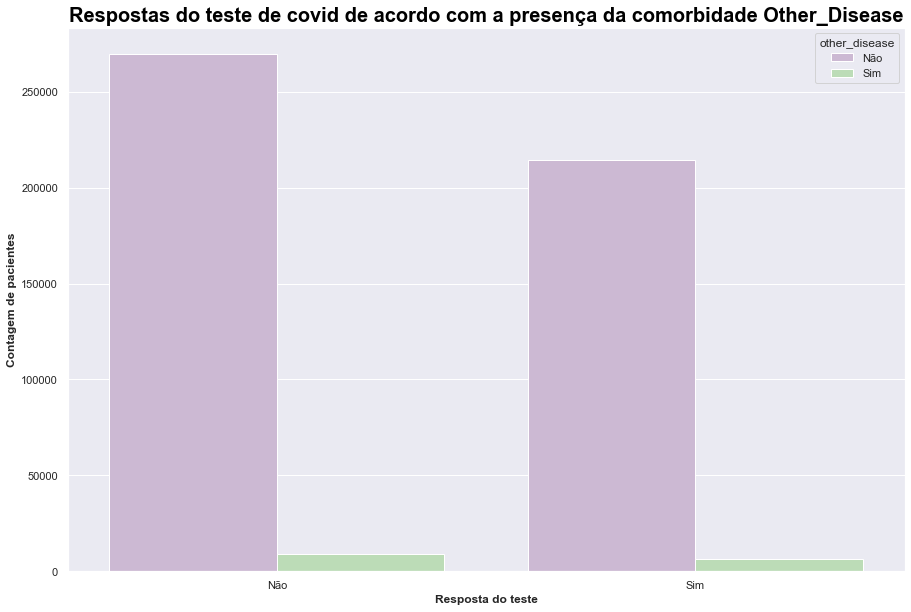

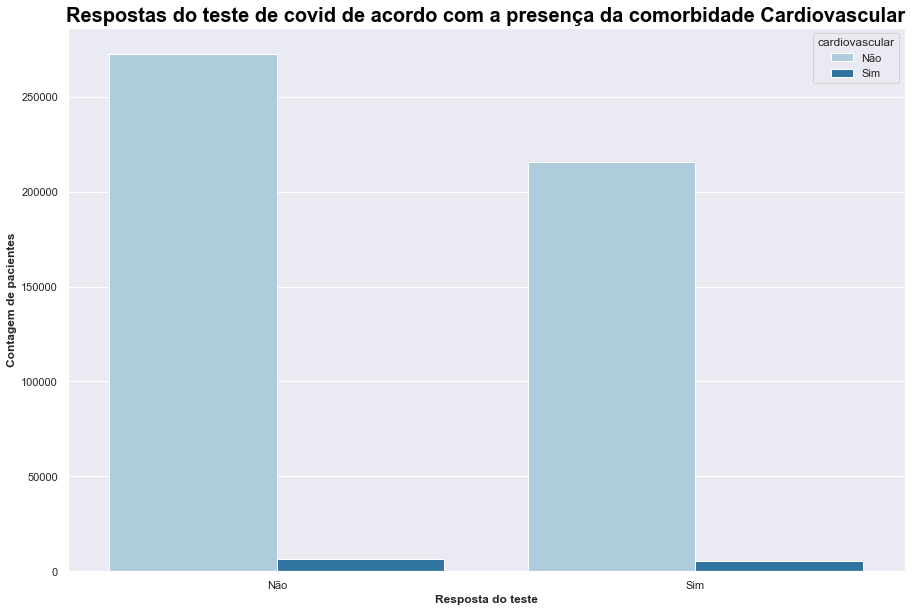

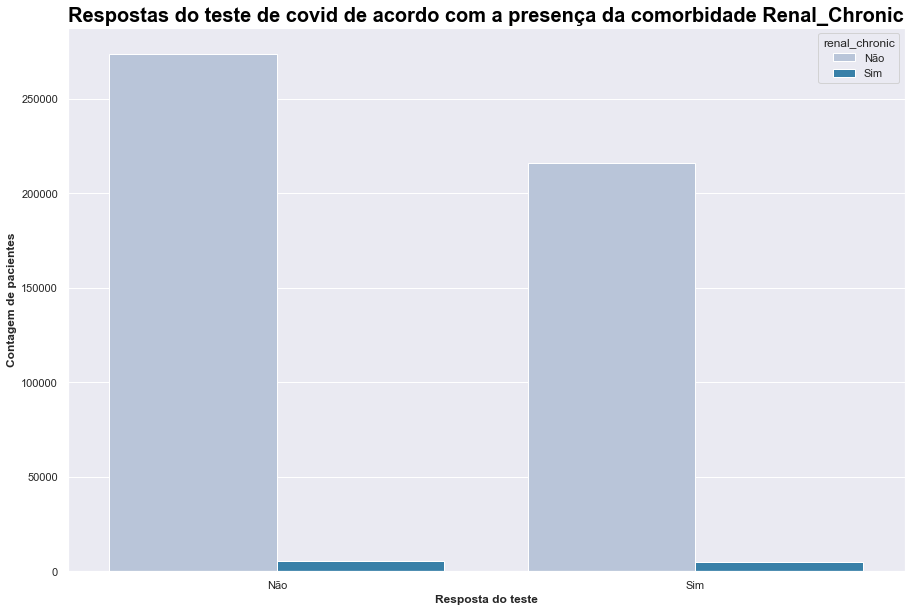

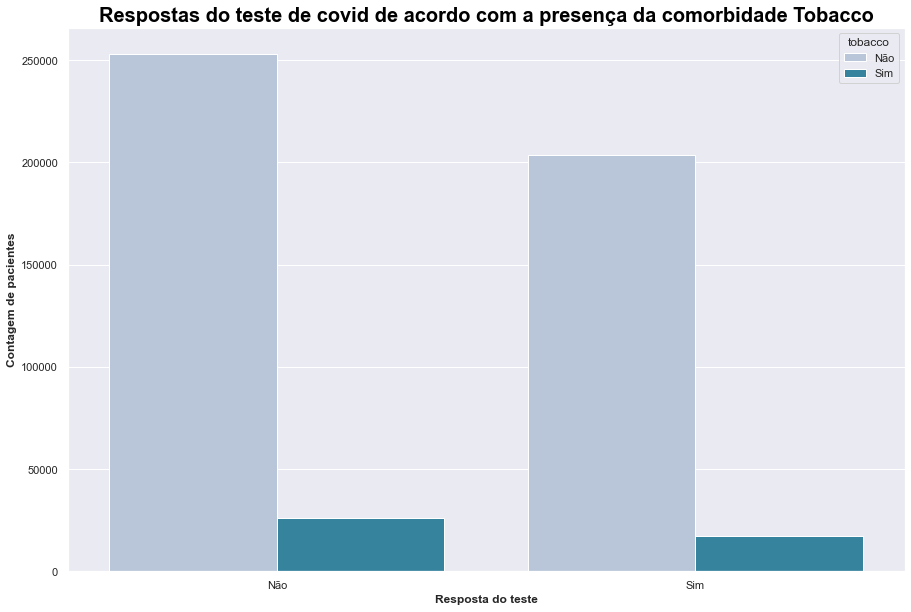

In [51]:
#Criando um countplot 

for comorbidade in comorbidades:
    graph = sns.countplot(data=df_tratado,x='covid_res',hue=comorbidade,palette=colors[comorbidade])
    graph.set_title(f'Respostas do teste de covid de acordo com a presença da comorbidade {comorbidade.title()}')
    graph.set_xlabel('Resposta do teste')
    graph.set_ylabel('Contagem de pacientes')
    graph.set_xticklabels(['Não','Sim'])
    graph.legend(title=comorbidade,labels=['Não','Sim'])
    plt.show();

Infelizmente esses gráficos não foram muito informativos

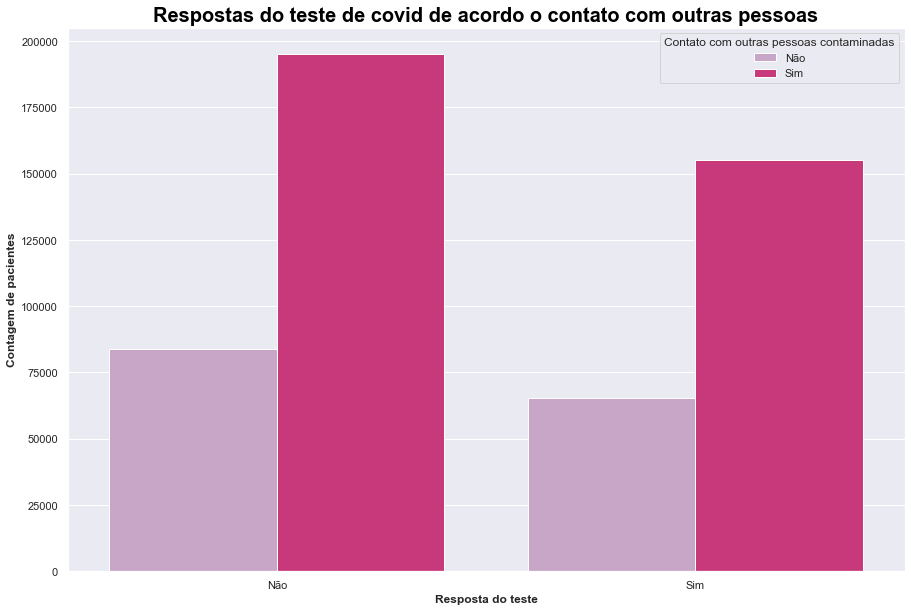

In [52]:
#Criando um countplot 
graph = sns.countplot(data=df_tratado,x='covid_res',hue='contact_other_covid',palette=colors['contact_other_covid'])
graph.set_title('Respostas do teste de covid de acordo o contato com outras pessoas')
graph.set_xlabel('Resposta do teste')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Não','Sim'])
graph.legend(title='Contato com outras pessoas contaminadas',labels=['Não','Sim']);

Esse dado é complexo de se analisar porque se a pessoa fez o teste ela tem uma alta chance de ter entrado em contato com alguem contaminado e isso fica claro pelas barras vermelhas mais expressivas do que as roxas. No entanto, existe também a possibilidade de o paciente mentir nesse dado. Então pode ser uma coluna não muito confiável

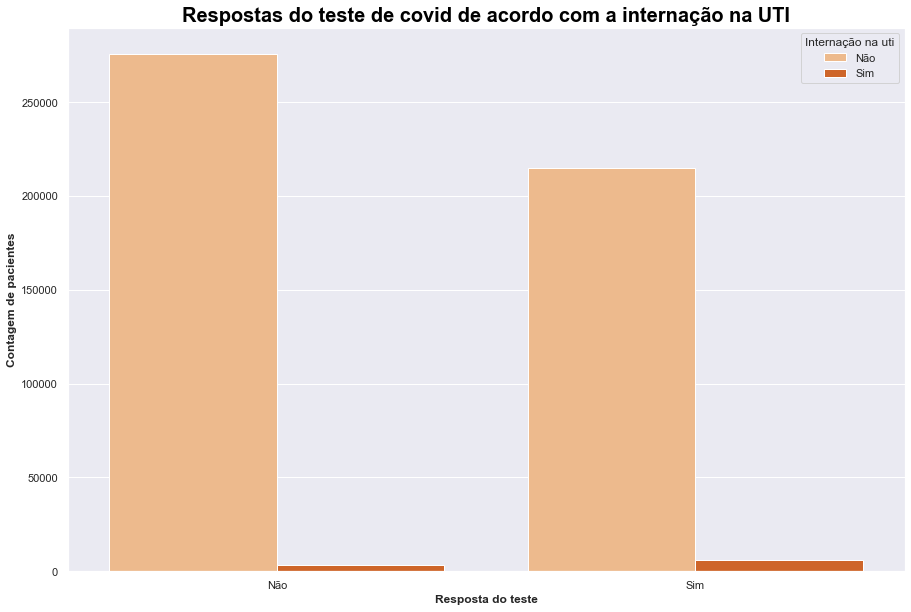

In [53]:
#Criando um countplot 
graph = sns.countplot(data=df_tratado,x='covid_res',hue='icu',palette=colors['icu'])
graph.set_title('Respostas do teste de covid de acordo com a internação na UTI')
graph.set_xlabel('Resposta do teste')
graph.set_ylabel('Contagem de pacientes')
graph.set_xticklabels(['Não','Sim'])
graph.legend(title='Internação na uti',labels=['Não','Sim']);

Novamente, comprovamos que a internação na uti só ocorre em casos extremos

Vamos examinar também como está a distribuição de idade em relação as diversas features

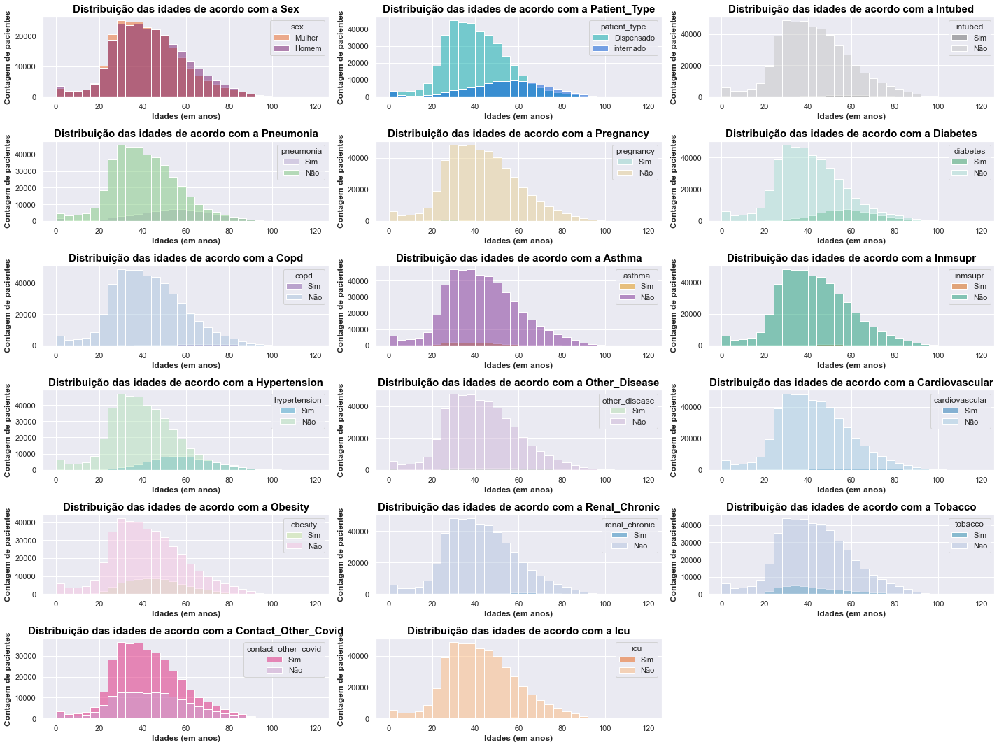

In [54]:
#Criando um grid de subplots
fig, axes = plt.subplots(6,3,figsize=(20,15))
#Deixando nosso array de axes no formato linha ao invés de linha e coluna
axes = axes.ravel()

#Colunas que usaremos de hue
col_to_look = ['sex', 'patient_type', 'intubed', 'pneumonia', 'pregnancy',
       'diabetes', 'copd', 'asthma', 'inmsupr', 'hypertension',
       'other_disease', 'cardiovascular', 'obesity', 'renal_chronic',
       'tobacco', 'contact_other_covid','icu']

#loop para plotar cada gráfico
for col,ax in zip(col_to_look,axes):
    graph = sns.histplot(data=df_tratado,x='age',hue=col,ax=ax,bins=30,palette=colors[col])
    #Formatação do gráfico
    graph.set_title(f'Distribuição das idades de acordo com a {col.title()}',fontsize=15)
    graph.set_xlabel('Idades (em anos)')
    graph.set_ylabel('Contagem de pacientes')
    #Estrutura condicional para colocar as legendas corretamente
    if col == 'sex':
           graph.legend(title=col,labels=['Mulher','Homem']);
    elif col == 'patient_type':
           graph.legend(title=col,labels=['Dispensado','internado']);
    else:
           graph.legend(title=col,labels=['Sim','Não']);
#Deletando um axe inútil
fig.delaxes(axes[17])
#Dando um espaço entre os gráficos para ficar mais estético
fig.tight_layout()

Algumas observações a partir desses histogramas:
- Determinados fatores de risco/comorbidades estão muito mais presentes em populações mais velhas, como por exemplo: pneumonia, diabetes,hipertensão e problemas vasculares. 
- É interessante verificar que obesidade e uso de tabacado aparecem com muito mais frequência em populações jovens.
- Problemas renais crônicos e cope já fica bem concentrados na faixa de idade entre 60 e 65 anos.
- Asma parece ser mais prevalecente em jovens adultos e adultos
- Contato com outras pessoas contamidas tem distirbuição de idade bem próxima, somente variando a quantidade de dados

Tendo analisado nossos dados vamos entrar em uma etapa de feature engeneering do projeto e teste de modelos

# Passo 2: Feature Engeneering e Modelagem

## Feature Engeneering

Antes de iniciarmos a criação de novas features precisamos definir um modelo base (baseline) e qual métrica iremos priorizar a melhoria

No caso da predição do resultado do teste de covid temos que considerar que:

- Olhando para a classe 1 (resultado positivo do teste) podemos maximizar a precision, ou seja, reduzir os falsos positivos (teste deu negativo mas falamos que deu positivo) ou o recall,ou seja, falsos negativos (teste deu positivo mas falamos que deu negativo). Para a classe 1, o mais prejudicial seria ter um baixo recall já que isso resultaria em aumento da transmissão.

Tendo em vista esse cenário, iremos priorizar maximizar recall da classe 1.

Vamos contruir o modelo baseline usando o XGBoost Classifier

In [55]:
#Como essa foi uma coluna criada, para termos um score do modelo sem nenhum tipo de feature engeneering, iremos remover ela por enquanto
df_tratado_base = df_tratado.drop(columns='comorbidades')
df_tratado_base

,sex,patient_type,intubed,pneumonia,age,pregnancy,diabetes,copd,asthma,inmsupr,hypertension,other_disease,cardiovascular,obesity,renal_chronic,tobacco,contact_other_covid,covid_res,icu
0,0,1,0.0,0.0,27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0
1,0,1,0.0,0.0,24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0
2,1,0,0.0,0.0,54,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1,0.0
3,0,0,0.0,1.0,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0.0
4,1,0,0.0,0.0,60,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499687,0,1,0.0,1.0,77,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0.0
499688,0,0,1.0,1.0,63,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0
499689,1,1,0.0,0.0,25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0
499690,1,1,0.0,0.0,45,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0.0


In [56]:
def score_baseline(df_tratado):
    '''Função que:
     - recebe o df, 
     - cria o x,y,
     - divide a base em treino e teste, 
     - treina o modelo com validação cruzada, 
     - calcula uma série de métricas de interesse,
     - Retorna uma tabela
     '''


    #Criando nosso X
    X = df_tratado.drop(columns=['covid_res'])
    #Removendo o target do X e usando ele para criar o y
    y = df_tratado['covid_res']
    #Dividindo nossa base em treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify=y)

    #Criando nosso pipeline. Como todos os dados já são numéricos não precisaremos fazer onehotencode
    #Apesar de somente a coluna idade precisar ser normalizada, aplicaremos a transformação em todas as
    #colunas como uma boa prática de sempre normalizar o dataset inteiro
    my_pipe = Pipeline(steps=[
                                ('Normalização dos dados',PowerTransformer()),
                                ('Modelagem',XGBClassifier(random_state=43,eval_metric='logloss',use_label_encoder=False))
                             ])
    #Faremos uma validação cruzada em 5 folds já que com 10 fold estava gastando um tempo elevado para estimar as métricas
    #Apesar de buscarmos a maximização do recall, olharemos para todas as métricas de classificação relevantes
    #(Recall, Precision, F1, Acurácia, AUC)
    
    metrics = ['recall','precision','f1_macro','accuracy','roc_auc']

    scores = cross_validate(
                                estimator = my_pipe, #o pipeline
                                X = X_train, #será usado para treino e validação
                                y = y_train, #será usado para treino e validação
                                scoring= metrics, #lista de métricas que queremos
                                cv = 5, #numero de folds
                                return_train_score=True, #Para olhar como estão as métricas no treino e comparar com o teste,
                                n_jobs=-1 #para paralelizar o máximo possível
                           )
    #Colocando tudo em um dataframe, usando o describe para pegar as principais medidas e dando um transpose para facilitar a visulização
    table = pd.DataFrame(scores).describe().T.iloc[2:,:] #apenas para remover as linhas iniciais que são métricas de tempo de fit
    return table

#Função para conseguirmos sempre plotar nossa matrix de confusão e classification report
def confusion_matrix_full (df,models=XGBClassifier(random_state=43,eval_metric='logloss',use_label_encoder=False)):
    '''
    Função recebe o nosso df, treina o modelo e plota o classification report + a matriz de confusão
    '''

    #Criando nosso X
    X = df.drop(columns=['covid_res'])
    #Removendo o target do X e usando ele para criar o y
    y = df['covid_res']
    #Dividindo nossa base em treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify=y)

    #Foi construído dessa forma para poder usar um ou mais modelos
    if type(models) == dict:
        for model in models:
            #Criando nosso pipeline. Como todos os dados já são numéricos não precisaremos fazer onehotencode
            #Apesar de somente a coluna idade precisar ser normalizada, aplicaremos a transformação em todas as
            #colunas como uma boa prática de sempre normalizar o dataset inteiro
            my_pipe = Pipeline(steps=[
                                ('Normalização dos dados',PowerTransformer()),
                                (f'{model}',models[model])
                             ])
            #Treinando o modelo
            my_pipe.fit(X_train,y_train)
            #Obtendo as predições
            y_pred = my_pipe.predict(X_test)
            print(50*'#',model,50*'#')
            #Plotando o classification report
            print(classification_report(y_test,y_pred,target_names=['0 - Negativo','1 - Positivo']))
            #Evitaremos plotar a matrix de confusão para ficar menos poluído
            
    #Repetindo o mesmo processo para o baseline
    else:
            my_pipe = Pipeline(steps=[
                                ('Normalização dos dados',PowerTransformer()),
                                ('XGBoost Classifier',models)
                             ])
            my_pipe.fit(X_train,y_train)
            y_pred = my_pipe.predict(X_test)
            print(20*'#','XGBoost',20*'#')
            print(classification_report(y_test,y_pred,target_names=['0 - Negativo','1 - Positivo']))
            cm = confusion_matrix(y_test,y_pred)
            graph = sns.heatmap(cm,annot=True,fmt='d')
            graph.set_xlabel('Predicted labels');graph.set_ylabel('True labels');
            graph.set_xticklabels(['Negativo','Positivo'])
            graph.set_yticklabels(['Negativo','Positivo'])
            

In [170]:
#Vamos salvar em uma databela para posteriormente compararmos
table_baseline = score_baseline(df_tratado=df_tratado_base)

In [171]:
table_baseline

,count,mean,std,min,25%,50%,75%,max
test_recall,5.0,0.349662,0.004704,0.345050,0.346778,0.349157,0.350007,0.357315
train_recall,5.0,0.358456,0.002145,0.355821,0.356479,0.359475,0.360098,0.360409
test_precision,5.0,0.664272,0.003186,0.660378,0.661676,0.665281,0.665858,0.668167
train_precision,5.0,0.679741,0.002239,0.676660,0.678646,0.679599,0.681812,0.681990
test_f1_macro,5.0,0.591362,0.002946,0.588207,0.589340,0.591426,0.591971,0.595868
train_f1_macro,5.0,0.599697,0.000784,0.598769,0.599141,0.599698,0.600128,0.600747
test_accuracy,5.0,0.634789,0.002105,0.632425,0.633246,0.635022,0.635414,0.637841
train_accuracy,5.0,0.642122,0.000623,0.641516,0.641616,0.642133,0.642274,0.643073
test_roc_auc,5.0,0.650678,0.001404,0.648590,0.650240,0.650795,0.651425,0.652340
train_roc_auc,5.0,0.663844,0.001026,0.662947,0.663181,0.663622,0.663921,0.665550


Os resultados do teste para o treino não tiveram uma piora expressiva, o que mostra que o modelo não está overfitando

O recall médio do teste ficou bem ruim no nosso modelo baseline, tendo o valor de 0.349662 considerando as 5 validações cruzadas. O valor máximo encontrado foi de 0.357315 e o mínimo de 0.345050. O desvio padrão entre cada fold foi bem pequena, 0.004704.

Nossa precision ficou em em 0.664272 o que não é péssima mas está longe de ser boa

Com esses resultados iniciais, dificilmente qualquer cidadão consideraria um teste de covid com esse modelo confiável 

#################### XGBoost ####################
              precision    recall  f1-score   support

0 - Negativo       0.63      0.86      0.73     55807
1 - Positivo       0.67      0.35      0.46     44132

    accuracy                           0.64     99939
   macro avg       0.65      0.61      0.59     99939
weighted avg       0.64      0.64      0.61     99939



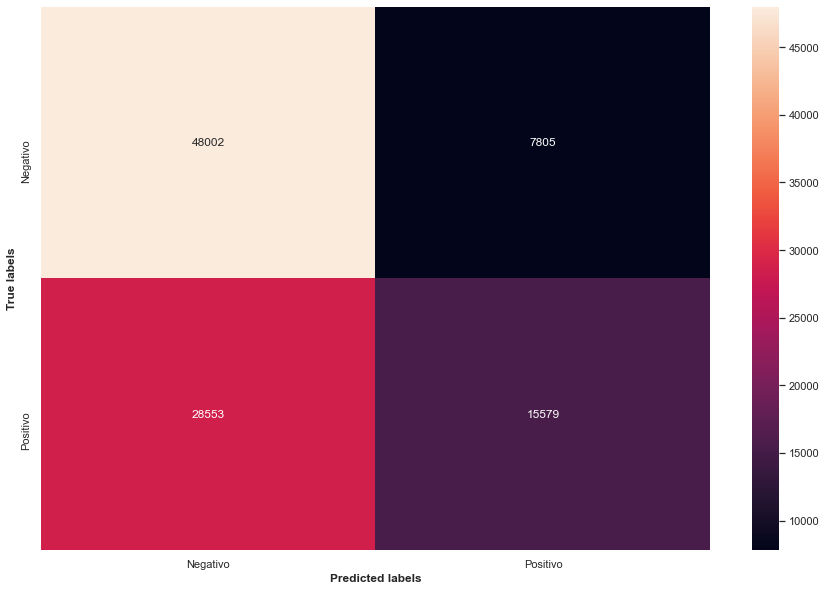

In [172]:
confusion_matrix_full(df_tratado_base)

Interessante reparar que o recall para a classe 0 ficou bem interessante, mostrando que noss modelo é relativamente bom em detectar volume de resultados negativos. Já o recall da classe 1 foi bem ruim, ou seja, nosso modelo não é feliz em detectar volume de resultados positivos. 

As precisions, da classe 0 e 1 ficaram levemente acima de um lançamento aleatório de moeda. 

Podemos reparar pela figura que temos um erro tipo 1 (falsos positivos) de 33% (7805/ (7805 + 15579)) da classe 1 e um erro tipo 2 (falsos negativos) de 65% (28553/(28553+15579)).

Vamos calcular a mutual information de cada feature com a variável target. Para isso vamos usar uma função

In [173]:
def make_mi_scores(df_tratado_base):
    '''Calcula os mi_scores e retorna uma série de features com mi scores'''
    #Criando nosso X
    X = df_tratado_base.drop(columns=['covid_res']) 
    #Removendo o target do X e usando ele para criar o y
    y = df_tratado_base['covid_res']
    # Todas as features com tipo numérico inteiro devem estar como int para esse método funcionar
    discrete_features = [pd.api.types.is_integer_dtype(t) for t in X.dtypes]
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features, random_state=43)
    #Criando uma serie
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    #Ordenando do maior para o menor
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

def plot_mi_scores(scores):
    '''Recebe as mi scores e plota um gráfico de barras'''
    scores = scores.sort_values(ascending=True)
    #Definindo tamanho de cada barra
    width = np.arange(len(scores))
    #Definindo o nome de cada barra
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

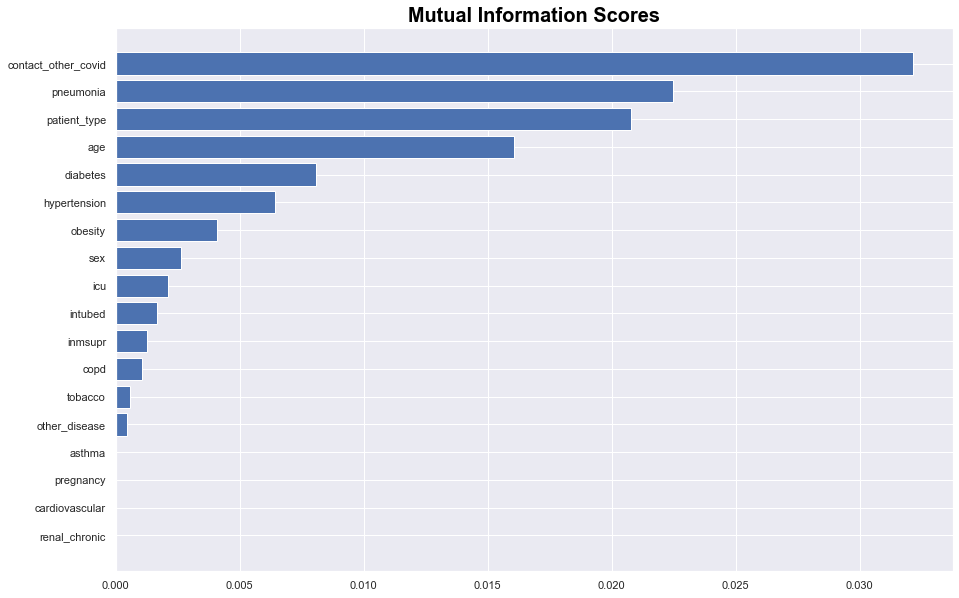

In [174]:
scores = make_mi_scores(df_tratado_base=df_tratado_base)
plot_mi_scores(scores)

Percebbemos que as features asthma, pregnancy, cardiovascular e renal_chornic tem mutual information zero com a variável target e, dessa forma, faremos um teste de dropar elas e ver se nosso modelo melhora. Se o modelo não melhorar é provavel que elas tenham relação com outras variáveis e o modelo se aproveita disso

Contact_other_covid, Pneumonia, patient_type, age, diabete, hupertension e obesity tem um mi score alto, mostrando que contem muita informação 

In [175]:
def drop_low_mi(X):
    X = X.drop(columns=['asthma','pregnancy','cardiovascular','renal_chronic'])
    return X

In [176]:
table_baseline #para comparar com o que iremos calcular agora

,count,mean,std,min,25%,50%,75%,max
test_recall,5.0,0.349662,0.004704,0.345050,0.346778,0.349157,0.350007,0.357315
train_recall,5.0,0.358456,0.002145,0.355821,0.356479,0.359475,0.360098,0.360409
test_precision,5.0,0.664272,0.003186,0.660378,0.661676,0.665281,0.665858,0.668167
train_precision,5.0,0.679741,0.002239,0.676660,0.678646,0.679599,0.681812,0.681990
test_f1_macro,5.0,0.591362,0.002946,0.588207,0.589340,0.591426,0.591971,0.595868
train_f1_macro,5.0,0.599697,0.000784,0.598769,0.599141,0.599698,0.600128,0.600747
test_accuracy,5.0,0.634789,0.002105,0.632425,0.633246,0.635022,0.635414,0.637841
train_accuracy,5.0,0.642122,0.000623,0.641516,0.641616,0.642133,0.642274,0.643073
test_roc_auc,5.0,0.650678,0.001404,0.648590,0.650240,0.650795,0.651425,0.652340
train_roc_auc,5.0,0.663844,0.001026,0.662947,0.663181,0.663622,0.663921,0.665550


In [177]:
#Criando o dataset para testar se tivemos melhora nas métricas
teste_improve_recall = drop_low_mi(df_tratado_base)
#Chamando a função para calcularmos as métricas
score_baseline(teste_improve_recall)

,count,mean,std,min,25%,50%,75%,max
test_recall,5.0,0.347333,0.003661,0.342020,0.347260,0.347345,0.347684,0.352358
train_recall,5.0,0.354478,0.001400,0.352365,0.353795,0.355013,0.355424,0.355792
test_precision,5.0,0.663984,0.002958,0.660667,0.661281,0.664265,0.666576,0.667131
train_precision,5.0,0.677499,0.001779,0.675590,0.675980,0.677509,0.678555,0.679864
test_f1_macro,5.0,0.590246,0.002312,0.587117,0.589263,0.590333,0.591139,0.593379
train_f1_macro,5.0,0.597273,0.000857,0.596321,0.596538,0.597327,0.597813,0.598366
test_accuracy,5.0,0.634177,0.001700,0.632087,0.632996,0.634276,0.635147,0.636377
train_accuracy,5.0,0.640434,0.000725,0.639758,0.639949,0.640085,0.640920,0.641459
test_roc_auc,5.0,0.649614,0.001449,0.647184,0.649700,0.649850,0.650343,0.650993
train_roc_auc,5.0,0.660493,0.000832,0.659733,0.660121,0.660131,0.660606,0.661873


Não houve melhora de recall no test com o drop das features com mi score baixo

#################### XGBoost ####################
              precision    recall  f1-score   support

0 - Negativo       0.63      0.86      0.73     55807
1 - Positivo       0.67      0.35      0.46     44132

    accuracy                           0.64     99939
   macro avg       0.65      0.61      0.59     99939
weighted avg       0.65      0.64      0.61     99939



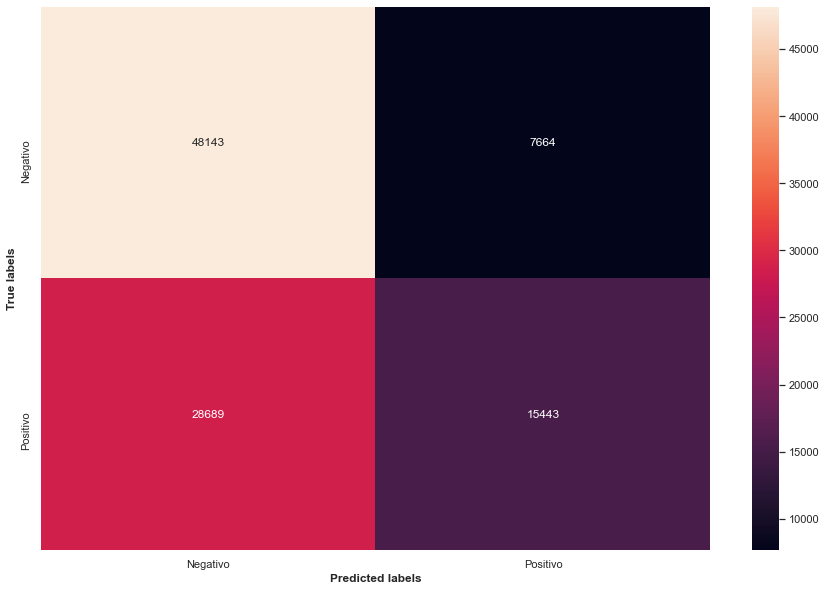

In [178]:
confusion_matrix_full(teste_improve_recall)

Percebemos que aumentamos o volume de falsos negativos (em volume) e reduzimos o volume de verdadeiros positivos. Por esse motivo, nosso recall caiu. Nossa precision teve uma leve melhora mas não é o nosso foco aqui.

Vamos tentar criar algumas features fazendo transformações de colunas no pandas e ver se isso melhora nosso modelo.

In [ ]:
'''def pandas_features(df):

    X = df.copy()
    
    #1) Coluna comorbidade
    #Piorou o modelo não iremos usá-la
    X['comorbidades'] = X['comorbidades'] = X[['pneumonia',
                                        'diabetes',
                                        'asthma',
                                        'copd',
                                        'inmsupr',
                                        'hypertension',
                                        'other_disease',
                                        'cardiovascular',
                                        'renal_chronic',
                                        'tobacco']].gt(0).sum(axis=1)

    #2) Coluna severidade
    #Piorou o modelo não iremos usá-la
    #Grau de severidade, onde os pesos foram definidos com base no EDA e nos mi score
    X['severidade'] = 3*X['pneumonia'] + 2*(X['diabetes']+X['hypertension']) + 1*X['obesity'] + 0.5*(X['inmsupr']+X['copd']+X['other_disease'])
    X = X.drop(columns=['pneumonia','diabetes','hypertension','obesity','inmsupr','copd','other_disease'])
    #Foi testado adicionando a coluna somente e adicionado a coluna e dropando as colunas que a originaram

    return X'''

Infelizmente, nenhuma dessas features melhorou em nada o recall do modelo, dessa forma deixei o código comentado para desconsiderá-lo mas ser possível entender meu raciocínio. 

Vamos tentar também construir uma nova feature envolvendo ranges de idades

In [63]:
#idades para construir o range
ranges = [0,10,20,30,40,50,60,70,80,90,100,110,120,130,140]

df_teste_feature_eng = df_tratado_base.copy()
#nova coluna com os ranges de idades
df_teste_feature_eng['age_ranges'] = pd.cut(df_tratado_base['age'],bins=ranges)
#Fazendo o onehot dessa coluna categórica
dummies = pd.get_dummies(data=df_teste_feature_eng['age_ranges'],drop_first=True).astype(str) 

#juntando a coluna de dummies e dropando a coluna de ranges de idade
df_teste_feature_eng = df_teste_feature_eng.join(dummies).drop(columns='age_ranges')

#mudando o nome das colunas para suprimir um warning que reclama de o nome conter intervalos
df_teste_feature_eng.columns = (['sex','patient_type','intubed','pneumonia','age','pregnancy','diabetes','copd','asthma','inmsupr','hypertension','other_disease','cardiovascular','obesity','renal_chronic','tobacco', 'contact_other_covid','covid_res','icu','10_20','20_30',
'30_40','40_50','50_60',"60_70","70_80","80_90","90_100","100_110","110_120","120_130","130_140"])

In [180]:
score_baseline(df_teste_feature_eng)

,count,mean,std,min,25%,50%,75%,max
test_recall,5.0,0.348563,0.004145,0.343521,0.346778,0.348364,0.349299,0.354851
train_recall,5.0,0.357662,0.001672,0.355736,0.356012,0.358327,0.358922,0.359312
test_precision,5.0,0.664514,0.002940,0.661033,0.662262,0.665170,0.665623,0.668481
train_precision,5.0,0.681275,0.002509,0.678841,0.678950,0.680930,0.683224,0.684428
test_f1_macro,5.0,0.590944,0.002615,0.588063,0.589155,0.591042,0.591589,0.594871
train_f1_macro,5.0,0.599771,0.000650,0.598806,0.599687,0.599831,0.599907,0.600625
test_accuracy,5.0,0.634632,0.001880,0.632750,0.633021,0.634809,0.635177,0.637403
train_accuracy,5.0,0.642459,0.000690,0.641894,0.641963,0.642017,0.643140,0.643282
test_roc_auc,5.0,0.650594,0.001628,0.648445,0.650004,0.650312,0.651403,0.652806
train_roc_auc,5.0,0.664113,0.000740,0.663342,0.663410,0.664295,0.664416,0.665102


Essa criação dos clusters de idade também não melhorou o recall do nosso modelo

C:\Users\gabri\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


#################### XGBoost ####################
              precision    recall  f1-score   support

0 - Negativo       0.63      0.86      0.73     55807
1 - Positivo       0.67      0.35      0.46     44132

    accuracy                           0.64     99939
   macro avg       0.65      0.61      0.59     99939
weighted avg       0.64      0.64      0.61     99939



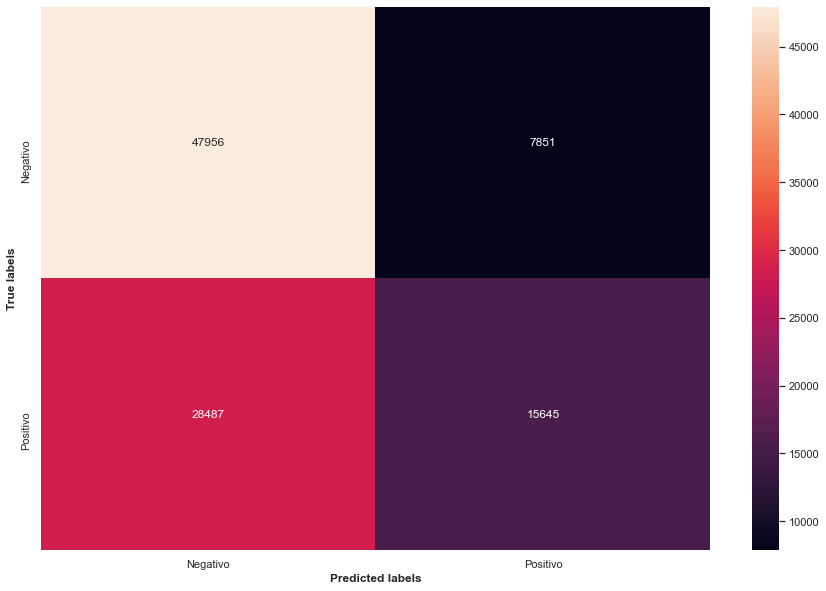

In [64]:
confusion_matrix_full(df_teste_feature_eng)

Aqui o volume de falsos negativos reduziu e o volume de verdadeiros positivos aumentou, nos induzindo a acreditar que nosso modelo melhorou em relação ao recall, no entanto quando fazemos a validação cruzada conforme a tabela acima, vemos que essa melhora não ocorreu em uma amostra mas na média das 5 tentativas não.

Temos algumas features que tem um enorme probabilidade de ocorreram após o resultado do teste, sendo elas:
- intubação
- icu
- patient_type

Vamos testar dropar elas e avaliar a performance do modelo



In [59]:
df_droped = df_tratado_base.drop(columns=['intubed','icu','patient_type'])
score_baseline(df_droped)

,count,mean,std,min,25%,50%,75%,max
test_recall,5.0,0.344591,0.004269,0.340008,0.340235,0.346240,0.346891,0.349582
train_recall,5.0,0.353017,0.000578,0.352358,0.352570,0.352939,0.353604,0.353611
test_precision,5.0,0.637727,0.003467,0.632810,0.635603,0.639196,0.639583,0.641443
train_precision,5.0,0.652274,0.001509,0.651188,0.651226,0.651599,0.652573,0.654782
test_f1_macro,5.0,0.581312,0.002310,0.578751,0.580040,0.580486,0.582732,0.584548
train_f1_macro,5.0,0.589292,0.000424,0.588899,0.589102,0.589219,0.589228,0.590012
test_accuracy,5.0,0.624138,0.001711,0.622481,0.622589,0.623990,0.625133,0.626496
train_accuracy,5.0,0.631197,0.000517,0.630859,0.630922,0.630935,0.631173,0.632097
test_roc_auc,5.0,0.643288,0.000890,0.641961,0.643188,0.643328,0.643514,0.644447
train_roc_auc,5.0,0.655193,0.000852,0.654594,0.654753,0.654831,0.655109,0.656680


Infelizmente essa abordagem de dropar algumas features também não melhorou a performance do modelo em relação a métrica recall

#################### XGBoost ####################
              precision    recall  f1-score   support

0 - Negativo       0.62      0.85      0.72     55807
1 - Positivo       0.64      0.34      0.45     44132

    accuracy                           0.63     99939
   macro avg       0.63      0.60      0.58     99939
weighted avg       0.63      0.63      0.60     99939



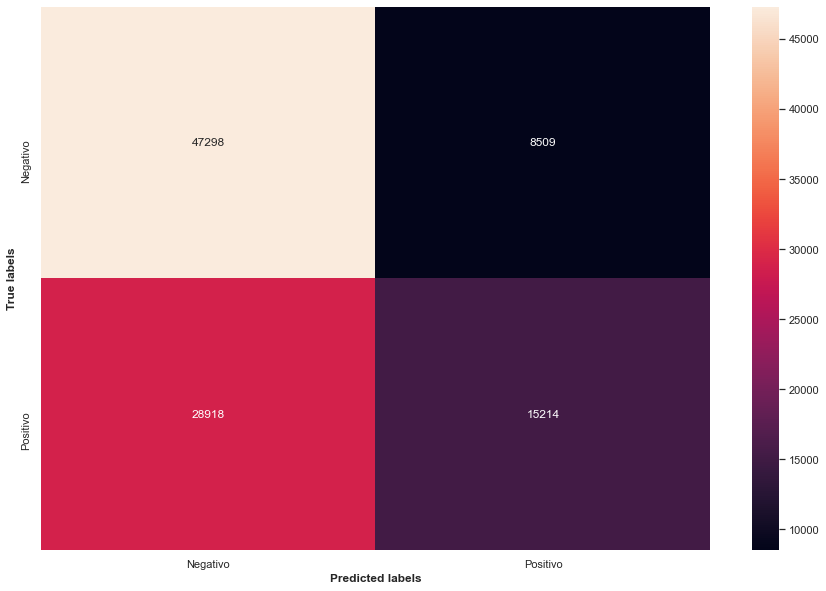

In [187]:
confusion_matrix_full(df_droped)

Aqui tivemos uma piora dos falsos negativos (aumento do volume) e uma piora dos verdadeiros positivos (redução do volume). Dessa forma o recall caiu.

Como nenhuma das abordagens de feature engeneering usadas melhorou nosso modelo usaremos o dataset com as features originais e testaremos diferentes modelos

## Modelagem

Treinaremos 8 modelos diferentes

In [57]:
#Criando um dicionário com alguns modelos de classificação que testaremos
models = {  'Decision Tree': DecisionTreeClassifier(random_state=43),
            'Random Forest': RandomForestClassifier(random_state=43),
            'Gradiente Boost': GradientBoostingClassifier(random_state=43),
            'Ada Boost': AdaBoostClassifier(random_state=43),
            'Regressão Logística': LogisticRegression(random_state=43),
            'XGBoost': XGBClassifier(random_state=43,eval_metric='logloss',use_label_encoder=False),
            'LGBM': LGBMClassifier(random_state=43),
            'Catboost': CatBoostClassifier(random_state=43,verbose=False)
         }

#Função para treinar e validar os modelos
def model_predictions(df,models):
    '''Função que:
     - recebe o df, 
     - cria o x,y,
     - divide a base em treino e teste, 
     - treina o modelo com validação cruzada, 
     - calcula uma série de métricas de interesse,
     - Retorna uma tabela e os modelos fitados
     '''

    #Criando nosso X e y
    X = df.drop(columns=['covid_res']) 
    y = df['covid_res']
    #Dividindo nossa base em treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify=y)

    #Dicionário em que salvaremos as métricas de cada modelo
    metrics_model_dict = {}
    #Lista com os estimadores
    estimators = []

    #Faremos o processo abaixo para cada modelo
    for model in models:
        #Somente para termos uma noção do que está ocorrendo já que será um fit demorado
        print(f"Fit do modelo {model} iniciado...")
        
        #Criando nosso pipeline. Como todos os dados já são numéricos não precisaremos fazer onehotencode
        #Apesar de somente a coluna idade precisar ser normalizada, aplicaremos a transformação em todas as
        #colunas como uma boa prática de sempre normalizar o dataset inteiro
        my_pipe = Pipeline(steps=[
                                    ('Normalização dos dados',PowerTransformer()),
                                    (model,models[model])
                                ])
        #Faremos uma validação cruzada em 5 folds já que com 10 fold estava gastando um tempo elevado para estimar as métricas
        #Apesar de buscarmos a maximização do recall, olharemos para todas as métricas de classificação relevantes
        #(Recall, Precision, F1, Acurácia, AUC)
        
        metrics = ['recall','precision','f1','accuracy','roc_auc']
        
        scores = cross_validate(
                                    estimator = my_pipe, #o pipeline
                                    X = X_train, #será usado para treino e validação
                                    y = y_train, #será usado para treino e validação
                                    scoring= metrics, #lista de métricas que queremos
                                    cv = 5, #numero de folds
                                    return_train_score=True, #Para olhar como estão as métricas no treino e comparar com o teste,
                                    return_estimator = True,
                                    n_jobs=-1 #para paralelizar o máximo possível
                            )
        # Dicionário com as métricas de cada modelo                    
        metrics_model_dict[model] = {'recall_test': scores['test_recall'].mean(),
                                     'recall_train': scores['train_recall'].mean(),
                                     'precision_test': scores['test_precision'].mean(),
                                     'precision_train': scores['train_precision'].mean(),
                                     'f1_test': scores['test_f1'].mean(),
                                     'f1_train': scores['train_f1'].mean(),
                                     'accuracy_test': scores['test_accuracy'].mean(),
                                     'accuracy_train': scores['train_accuracy'].mean(),
                                     'roc_auc_test': scores['test_roc_auc'].mean(),
                                     'roc_auc_train': scores['train_roc_auc'].mean(),
                                    }
        
        estimators.append(scores['estimator'])
        #Para sabermos quando um modelo foi fitado e o tempo que está levando
        print(f"Fit do modelo {model} finalizado: fit_time: {scores['fit_time'].mean():.2f} e score_time: {scores['score_time'].mean():.2f}")
    #Criando uma tabela com cada métrica como uma linha e cada modelo como uma coluna
    tabela = pd.DataFrame(metrics_model_dict)
    return tabela,estimators

def plot_roc_auc(df,models):
    '''Função para o plot da curva roc'''
    
    #Criando nosso X e y
    X = df.drop(columns=['covid_res']) 
    y = df['covid_res']
    #Dividindo nossa base em treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify=y)

    #Dicionário em que salvaremos as métricas de cada modelo
    for model in models:
        my_pipe = Pipeline(steps=[
                                        ('Normalização dos dados',PowerTransformer()),
                                        (model,models[model])
                                    ])
        #Fazendo o fit do modelo
        my_pipe.fit(X_train,y_train)
        #Fazendo o predict do modelo
        y_pred = my_pipe.predict(X_test)
        #Calculando as métricas para plotar a curva roc-auc
        fpr, tpr, thresholds = roc_curve(y_test,y_pred)
        auc = roc_auc_score(y_test,y_pred)
        #Plotando o gráfico
        graph = sns.lineplot(y=tpr,x=fpr,label=f'{model} AUC: {auc:.3f}')

    #Definindo as formatações do plot do plot
    plt.title('ROC-AUC Curve')
    plt.ylabel('True Positive Rate')
    plt.xlim(0,1.0)
    plt.ylim(0,1.0)
    plt.xlabel('False Positive Ratio')
    plt.legend()
    plt.show()    

In [58]:
df_models,estimators = model_predictions(df_tratado_base,models)

Fit do modelo Decision Tree iniciado...
Fit do modelo Decision Tree finalizado: fit_time: 27.17 e score_time: 0.64
Fit do modelo Random Forest iniciado...
Fit do modelo Random Forest finalizado: fit_time: 111.46 e score_time: 7.55
Fit do modelo Gradiente Boost iniciado...
Fit do modelo Gradiente Boost finalizado: fit_time: 106.89 e score_time: 1.02
Fit do modelo Ada Boost iniciado...
Fit do modelo Ada Boost finalizado: fit_time: 53.07 e score_time: 3.58
Fit do modelo Regressão Logística iniciado...
Fit do modelo Regressão Logística finalizado: fit_time: 23.73 e score_time: 0.56
Fit do modelo XGBoost iniciado...
Fit do modelo XGBoost finalizado: fit_time: 74.64 e score_time: 0.82
Fit do modelo LGBM iniciado...
Fit do modelo LGBM finalizado: fit_time: 26.67 e score_time: 2.26
Fit do modelo Catboost iniciado...
Fit do modelo Catboost finalizado: fit_time: 231.78 e score_time: 0.77


In [126]:
df_models.T.sort_values(by='recall_test',ascending=False)

,recall_test,recall_train,precision_test,precision_train,f1_test,f1_train,accuracy_test,accuracy_train,roc_auc_test,roc_auc_train
Regressão Logística,0.362425,0.362620,0.646325,0.646536,0.464419,0.464639,0.630882,0.631000,0.643136,0.643235
Ada Boost,0.356998,0.357237,0.654952,0.655532,0.462104,0.462452,0.633011,0.633269,0.646270,0.646632
XGBoost,0.349662,0.358456,0.664272,0.679741,0.458150,0.469380,0.634789,0.642122,0.650678,0.663844
Catboost,0.348959,0.359295,0.664778,0.683430,0.457662,0.470981,0.634809,0.643579,0.650756,0.666618
Random Forest,0.347939,0.414107,0.624955,0.742091,0.447002,0.531578,0.619853,0.677725,0.622885,0.721412
LGBM,0.347679,0.351150,0.668766,0.675403,0.457481,0.462054,0.635895,0.638948,0.652424,0.657923
Gradiente Boost,0.343062,0.344069,0.669298,0.671111,0.453602,0.454901,0.635050,0.635886,0.651708,0.653042
Decision Tree,0.327098,0.395423,0.627312,0.759547,0.429976,0.520086,0.617044,0.677749,0.613954,0.724015


Os melhores modelos considerando o recall foram a Regressão Logística, Adaboost e XGboost. 

Podemos perceber que a random forrest e a decision tree tiveram overfiting do treino tanto no recall como em precision, já que os valores tiveram uma queda brusca de treino para teste


In [112]:
confusion_matrix_full(df_tratado_base, models)

################################################## Decision Tree ##################################################
              precision    recall  f1-score   support

0 - Negativo       0.62      0.85      0.71     55807
1 - Positivo       0.64      0.33      0.44     44132

    accuracy                           0.62     99939
   macro avg       0.63      0.59      0.58     99939
weighted avg       0.62      0.62      0.59     99939

################################################## Random Forest ##################################################
              precision    recall  f1-score   support

0 - Negativo       0.62      0.84      0.71     55807
1 - Positivo       0.63      0.35      0.45     44132

    accuracy                           0.62     99939
   macro avg       0.63      0.60      0.58     99939
weighted avg       0.63      0.62      0.60     99939

################################################## Gradiente Boost ###############################################

Olhando pela matriz de classificação novamente melhores modelos em relação ao critério recall foram a Regressão Logística, o Ada Boost e o XGboost. 

Os modelos mais complexos tendem a precisar de mais tunning dos hipermarâmetros para funcionar melhor e portanto tentaremos otimizá-los também. No entanto, os resultados não aperentam ser muito promissores, já que nossos recalls estão inferiores a 50%

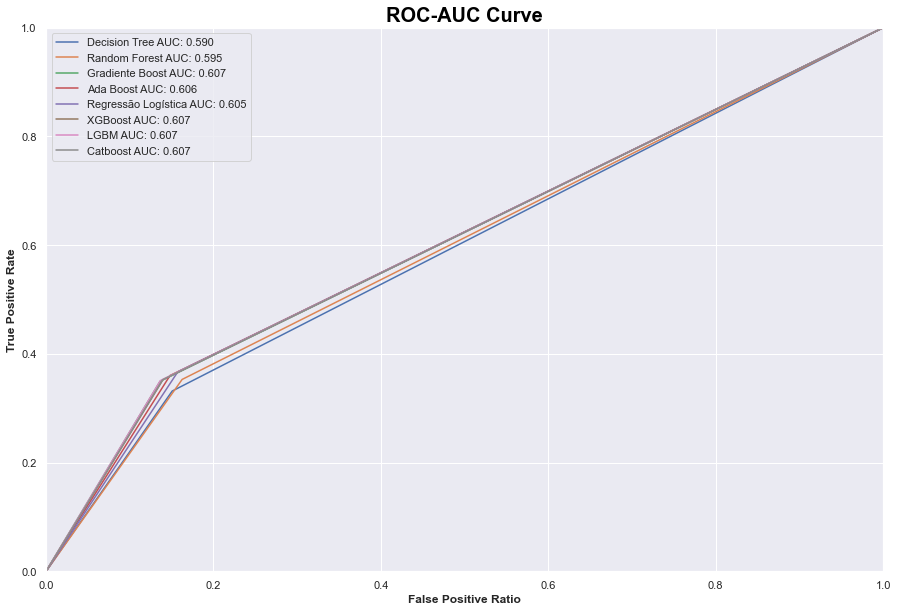

In [69]:
plot_roc_auc(df_tratado_base,models)

Olhando para as curvas ROC vemos que não temos nenhum trashold em que nossa taxa de verdadeiros positivos seja alta em conjunto com uma taxa de falsos positivos baixa. 

Se analisarmos o AUC das curvas, eles são levemente melhores do que o lançamento de uma moeda, o que é um mau sinal. Aparentemente nosso modelo está com um vies muito alto e não está conseguindo capturar o comportamento da variável target, a variance dele está consistentemente no treino e no teste.

Antes de começar a otimização de hiperparâmetros vamos olhar para as features que foram mais importantes para nossos 3 modelos

In [106]:
#formato que os estimadores vieram
estimators

[[Pipeline(steps=[('Normalização dos dados', PowerTransformer()),
                  ('Decision Tree', DecisionTreeClassifier(random_state=43))]),
  Pipeline(steps=[('Normalização dos dados', PowerTransformer()),
                  ('Decision Tree', DecisionTreeClassifier(random_state=43))]),
  Pipeline(steps=[('Normalização dos dados', PowerTransformer()),
                  ('Decision Tree', DecisionTreeClassifier(random_state=43))]),
  Pipeline(steps=[('Normalização dos dados', PowerTransformer()),
                  ('Decision Tree', DecisionTreeClassifier(random_state=43))]),
  Pipeline(steps=[('Normalização dos dados', PowerTransformer()),
                  ('Decision Tree', DecisionTreeClassifier(random_state=43))])],
 [Pipeline(steps=[('Normalização dos dados', PowerTransformer()),
                  ('Random Forest', RandomForestClassifier(random_state=32))]),
  Pipeline(steps=[('Normalização dos dados', PowerTransformer()),
                  ('Random Forest', RandomForestClassifie

In [128]:
# Na vavariável estimators, temos 8 listas, sendo que cada um dela contém 5 pipelines para cada validação cruzada e cada pipeline contem 2 termos (normalização e modelo). 
# Para acessar a feature importance de cada fold temos que usar: estimators[indice em que o modelo se encontra][indice da fold][nome do modelo no pipeline].metodo que retorna feature importance
# Os modelos Regressão logística, Ada Boost e XGBoost correspondem aos indices 3,4 e 5

#Selecionado os estimadores dos melhores modelos e criando um dicionário com eles
estimators_selected = {'Ada Boost':estimators[3],"Regressão Logística":estimators[4],"XGBoost":estimators[5]}

#dicionário para salvar as features importânce médias após o final do loop abaixo
list_feature_importance_final = {}

#Primeiro vamos fazer um loop para cada chave do dicionário "estimators_selected"
for estimator in estimators_selected:
    #Pegando a feature importânce da primeira fold para o primeiro modelo
    if estimator == "Regressão Logística":
        feature_importance_sum = estimators_selected[estimator][0][estimator].coef_[0]
    else:
        feature_importance_sum = estimators_selected[estimator][0][estimator].feature_importances_
    #Loop para somar as features importânces  das folds 2,3,4,5 a variável de soma acima
    for i in range(1,5):
        #Se for regressão logística a feature importânce é com o método coef
        if estimator == "Regressão Logística":
            feature_importance_sum += estimators_selected[estimator][i][estimator].coef_[0]
        else:
            feature_importance_sum += estimators_selected[estimator][i][estimator].feature_importances_
    #Adicionando ao dicionário list_feature_importance_final o valor médio cada importância de feature (média das 5 folds)
    list_feature_importance_final[estimator] = feature_importance_sum/5 


#Como a regressão logística dá coenficientes negativos e não são no range de 0 a 1. Vamos alterar isso para deixar mais comparável com o Adaboost e com o Xgboost

list_feature_importance_final['Regressão Logística'] = np.abs(list_feature_importance_final['Regressão Logística'])
list_feature_importance_final['Regressão Logística'] = list_feature_importance_final['Regressão Logística']/list_feature_importance_final['Regressão Logística'].sum()

list_feature_importance_final

{'Ada Boost': array([0.032, 0.1  , 0.02 , 0.076, 0.488, 0.012, 0.02 , 0.02 , 0.02 ,
        0.04 , 0.02 , 0.02 , 0.02 , 0.032, 0.02 , 0.02 , 0.02 , 0.02 ]),
 'Regressão Logística': array([0.0787762 , 0.14202591, 0.02663905, 0.14504648, 0.15135694,
        0.0078798 , 0.036835  , 0.04276438, 0.02384919, 0.04186156,
        0.00240647, 0.03458871, 0.03844605, 0.08278389, 0.03690474,
        0.05457344, 0.03739048, 0.01587172]),
 'XGBoost': array([0.03417234, 0.46177873, 0.01474341, 0.15936927, 0.04337626,
        0.01044254, 0.02475794, 0.02915206, 0.01452109, 0.0261758 ,
        0.00911385, 0.0231509 , 0.02166502, 0.03802646, 0.02866949,
        0.03302104, 0.01910895, 0.00875479], dtype=float32)}

Text(0, 0.5, 'Features')

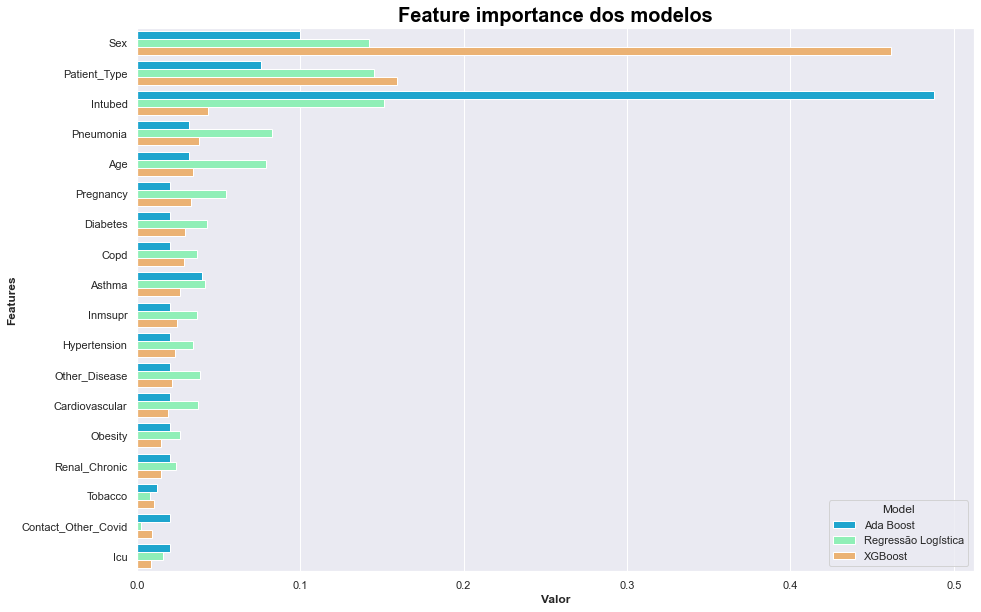

In [60]:
#Criando um dataframe para facilitar o plot
plot_df = pd.DataFrame(list_feature_importance_final).sort_values(by=['XGBoost','Ada Boost','Regressão Logística'],ascending=False)

#Criando uma coluna com o nome das features
plot_df['features_name'] = ['sex', 'patient_type', 'intubed', 'pneumonia', 'age', 'pregnancy',
       'diabetes', 'copd', 'asthma', 'inmsupr', 'hypertension',
       'other_disease', 'cardiovascular', 'obesity', 'renal_chronic',
       'tobacco', 'contact_other_covid','icu']

#Deixando o nome de todas as features em maíscula       
plot_df['features_name'] = plot_df['features_name'].str.title()
#Fazendo um melt do dataset para conseguirmos usar o modelo de hue e plot todas as feature importânce em um único gráfico
plot_df = plot_df.melt(value_name='Value',var_name='Model',id_vars='features_name',value_vars=['Ada Boost','Regressão Logística','XGBoost'])
# Como os coeficentes da regressão logística podem ser negativos, vamos deixar o numero absoluto
plot_df['Value'] = np.abs(plot_df['Value'])

#plotando o gráfico de barras
graph = sns.barplot(data=plot_df,x='Value',y='features_name',hue='Model',palette='rainbow')
graph.set_title('Feature importance dos modelos')
graph.set_xlabel('Valor')
graph.set_ylabel('Features')

Anlisando a feature importânce dos melhores modelos percebemos que:

Ada Boost:
- Dá um peso muito grande para a intubação, o que é preocupante já que a intubação ocorre normalmente após o teste quando o quadro se complica. Então o modelo está sendo mais influenciado por uma variável que na maior parte dos casos ocorre após a predição
- O segundo maior peso é o sexo, no dataset que escolhemos os homens deram mais positivo do que negativo e nas mulheres foi o contrario. No entanto, no mundo real a população é 50% de cada sexo e isso não deveria ser o segundo maior peso no nosso modelo
- O terceiro maior peso é a dispensa ou internação que é algo que na maioria dos casos também ocorrerá após o teste

Regressão Logística
- Os 3 primeiros maiores pesos são iguais ao adaboost e podemos chegar a conclusões semelhantes
- O 4 maior peso é a presença ou ausência de pneumonia que realmente pode influenciar o teste ser positivo já que é uma doença não tão frequente na população em condições normais e bastante frequente em pessoas com sintomas graves de covid ou grupo de risco
- O 5 peso, idade, se relaciona com o quarto peso e pessoas com pneumonia e idades avançadas, por exemplo, tendem a ter resultados semelhantes no teste

XGboost
- Apresenta o maior peso para a variável sexo, o que cai no mesmo caso do adaboost, sendo um mau sinal
- O 2 e 3 maiores pesos caem também nas mesmas conclusões do adaboost



Esse comportamento pode se alterar após o tunning dos modelos, mas não é um bom sinal e pode indicar que:
- Os modelos não estão conseguindo capturar o comportamento dos dados
- Os dados não são tão relevantes para prever a target desejada

Vamos iniciar agora uma etapa de tentativa de tunning dos modelos

# Passo 3: Tunning dos modelos

Para realizar o tunning dos modelos, precisaremos analisar cada hipermarâmetro e criar um grid de otimização

## Ada Boost

Ele tem os seguintes hiperparâmetros:

- base_estimator: modelo que ele usarará para criar os stamps. O que é usado aqui quando esse hiperâmetro fica vazio é o DecisionTreeClassifier com uma profundidade máxima = 1 já que o ada boost cria arvores com um nó diversas vezes e aprende com esse modelo. Esse hiperâmetro não iremos alterar
- n_estimators: aqui são o número de stamps que ele usará
- learning_rate: a contribuição de cada stamp para a construção dos novos pesos. Learning rate proximos de 1 significa que o modelo irá aprender mais rapido mas ele pode ser menos preciso
- algorithm: os dois algorítmos possíveis aqui são o SAMME e o SAMMER. O primeiro usa o resultado da classificação para atualizar os pesos de cada erro/acerto do modelo e o segundo usa probabilidade para isso

Vamos usar o optuna e tentaremos otimizar a métrica recall

In [68]:
#Só haviamos definido X,y, os splits e a normalização dentro de funções e o optuna usa varíaveis globais nos estudos
#Dessa forma defineremos aqui normavamente
X = df_tratado.drop(columns=['covid_res']) 
y = df_tratado['covid_res']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify=y)

power = PowerTransformer()
X_train_norm = power.fit_transform(X_train)
X_test_norm = power.transform(X_test)

In [85]:
#definindo uma função objetivo
def objective(trial):
    #Definindo o dicionário com o grid de parâmetros que testaremos
    params = dict(
        n_estimators = trial.suggest_int('n_estimators',20,2000,log=True),
        learning_rate = trial.suggest_float('learning_rate',1e-3,1e-1,log=True),
        algorithm = trial.suggest_categorical('algorithm',['SAMME', 'SAMME.R'])
    )
    #Instanciado o modelo
    model = AdaBoostClassifier(**params,random_state=42)
    #O que queremos maximizar é a métrica recall e para isso faremos um cross validation de 3 folds, como teremos 3 recall de retorno (para cada fold), pegaremos a média deles
    return cross_validate(model,
                        X_train_norm,
                        y_train,
                        scoring=['recall'],
                        cv = 3,
                        n_jobs=-1)['test_recall'].mean()

study = optuna.create_study(direction="maximize",study_name ='Ada Boost Study')
study.optimize(objective, n_trials=40)
adaboost_params = study.best_params

[I 2022-02-15 00:49:57,444] A new study created in memory with name: Ada Boost Study
[I 2022-02-15 00:52:31,030] Trial 0 finished with value: 0.3245149588655171 and parameters: {'n_estimators': 323, 'learning_rate': 0.020832313389384884, 'algorithm': 'SAMME.R'}. Best is trial 0 with value: 0.3245149588655171.
[I 2022-02-15 00:53:16,938] Trial 1 finished with value: 0.3230590865282869 and parameters: {'n_estimators': 101, 'learning_rate': 0.09113535063381484, 'algorithm': 'SAMME'}. Best is trial 0 with value: 0.3245149588655171.
[I 2022-02-15 00:54:31,771] Trial 2 finished with value: 0.32903554200263985 and parameters: {'n_estimators': 162, 'learning_rate': 0.00794206534786831, 'algorithm': 'SAMME.R'}. Best is trial 2 with value: 0.32903554200263985.
[I 2022-02-15 01:03:56,510] Trial 3 finished with value: 0.3612576416231364 and parameters: {'n_estimators': 1230, 'learning_rate': 0.09005978609207514, 'algorithm': 'SAMME.R'}. Best is trial 3 with value: 0.3612576416231364.
[I 2022-02-15

O tempo para rodar 40 trails foi de 225 minutos. Um tempo bastante expressivo para uma melhora pequena no F1 de 1 ponto percentual 

In [86]:
adaboost_params

{'n_estimators': 1457,
 'learning_rate': 0.09458657603307162,
 'algorithm': 'SAMME.R'}

Esses foram os melhores parâmetros:

{'n_estimators': 1457,
 'learning_rate': 0.09458657603307162,
 'algorithm': 'SAMME.R'}

In [87]:
plot_optimization_history(study)

Vemos que a partir do trial de número 13 o optuna já havia achado chegado extremamente próximo do máximo valor de recall e nos 20 trials seguintes a melhora foi na terceira casal decimal

In [88]:
plot_parallel_coordinate(study)

A maioria dos trails convereginaram para o algorithmo "SAMME.R" e para valores de learning rate próximo de 0,09 . Quando ao número de estimadores, a variação foi muito grande

In [89]:
plot_contour(study)

Aqui vemos que com
- Quando o SAMME foi escolhido, para numero de estimadores entre 1250 e 1750 e learning rate próximo de 0.1, o modelo chegou mais próximo da maximização da função objetivo
- Quando o SAMME.R foi escolhido, para valores entre 1000 e 1750 estimadores e para valores de learning rate entre 0.75 e 0.1, o modelo chegou mais próximo da função objetivo

In [90]:
plot_slice(study)

O SAMME.R conseguiu maximizar o objetivo em trial próximos da casa das 40 tentativas, o learning rate em aproximadamente 20 trails já havia maximizado a função objetivo e o mesmo comportamento se observa para o número de estimadores. É importante perceber que nos primeiros 10 a 15 trials o algorítmo SAMME.R já havia chegado muito próximo do máximo possível da função objetivo

In [91]:
plot_param_importances(study)

Todos os hiperparâmetros tiveram importâncias balanceadas, sendo que o learning rate foi o que fez o maior número de trails ser necessário, já que o máximo para ele foi encontrado próximo do trial de 40

## Regressão Logística

Vamos agora otimizar a regressão logística e e explicar os hiperparâmetros que iremos usar

- penalty: tipo de penalidade que usaremos, podendo ser nenhuma, l1(lasso),l2(ridge) e elasticnet
- tol: tolerancia do critério de parada, ou seja, a partir de quanto o modelo irá parar se não estiver havendo melhora
- C:  inverso da força da regularização. Quanto maior, menor será a força da regularização
- solver: tipo de solver utilizado. Lendo a documentação vemos que os métodos 'saga' e 'sag' são melhores para data sets grandes. Considerando o tempo que o optuna está levando para fazer cada trial, vamos considerar nosso dataset grande e usaremos somente o método saga para conseguir usarar todas as penalizações
- max_iter: número máximo de interações para o algorítmo convergir ao máximium likelyhood
- warm_start: com esse parâmetro o algorítmo usa as soluções anteriores para realizar as próximas soluções
- l1_ratio: parâmetro para a penalização elasticnet. Se esse parâmetro for 0 ou 1 é equivalente a usar o l2 ou o l1,respectivamente.

In [69]:
#definindo uma função objetivo
def objective(trial):
    #Definindo o dicionário com o grid de parâmetros que testaremos
    params = dict(
        penalty = trial.suggest_categorical('penalty',['none','l1','l2','elasticnet']),
        tol = trial.suggest_float('tol',1e-4,1e-2,log=True),
        C = trial.suggest_float('C',1,3.5),
        max_iter = trial.suggest_float('max_iter',100,500),
        warm_start = trial.suggest_categorical('warm_start',[True,False]),
        l1_ratio = trial.suggest_float('l1_ratio',0,1)
    )
    #Instanciado o modelo
    model = LogisticRegression(**params,random_state=42,n_jobs=-1,solver='saga')
    #O que queremos maximizar é a métrica recall e para isso faremos um cross validation de 3 folds, como teremos 3 recall de retorno (para cada fold), pegaremos a média deles
    return cross_validate(model,
                        X_train_norm,
                        y_train,
                        scoring=['recall'],
                        cv = 3,
                        n_jobs=-1)['test_recall'].mean()

study_lg = optuna.create_study(direction="maximize",study_name ='Logistic Regression Study')
study_lg.optimize(objective, n_trials=100)
reglog_params = study_lg.best_params

[I 2022-02-15 00:22:26,019] A new study created in memory with name: Logistic Regression Study
[I 2022-02-15 00:22:32,564] Trial 0 finished with value: 0.3655346516214954 and parameters: {'penalty': 'l1', 'tol': 0.00041372887879351255, 'C': 1.9200618143273285, 'max_iter': 219.23042615084634, 'warm_start': True, 'l1_ratio': 0.12250492318610107}. Best is trial 0 with value: 0.3655346516214954.
[I 2022-02-15 00:22:38,669] Trial 1 finished with value: 0.3655346516214954 and parameters: {'penalty': 'none', 'tol': 0.00018059852417981738, 'C': 3.3770151993575213, 'max_iter': 233.29586743121902, 'warm_start': False, 'l1_ratio': 0.4346788249602357}. Best is trial 0 with value: 0.3655346516214954.
[I 2022-02-15 00:22:44,811] Trial 2 finished with value: 0.3655346516214954 and parameters: {'penalty': 'l1', 'tol': 0.00029331496548977535, 'C': 1.9277363911233085, 'max_iter': 477.8573337178833, 'warm_start': False, 'l1_ratio': 0.6834390860799053}. Best is trial 0 with value: 0.3655346516214954.
[I 2

In [70]:
reglog_params

{'penalty': 'none',
 'tol': 0.008561663787954222,
 'C': 3.023315250192991,
 'max_iter': 424.0033136396073,
 'warm_start': True,
 'l1_ratio': 0.3513680912570086}

Segunda tentativa agora modificando os tipos de penalidade possíveis e os tipos de solver possíveis

In [71]:
#definindo uma função objetivo
def objective(trial):
    #Definindo o dicionário com o grid de parâmetros que testaremos
    params = dict(
        penalty = trial.suggest_categorical('penalty',['none','l2']), #usaremos apenas essas penalidades para conseguirmos usar diferentes solvers
        solver = trial.suggest_categorical('solver',['sag','newton-cg','lbfgs']),
        tol = trial.suggest_float('tol',1e-4,1e-2,log=True),
        C = trial.suggest_float('C',1,3.5),
        max_iter = trial.suggest_float('max_iter',100,500),
        warm_start = trial.suggest_categorical('warm_start',[True,False]),
    )
    #Instanciado o modelo
    model = LogisticRegression(**params,random_state=42,n_jobs=-1,l1_ratio=0) #l1_ratio = 0 é equivalente a escolher a penalidade l2
    #O que queremos maximizar é a métrica recall e para isso faremos um cross validation de 3 folds, como teremos 3 recall de retorno (para cada fold), pegaremos a média deles
    return cross_validate(model,
                        X_train_norm,
                        y_train,
                        scoring=['recall'],
                        cv = 3,
                        n_jobs=-1)['test_recall'].mean()

study_lg_2 = optuna.create_study(direction="maximize",study_name ='Logistic Regression Study')
study_lg_2.optimize(objective, n_trials=100) #Como a regressão logística é bem rápida, aqui usaremos 100 trials
reglog_params_2 = study_lg_2.best_params

[I 2022-02-15 00:27:52,867] A new study created in memory with name: Logistic Regression Study
[I 2022-02-15 00:28:02,348] Trial 0 finished with value: 0.3655346516214954 and parameters: {'penalty': 'l2', 'solver': 'sag', 'tol': 0.00014270791520616153, 'C': 2.2829926222061965, 'max_iter': 450.852123714734, 'warm_start': True}. Best is trial 0 with value: 0.3655346516214954.
[I 2022-02-15 00:28:09,807] Trial 1 finished with value: 0.3655856366715417 and parameters: {'penalty': 'none', 'solver': 'sag', 'tol': 0.001012651656861269, 'C': 2.888220303246227, 'max_iter': 234.91425174627327, 'warm_start': True}. Best is trial 1 with value: 0.3655856366715417.
[I 2022-02-15 00:28:17,499] Trial 2 finished with value: 0.3655403165093873 and parameters: {'penalty': 'none', 'solver': 'sag', 'tol': 0.00037781428155804334, 'C': 2.7204727291811435, 'max_iter': 401.0435316095243, 'warm_start': False}. Best is trial 1 with value: 0.3655856366715417.
[I 2022-02-15 00:28:25,890] Trial 3 finished with valu

In [72]:
reglog_params_2

{'penalty': 'l2',
 'solver': 'sag',
 'tol': 0.007220213757337107,
 'C': 2.1394013555297637,
 'max_iter': 432.83582352761834,
 'warm_start': False}

Vemos que a nossa segunda tentativa resultado temos o melhor valor de de recall de 0.3657725786458949 enquanto a primeira tentativa resultado em um valor de 0.36562529252345133 que foi ligeiramente pior. 

O Adaboost teve uma performance após o tunning de recall = 0.36301943513966317 que foi pior do que a melhor tentativa da regressão logística do segundo estudo.

In [73]:
graph = plot_optimization_history(study_lg)
graph.update_layout(title="Otimization History Plot - Reg Logistic Study 1")

In [74]:
graph = plot_optimization_history(study_lg_2)
graph.update_layout(title="Otimization History Plot - Reg Logistic Study 2")

Para o primeiro estudo o máximo local foi alcançado com 23 trails e seguiu dessa forma por mais 77 trials. Já para o estudo 2, esse máximo local só foi encontrado com 41 trials e seguiu nele por mais 59 trials. Dessa forma, percebemos que possivelmente não existe mais espaço para otimização

In [75]:
graph = plot_parallel_coordinate(study_lg)
graph.update_layout(title="Parallel Coordinate Plot - Reg Logistic Study 1")

Nessa primeira tentativa com a regressão logística vemos que: 
- O inverso da força da penalidade (C) fico mais concentrado próximo a 1.5, apesar de o melhor parâmetro ter dado em 3,16. 
- O razão entre as penanilidades de L1 e L2 ficou concentradada entre 0,2 e 0,4.
- O número máximo de interações fico concentrado em 400 e 500 interações
- O tipo de penalidade muito focado em None

Vamos plotar a importância de cada hipermarâmetro para entender melhor a importância de cada hipermarâmetro

In [76]:
graph = plot_param_importances(study_lg)
graph.update_layout(title="Hyperparameter importances - Reg Logistic Study 1")

Aqui fica mais claro o porque mesmo tendo o parâmetro C ficou distoante entre o número ótimo e o de maior concentração. O motivo é a baixa relevância dele como hiperparâmetros. A tolerância ou critério de parada é o hiperparâmetro de maior importância

In [77]:
graph = plot_parallel_coordinate(study_lg_2)
graph.update_layout(title="Parallel Coordinate Plot - Reg Logistic Study 2")

Aqui percebemos que o parâmetro C ficou bem próximo do valor ótimo e o número de interações também.
Conform descrito na documentação os solvers sag e saga são os melhores para datasets grandes, o que se mostrou visível pelo gráfico de coordenada paralela

In [78]:
graph = plot_param_importances(study_lg_2)
graph.update_layout(title="Hyperparameter importances - Reg Logistic Study 2")

Aqui novamente a tolerância tem bastante peso, porém o solver tem um grande relavância também 23%. Quando o solver é padrão, essa relevancia é praticamente toda absorvidade pelo hiperparâmetro tolerância, como verificamos no primeiro estudo sobre a regressão logística.

In [79]:
graph = plot_contour(study_lg)
graph.update_layout(title="Countour plot - Reg Logistic Study 1")

Essa visualização acima não ficou muito ideal para tirar insights

In [80]:
graph = plot_contour(study_lg_2)
graph.update_layout(title="Countour plot - Reg Logistic Study 2")

Nessa visualização do estudo 2 com a regressão logística também não fica muito simples de observar padrões

In [81]:
graph = plot_slice(study_lg)
graph.update_layout(title="Slice plot - Reg Logistic Study 1")

Por esse gráfico percebemos que para todos os hiperparâmetros, tirando a tolerância, nos primeiros trials o valor máximo ou muito próximo do máximo já era atingido. No entanto a tolerância é o hiperâmetro de maior relavância e possívelmente por esse motivo ele necessitou de mais trials para encontrar o máximo

In [82]:
graph = plot_slice(study_lg_2)
graph.update_layout(title="Slice plot - Reg Logistic Study 2")

Aqui o mesmo comportamento é observado só que dessa vez a tolererância e o tipo de solver são os hiperparâmetros que demoram mais a serem otimizados. Novamentente, os parâmetros mais demorados são os mais importantes.

Vamos otimizar agora nosso último modelo o XGBoost Classifier

## XGBoost

Hiperparâmetros que iremos usar:

- colsample_bylevel: % das features (0 a 1) que será selecionado aleatoriamente em cada level de cada árvore. Quanto menor, mais a chance de overfiting é reduzida
- colsample_bytree: semelhante ao parâmetro acima porém para a árvore inteira
- gamma:parâmetro que é usado para verificar se vamos criar novas ramificações nas árvores ou não
- learning_rate: usado como um peso na predição de cada nova árvore criada
- max_depth: profundidade da árovre
- min_child_weights: semelhante a um número mínimo de amostras por folha, usado para evitar overtifing
- n_estimators: número de árvores
- one_drop: faz uma árvore sempre ser dropada para evitar overfiting
- reg_alpha: valor da penalidade da regularização L1
- reg_lambda: valor da penalidade da regulizaricação L2


In [92]:
#definindo uma função objetivo
def objective(trial):
    #Definindo o dicionário com o grid de parâmetros que testaremos
    params = dict(
        colsample_bylevel = trial.suggest_float('colsample_bylevel',0.0001,1),
        colsample_bytree = trial.suggest_float('colsample_bytree',0.0001,1),
        gamma = trial.suggest_float('gamma',1,10),
        learning_rate = trial.suggest_float('learning_rate',1e-3,1e-1,log=True),
        max_depth = trial.suggest_int('max_depth',10,100,log=True),
        min_child_weights = trial.suggest_float('min_child_weights',1,4,log=True),
        n_estimators = trial.suggest_int('n_estimators',20,2000,log=True),
        one_drop = trial.suggest_categorical('one_drop',[True,False]),
        reg_alpha = trial.suggest_float('reg_alpha',1,5),
        reg_lambda = trial.suggest_float('reg_lambda',1,5)
    )
    #Instanciado o modelo
    model = XGBClassifier(**params,n_jobs=-1,eval_metric='logloss',use_label_encoder=False)
    #O que queremos maximizar é a métrica recall e para isso faremos um cross validation de 3 folds, como teremos 3 recall de retorno (para cada fold), pegaremos a média deles
    return cross_validate(model,
                        X_train_norm,
                        y_train,
                        scoring=['recall'],
                        cv = 3,
                        n_jobs=-1)['test_recall'].mean()

study_xgb = optuna.create_study(direction="maximize",study_name ='XGBoost Classif Study')
study_xgb.optimize(objective, n_trials=40)
xgb_params = study_xgb.best_params

[I 2022-02-15 04:35:09,134] A new study created in memory with name: XGBoost Classif Study
[I 2022-02-15 04:36:03,632] Trial 0 finished with value: 0.34902706452067855 and parameters: {'colsample_bylevel': 0.16578498567914263, 'colsample_bytree': 0.8821962090684626, 'gamma': 4.731884864274522, 'learning_rate': 0.020702488917908785, 'max_depth': 31, 'min_child_weights': 1.4674780354135382, 'n_estimators': 341, 'one_drop': False, 'reg_alpha': 4.9752242265942375, 'reg_lambda': 2.06445588841794}. Best is trial 0 with value: 0.34902706452067855.
[I 2022-02-15 04:36:51,183] Trial 1 finished with value: 0.3553944427011347 and parameters: {'colsample_bylevel': 0.755201828191066, 'colsample_bytree': 0.23908934590797495, 'gamma': 5.679354965584107, 'learning_rate': 0.05067849502017259, 'max_depth': 10, 'min_child_weights': 1.823898237024065, 'n_estimators': 384, 'one_drop': False, 'reg_alpha': 1.0127874097489467, 'reg_lambda': 4.843086095788314}. Best is trial 1 with value: 0.3553944427011347.
[

In [93]:
xgb_params

{'colsample_bylevel': 0.023302963609499322,
 'colsample_bytree': 0.37951141395017207,
 'gamma': 7.027108533254124,
 'learning_rate': 0.026685684748999263,
 'max_depth': 49,
 'min_child_weights': 1.8204099419673179,
 'n_estimators': 1315,
 'one_drop': False,
 'reg_alpha': 2.749091100680122,
 'reg_lambda': 3.3463976451075346}

Os melhores recall para cada modelo foram:
- Ada Boost: 0.36301943513966317
- Regressão Logística 1: 0.36562529252345133
- Regressão Logística 2: 0.3657725786458949
- XGboost: 0.3576037586064135

Todos os modelos, tirando o xgboost, tem performance bastante semelhante e aumentaram em torno de 1 ponto percentual do valor antes dos tunnings.

In [94]:
plot_optimization_history(study_xgb)

Nesse caso o máximo foi encontrado próximo do trial de número 25 e se manteve assim por mais 15 trials, o que pode indicar que se fizermos mais trials não haverá um novo máximo

In [95]:
plot_parallel_coordinate(study_xgb)

In [96]:
plot_param_importances(study_xgb)

Aqui os hiperparâmetros de maior relevância foram o número de árvores, o learning rate e a quantidade de features selecionadas por árvore. Pelo gráfico de coordenada paralela não fica muito claro para qual desses valores esses parâmetros mais convergiram, somente o hiperparâmetro collsample_bytree que ficou entre 0,2 e 0,4

Pelo gráfico de coordenada paralela, fica claro que o parâmetro one drop falso é predominante (apesar dele não ter tanta relevância) e que a maioria dos learnings rate fica próximo de 0,09

In [97]:
plot_slice(study_xgb)

Todos os hiperparâmetros alcançavam valores muito próximos do máximo bem antes do limite de 40 trials. Aqui é possível perceber que os trials tiveram valores bem diferentes de recall, indo de um range de 0.1 até 0.35, o que não ocorreu nos outros modelos. Algo que chama atenção aqui é o que o baixo número de estimadores derruba a performance que já não está muito boa do modelo

In [98]:
plot_contour(study_xgb)

O gráfico de controle não fica tão informativo devido a ficar bastante poluído

# Passo 4: Treinamento com a base completa e conclusão

## Treinamento com a base completa

Agora vamos usar nossos modelos com os hiperparâmetros que decidimos serem os melhores e fitá-los com toda a base de treino

In [65]:
#Função para treinar e validar os modelos
def model_final(df,models):
    """
    Função recebe o dataset e os modelos:
    - Cria o X e Y,
    - Divide entre treino e teste
    - Cria um pipeline para cada modelo
    - Fita e prediz os resultados do modelo
    - Retorna um dicionário de métricas, um dicionário de predições e um dicionário de predict probas
    - Retorna também uma tabela comparativa
    """
    #Criando nosso X e y
    X = df.drop(columns=['covid_res']) 
    y = df['covid_res']
    #Dividindo nossa base em treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify=y)

    #Dicionário em que salvaremos as métricas de cada modelo
    metrics_model_dict = {}
    #Dicionário para salvar as predições de cada modelo e as probabilidades
    preds = {}
    preds_proba = {}
    #Faremos o processo abaixo para cada modelo
    for model in models:
        
        #Criando nosso pipeline. Como todos os dados já são numéricos não precisaremos fazer onehotencode
        #Apesar de somente a coluna idade precisar ser normalizada, aplicaremos a transformação em todas as
        #colunas como uma boa prática de sempre normalizar o dataset inteiro
        my_pipe = Pipeline(steps=[
                                    ('Normalização dos dados',PowerTransformer()),
                                    (model,models[model])
                                ])
        #Fitando o pipeline
        my_pipe.fit(X_train,y_train)
        #Predizendo os resultados
        y_pred = my_pipe.predict(X_test)
        #Gerando as probabilidades preditas
        y_pred_prob = my_pipe.predict_proba(X_test)
        #Calculando as métricas de avaliação
        accuracy = accuracy_score(y_test,y_pred)
        recall = recall_score(y_test,y_pred)
        precision = precision_score(y_test,y_pred)
        auc = roc_auc_score(y_test,y_pred)
        f1 = f1_score(y_test,y_pred)
        # Dicionário com as métricas de cada modelo                    
        metrics_model_dict[model] = {   'f1': f1,
                                        'precision': precision,
                                        'recall': recall,
                                        'accuracy': accuracy,
                                        'auc': auc
                                    }
        #Preenchendo os dicionários
        preds[model] = y_pred
        preds_proba[model] = y_pred_prob
    #Criando um tabela de métricas
    tabela = pd.DataFrame(metrics_model_dict)
    return tabela,preds,preds_proba

In [66]:
#Dicionários com os hiperâmetros
xgb_params = {'colsample_bylevel': 0.023302963609499322,
                'colsample_bytree': 0.37951141395017207,
                'gamma': 7.027108533254124,
                'learning_rate': 0.026685684748999263,
                'max_depth': 49,
                'min_child_weight': 1.8204099419673179,
                'n_estimators': 1315,
                'reg_alpha': 2.749091100680122,
                'reg_lambda': 3.3463976451075346}

adaboost_params = {'n_estimators': 1457,
                   'learning_rate': 0.09458657603307162,
                   'algorithm': 'SAMME.R'}

reglog_params = {'penalty': 'l2',
                'solver': 'sag',
                'tol': 0.007220213757337107,
                'C': 2.1394013555297637,
                'max_iter': 432.83582352761834,
                'warm_start': False}

models = {'xgb':XGBClassifier(**xgb_params,n_jobs=-1,eval_metric='logloss',use_label_encoder=False),
          'ada_boost': AdaBoostClassifier(**adaboost_params,random_state=42),
          'reg_logistic': LogisticRegression(**reglog_params,random_state=42,n_jobs=-1)
          }

table, preds,probas = model_final(df_tratado_base,models)

In [67]:
table.T.sort_values(by='recall',ascending=False)

,f1,precision,recall,accuracy,auc
reg_logistic,0.468673,0.648371,0.366967,0.632576,0.604793
ada_boost,0.467286,0.655936,0.362911,0.634607,0.606187
xgb,0.466619,0.665477,0.359263,0.637309,0.608225


Após os tunnings o melhor modelo foi a regressão logística com um recall de 0.366967 e com uma precisão de 0.648371. No geral as precisions tiveram uma leve piora e os recalls uma melhora marginal

In [68]:
confusion_matrix_full(df_tratado_base,models)

################################################## xgb ##################################################
              precision    recall  f1-score   support

0 - Negativo       0.63      0.86      0.73     55807
1 - Positivo       0.67      0.36      0.47     44132

    accuracy                           0.64     99939
   macro avg       0.65      0.61      0.60     99939
weighted avg       0.64      0.64      0.61     99939

################################################## ada_boost ##################################################
              precision    recall  f1-score   support

0 - Negativo       0.63      0.85      0.72     55807
1 - Positivo       0.66      0.36      0.47     44132

    accuracy                           0.63     99939
   macro avg       0.64      0.61      0.59     99939
weighted avg       0.64      0.63      0.61     99939

################################################## reg_logistic ##################################################
             

Apesar da regressão logística ter dado levemente melhor os modelos tiveram performances otimizadas muito próximas. Plotaremos novamente a matriz de confusão e o classification report do baseline somente para comparação

#################### XGBoost ####################
              precision    recall  f1-score   support

0 - Negativo       0.63      0.86      0.73     55807
1 - Positivo       0.67      0.35      0.46     44132

    accuracy                           0.64     99939
   macro avg       0.65      0.61      0.59     99939
weighted avg       0.64      0.64      0.61     99939



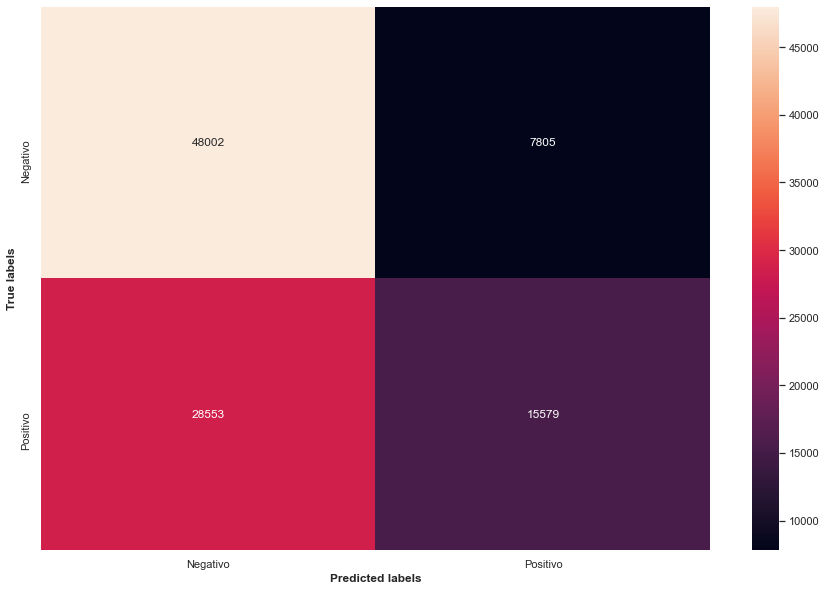

In [182]:
confusion_matrix_full(df_tratado_base)

## Alterando os threshold

Vamos também alterar o threshold dos modelos para analisar em que valores de precision teriamos um elevado recall

In [166]:
def plot_precsion_recall_curve(df,y_preds,y_true,probas,models):
    '''
    Função recebe o dataset, os y preditos, os y verdadeiros, as probabilidades preditas e os modelos
    Plota a curva de precision recall para cada um dos modelos e retorna um dicionário com as precision, recall e cada threshold
    '''
    #Dicionários para armazenar as métricas de cada um dos modelos
    dicio_precision_recall_ts = {}
    #Criando um grid de subplots
    fig,ax = plt.subplots()    
    #Loop para plotar a as curvas de precision recall
    for model in models:
        PrecisionRecallDisplay.from_predictions(y_test, y_preds[model],name=model,ax=ax)
        precision, recall, ts = precision_recall_curve(y_test,probas[model][:,1])
        dicio_precision_recall_ts[model] = {'precision':precision, 'recall':recall, 'ts':ts}
    plt.title('Precision Recall Curves')
    plt.xlabel('Recall (1 - Teste Positivo)')
    plt.ylabel('Precision (1 - Teste Positivo)')
    plt.axhline(y =0.44167334,ls='--',label='TS que maximiza o recall: 0.44',color='red') #thresold que maximiza o recall
    plt.legend(loc='upper right')
    plt.show()
    return dicio_precision_recall_ts

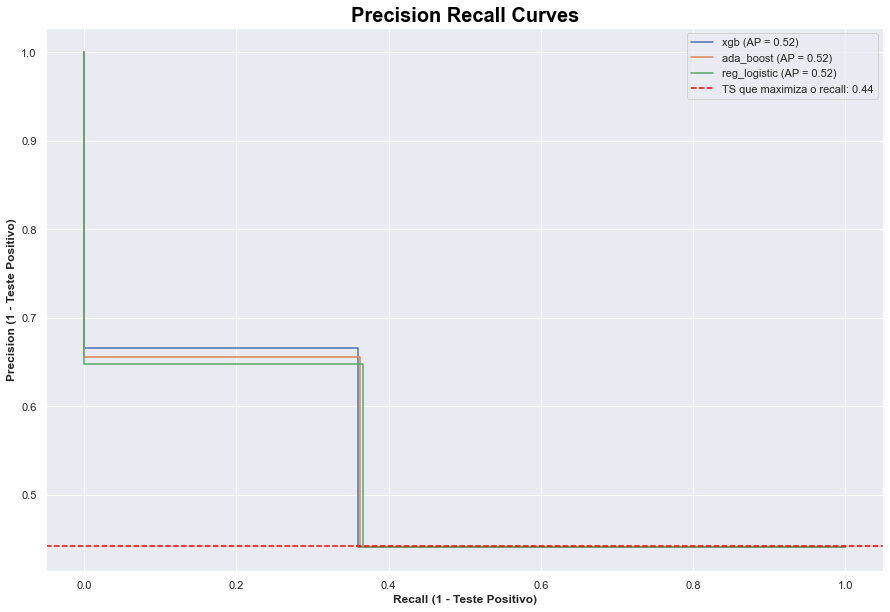

In [167]:
dicio_precsion_recall_ts = plot_precsion_recall_curve(df_tratado_base,preds,y_test,probas,models)

Para conseguir melhorar o recall além do que nossos modelos já conseguiram otimizar, seria necessário uma queda brusca na precision.

Para finalizar, vamos treinar os modelos com toda a base e realizar predições na base de produção

In [ ]:
#Criando nosso X e y
X = df_tratado_base.drop(columns=['covid_res']) 
y = df_tratado_base['covid_res']
#Dicionário para salvar as predições de cada modelo e as probabilidades
preds = {}
#Faremos o processo abaixo para cada modelo
for model in models:
    
    #Criando nosso pipeline. Como todos os dados já são numéricos não precisaremos fazer onehotencode
    #Apesar de somente a coluna idade precisar ser normalizada, aplicaremos a transformação em todas as
    #colunas como uma boa prática de sempre normalizar o dataset inteiro
    my_pipe = Pipeline(steps=[
                                ('Normalização dos dados',PowerTransformer()),
                                (model,models[model])
                            ])
    #Fitando o pipeline com a base inteira
    my_pipe.fit(X,y)
    #Predizendo os resultados com a base de produção
    y_pred = my_pipe.predict(df_prod_tratado)
    preds[model] = y_pred

pd.DataFrame(preds).to_csv('My_preds_final')

,xgb,ada_boost,reg_logistic
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,1,1,1
...,...,...,...
995,0,0,0
996,0,0,0
997,0,0,0
998,0,0,0


## Conclusão

Mesmo após otimizar os modelos, o recall não ficou satisfatório. Com a alteração do treshold, conseguimos aumentar nosso recall a custo de uma redução muito expressiva na precision, o que também não seria um cenário ideial, já que aumentarmos demais o erro tipo 1, podendo ocasionar uma falta de confiança por parte da população nos testes de covid.

A nossa variável target, o resultado do teste conseguiu ter os resultados negativos previstos bem em volume mas os positivos não (recall). Além disso, de todos os resultados que prevíamos, acertávmos próximo a 70% para testes positivos e para testes negativos (precision). Considerando que aqui o erro tipo 2 (falso negativo) é o mais fatal e prejudicial a população, não consigo considerar que noss modelo poderia ser colocado em produção. Algumas conclusões dos motivos desses resultados.

- A escolha dos dados (features) para prever o resultado do teste não foi adequada. Haviam features que ocorriam após o resultado do teste como internação, intubação e internação na UTI
- Uma abordagem mais lógica para o problema e que poderia gerar mais benefícios econômicos seria tentar prever a necessidade de internação, intubação ou internação na UTI a partir das features e usar o resultado do teste como uma feature também. Com essa predição poderia ser tomadas medidas pelos orgãos de saúde como forma de tratar a epidemia.
- Para prever o resultado do teste, usar features mais focadas em expressões de genes ou indicadores biológicos, como a saturação de oxigênio no sangue faria mais sentido e provavelmente levaria a um resultado mais satisfatório

Essas foram minhas conclusões e estou aberto a qualquer tipo de feedback.

IDEIAS futuras para o projeto
- Tentar usar a metodologia de inferência causal